In [1672]:
import os
import numpy as np
import pandas as pd
import matplotlib.pyplot as plt
import seaborn as sns
import datetime
import missingno as msno
import seaborn as sns
from sklearn.ensemble import RandomForestRegressor
from sklearn.metrics import r2_score,mean_squared_error
from scipy.stats import kurtosis, skew, normaltest
import scipy
from sklearn.impute import KNNImputer
from sklearn.model_selection import train_test_split
from sklearn.mixture import GaussianMixture
from scipy.spatial.distance import mahalanobis

from sklearn.model_selection import cross_val_score

from scipy.stats import probplot
import matplotlib.pyplot as plt

# DATA LOADING

In [1673]:
os.getcwd()
path="C:/Users/Bbarb/OneDrive/Desktop/..ML"
os.chdir(path)

In [1674]:
train = pd.read_csv('illinois_basing_train_04112023.csv')
test = pd.read_csv('illinois_basing_test_04112023.csv')

## Investigating data

In [1675]:
train.columns

Index(['SampleTimeUTC', 'Avg_PLT_CO2VentRate_TPH', 'Avg_CCS1_WHCO2InjPs_psi',
       'Avg_CCS1_WHCO2InjTp_F', 'Avg_CCS1_ANPs_psi', 'Avg_CCS1_DH6325Ps_psi',
       'Avg_CCS1_DH6325Tp_F', 'Avg_VW1_WBTbgPs_psi', 'Avg_VW1_WBTbgTp_F',
       'Avg_VW1_ANPs_psi', 'Avg_VW1_Z11D4917Ps_psi', 'Avg_VW1_Z11D4917Tp_F',
       'Avg_VW1_Z10D5001Ps_psi', 'Avg_VW1_Z10D5001Tp_F',
       'Avg_VW1_Z09D5653Ps_psi', 'Avg_VW1_Z09D5653Tp_F',
       'Avg_VW1_Z08D5840Ps_psi', 'Avg_VW1_Z08D5840Tp_F',
       'Avg_VW1_Z07D6416Ps_psi', 'Avg_VW1_Z07D6416Tp_F',
       'Avg_VW1_Z06D6632Ps_psi', 'Avg_VW1_Z06D6632Tp_F',
       'Avg_VW1_Z05D6720Ps_psi', 'Avg_VW1_Z05D6720Tp_F',
       'Avg_VW1_Z04D6837Ps_psi', 'Avg_VW1_Z04D6837Tp_F',
       'Avg_VW1_Z03D6945Ps_psi', 'Avg_VW1_Z03D6945Tp_F',
       'Avg_VW1_Z02D6982Ps_psi', 'Avg_VW1_Z02D6982Tp_F',
       'Avg_VW1_Z01D7061Ps_psi', 'Avg_VW1_Z01D7061Tp_F',
       'Avg_VW1_Z0910D5482Ps_psi', 'Avg_VW1_Z0910D5482Tp_F', 'inj_diff '],
      dtype='object')

In [1676]:
train.shape

(27398, 35)

In [1677]:
test.shape

(201, 34)

In [1678]:
train.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 27398 entries, 0 to 27397
Data columns (total 35 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   SampleTimeUTC             27398 non-null  object 
 1   Avg_PLT_CO2VentRate_TPH   27398 non-null  float64
 2   Avg_CCS1_WHCO2InjPs_psi   27270 non-null  float64
 3   Avg_CCS1_WHCO2InjTp_F     27398 non-null  float64
 4   Avg_CCS1_ANPs_psi         27304 non-null  float64
 5   Avg_CCS1_DH6325Ps_psi     27398 non-null  float64
 6   Avg_CCS1_DH6325Tp_F       27398 non-null  float64
 7   Avg_VW1_WBTbgPs_psi       26127 non-null  float64
 8   Avg_VW1_WBTbgTp_F         26061 non-null  float64
 9   Avg_VW1_ANPs_psi          23487 non-null  float64
 10  Avg_VW1_Z11D4917Ps_psi    26688 non-null  float64
 11  Avg_VW1_Z11D4917Tp_F      26709 non-null  float64
 12  Avg_VW1_Z10D5001Ps_psi    26688 non-null  float64
 13  Avg_VW1_Z10D5001Tp_F      26709 non-null  float64
 14  Avg_VW

In [1679]:
test.info()

<class 'pandas.core.frame.DataFrame'>
RangeIndex: 201 entries, 0 to 200
Data columns (total 34 columns):
 #   Column                    Non-Null Count  Dtype  
---  ------                    --------------  -----  
 0   SampleTimeUTC             201 non-null    object 
 1   Avg_PLT_CO2VentRate_TPH   201 non-null    float64
 2   Avg_CCS1_WHCO2InjPs_psi   201 non-null    float64
 3   Avg_CCS1_WHCO2InjTp_F     201 non-null    float64
 4   Avg_CCS1_ANPs_psi         201 non-null    float64
 5   Avg_CCS1_DH6325Ps_psi     201 non-null    float64
 6   Avg_CCS1_DH6325Tp_F       201 non-null    float64
 7   Avg_VW1_WBTbgPs_psi       201 non-null    float64
 8   Avg_VW1_WBTbgTp_F         201 non-null    float64
 9   Avg_VW1_ANPs_psi          197 non-null    float64
 10  Avg_VW1_Z11D4917Ps_psi    201 non-null    float64
 11  Avg_VW1_Z11D4917Tp_F      201 non-null    float64
 12  Avg_VW1_Z10D5001Ps_psi    201 non-null    float64
 13  Avg_VW1_Z10D5001Tp_F      201 non-null    float64
 14  Avg_VW1_Z0

In [1680]:
train.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Avg_PLT_CO2VentRate_TPH,27398.0,2.122022,133.162146,0.00000,0.000000,0.058333,0.150000,18333.150000
Avg_CCS1_WHCO2InjPs_psi,27270.0,1239.861825,817.740091,0.00000,1235.469308,1338.872024,1361.045834,39032.410160
Avg_CCS1_WHCO2InjTp_F,27398.0,89.766221,48.287324,0.00000,92.953925,96.268226,96.851236,2879.416016
Avg_CCS1_ANPs_psi,27304.0,560.862134,445.931405,0.00000,523.536663,564.901591,604.763645,24105.630860
Avg_CCS1_DH6325Ps_psi,27398.0,3244.168246,173.471253,0.00000,3233.023426,3286.067870,3324.735273,3515.880615
Avg_CCS1_DH6325Tp_F,27398.0,127.738740,7.167508,0.00000,127.166621,130.109008,131.082033,135.670399
Avg_VW1_WBTbgPs_psi,26127.0,1801.844864,999.374082,0.00000,2173.526853,2322.382139,2379.839354,4954.731745
Avg_VW1_WBTbgTp_F,26061.0,80.794406,44.286916,0.00000,103.423346,104.196940,105.044018,120.056561
Avg_VW1_ANPs_psi,23487.0,525.000311,3988.707539,0.00000,0.452148,4.656250,16.900514,31993.509770
Avg_VW1_Z11D4917Ps_psi,26688.0,1597.476442,873.254402,0.00000,2070.333608,2073.364497,2074.094025,2377.999424


In [1681]:
test.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Avg_PLT_CO2VentRate_TPH,201.0,0.921872,1.764105,0.000000,0.275000,0.408333,1.633333,16.600000
Avg_CCS1_WHCO2InjPs_psi,201.0,1345.153592,213.702344,2.253255,1399.276364,1403.883153,1411.612355,1420.542983
Avg_CCS1_WHCO2InjTp_F,201.0,93.490199,9.542911,47.104775,95.707924,96.275185,96.561928,102.449867
Avg_CCS1_ANPs_psi,201.0,503.071620,34.185322,432.052225,483.594512,505.896142,522.013451,658.335748
Avg_CCS1_DH6325Ps_psi,201.0,3349.569130,83.034673,3080.499689,3364.381673,3370.058956,3383.651774,3403.902148
Avg_CCS1_DH6325Tp_F,201.0,128.971283,1.184947,124.369378,129.101550,129.378667,129.567974,129.900645
Avg_VW1_WBTbgPs_psi,201.0,2323.846507,2.422593,2322.399902,2322.399902,2322.485856,2323.178274,2329.147909
Avg_VW1_WBTbgTp_F,201.0,104.933402,0.012986,104.890602,104.928493,104.940697,104.940697,104.952787
Avg_VW1_ANPs_psi,197.0,2.143719,1.047141,0.100585,1.202881,2.290528,2.809631,3.937561
Avg_VW1_Z11D4917Ps_psi,201.0,2069.913372,0.105827,2069.692133,2069.810765,2069.981110,2070.010986,2070.010986


In [1682]:
train.std();

C:\Users\Bbarb\AppData\Local\Temp\ipykernel_11976\3694654797.py:1: FutureWarning: The default value of numeric_only in DataFrame.std is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  train.std();


In [1683]:
test.std();

C:\Users\Bbarb\AppData\Local\Temp\ipykernel_11976\267171207.py:1: FutureWarning: The default value of numeric_only in DataFrame.std is deprecated. In a future version, it will default to False. In addition, specifying 'numeric_only=None' is deprecated. Select only valid columns or specify the value of numeric_only to silence this warning.
  test.std();


#### 'inj_diff' variable is renamed due to extra spacing in column name.

In [1684]:
train.columns = [*train.columns[:-1], 'inj_diff']

# DATA EXPLORATION

#### Handling Date object: 'SampleTimeUTC' is changed from object to datetime data type. It is then indexed in both the train and test set.


In [1685]:
train['SampleTimeUTC'] = pd.to_datetime(train['SampleTimeUTC'])

In [1686]:
test['SampleTimeUTC'] = pd.to_datetime(test['SampleTimeUTC'])

In [1687]:
train = train.set_index('SampleTimeUTC')

In [1688]:
test = test.set_index('SampleTimeUTC')

### Raw Data Time Series Plots

### Monitoring at the IBDP started in 2009 which is identified as the pre-injection phase and represented as the blue data in the plots. Injection at IBDP started on November 17, 2011 and is presented as orange data in the plots. The train set holds data from pre-injection and injection phases of the project. The train set holds data from the injection phase which is a continuation of the data collected 

In [1689]:
split_date = '2011-11-17'

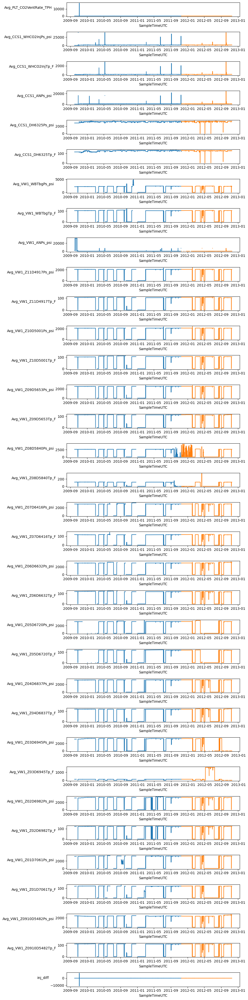

In [1690]:
#Blue: Pre Injection   Orange: Injection. It can be seen by the varaiability in pressure in Zone 8 that injection has begun.

fig, axs = plt.subplots(nrows=len(train.columns), figsize=(10, 40))

for i, col in enumerate(train.columns):
    axs[i].plot(train.loc[train.index < split_date].index, train.loc[train.index < split_date, col])
    axs[i].plot(train.loc[train.index >= split_date].index, train.loc[train.index >= split_date, col])
    axs[i].set_xlabel('SampleTimeUTC')
    axs[i].set_ylabel(col, rotation=0, ha='right')

plt.tight_layout()
plt.show();

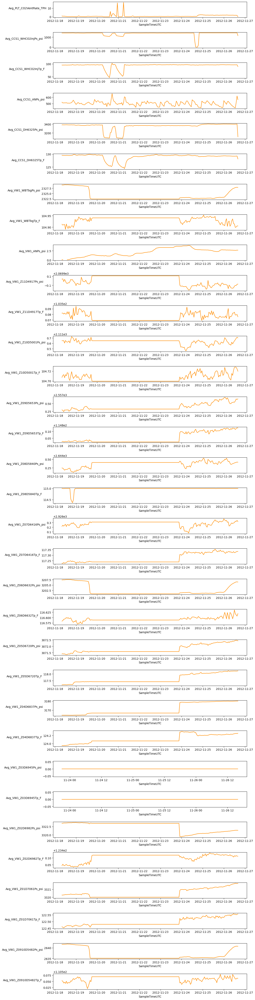

In [1691]:
fig, axs = plt.subplots(nrows=len(test.columns), figsize=(13, 50))

for i, col in enumerate(test.columns):
    axs[i].plot(test.index, test[col], color='darkorange')
    axs[i].set_xlabel('SampleTimeUTC')
    axs[i].set_ylabel(col, rotation=0, ha='right')
    
plt.tight_layout()
plt.show();

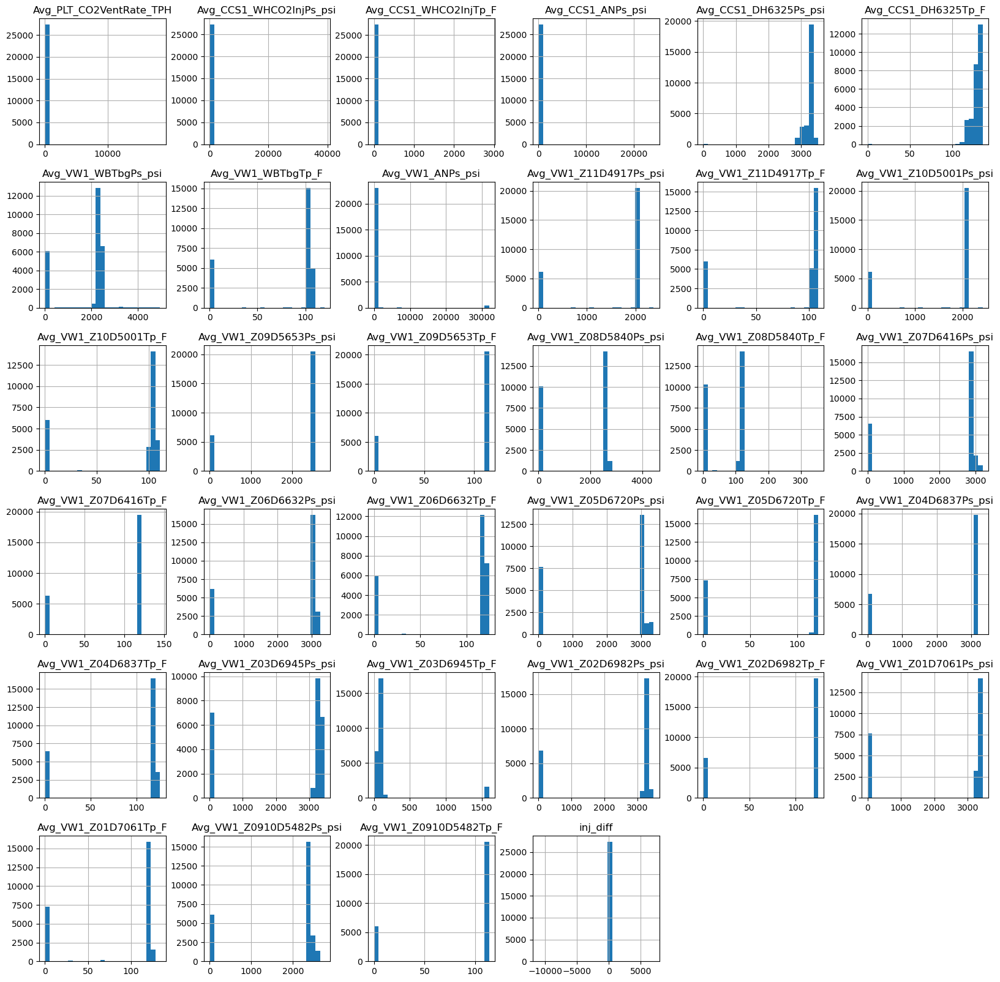

In [1692]:
train.hist(bins=25, figsize=(20, 20))
plt.show();

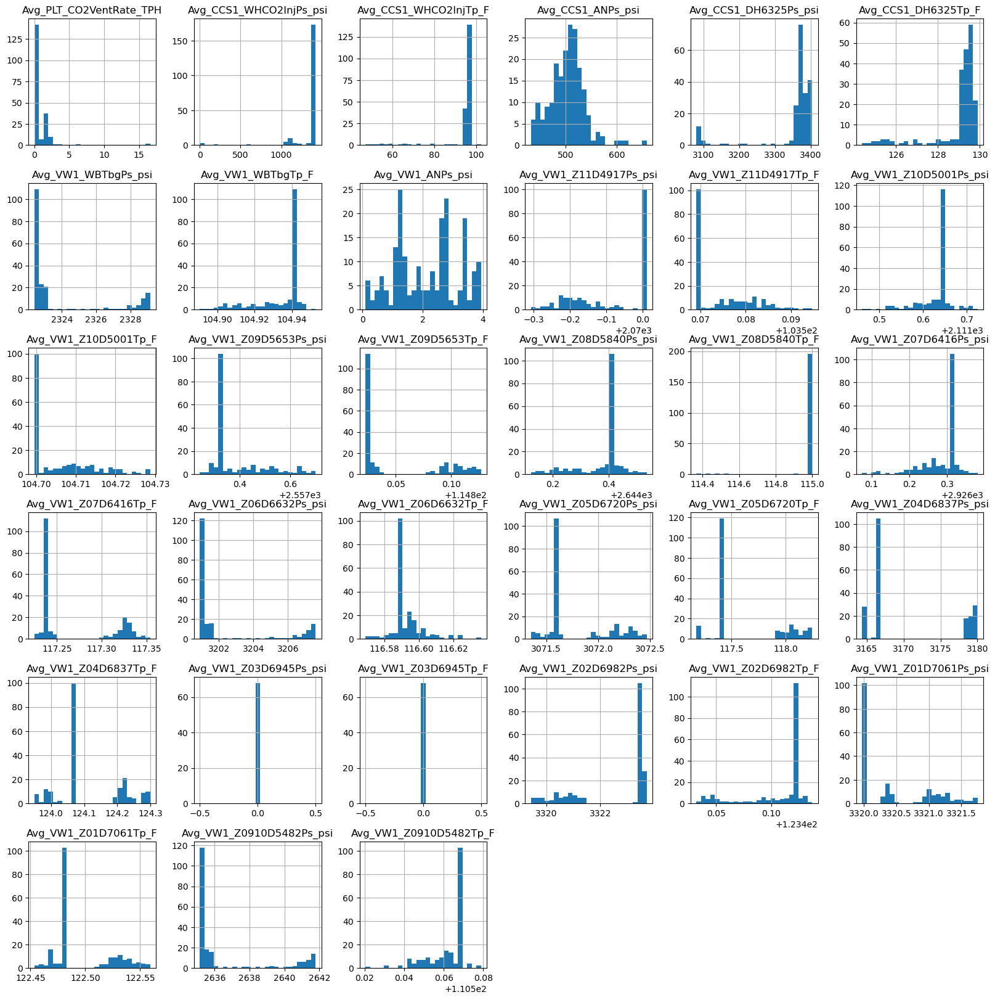

In [1693]:
test.hist(bins=25, figsize=(20, 20))
plt.show();

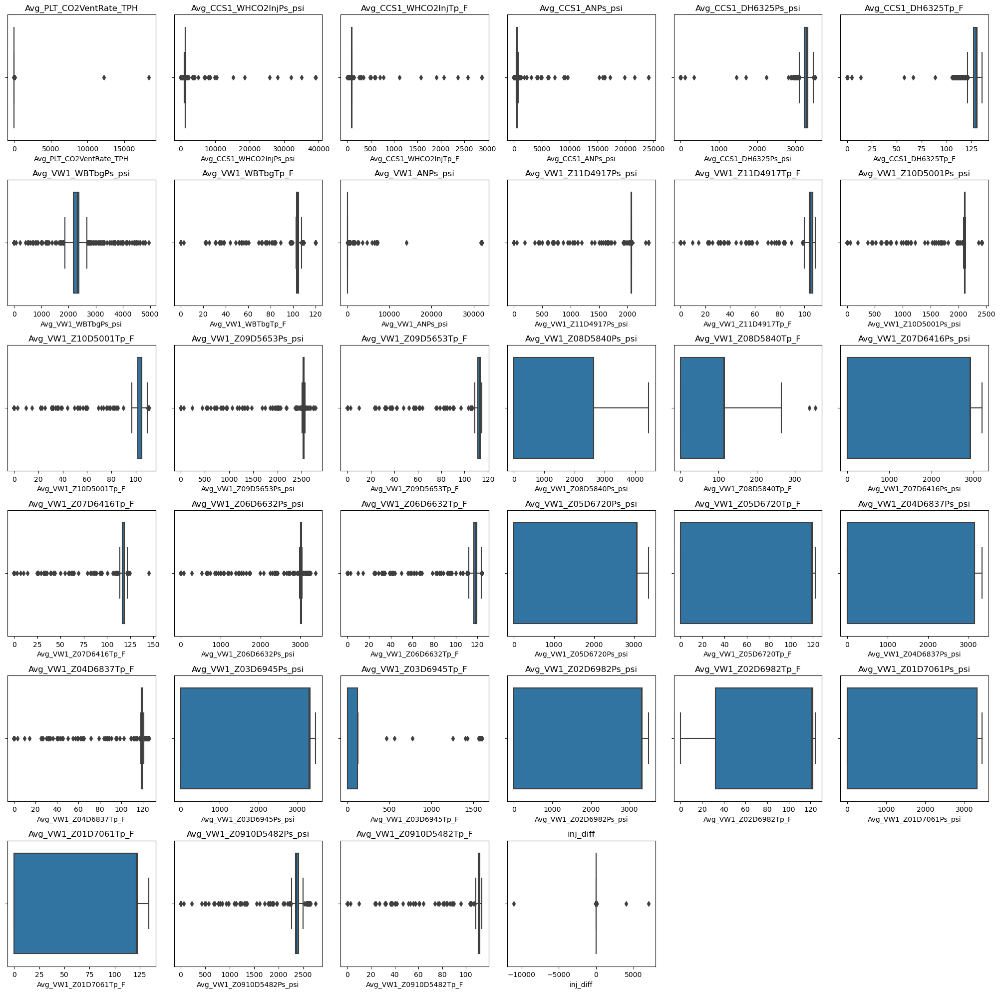

In [1694]:
fig, axs = plt.subplots(nrows=6, ncols=6, figsize=(20, 20))
axs = axs.flatten()

for i, col in enumerate(train.columns):
    sns.boxplot(x=train[col], ax=axs[i])
    axs[i].set_title(col)

for j in range(i+1, len(axs)):
    axs[j].remove()

plt.tight_layout()
plt.show();

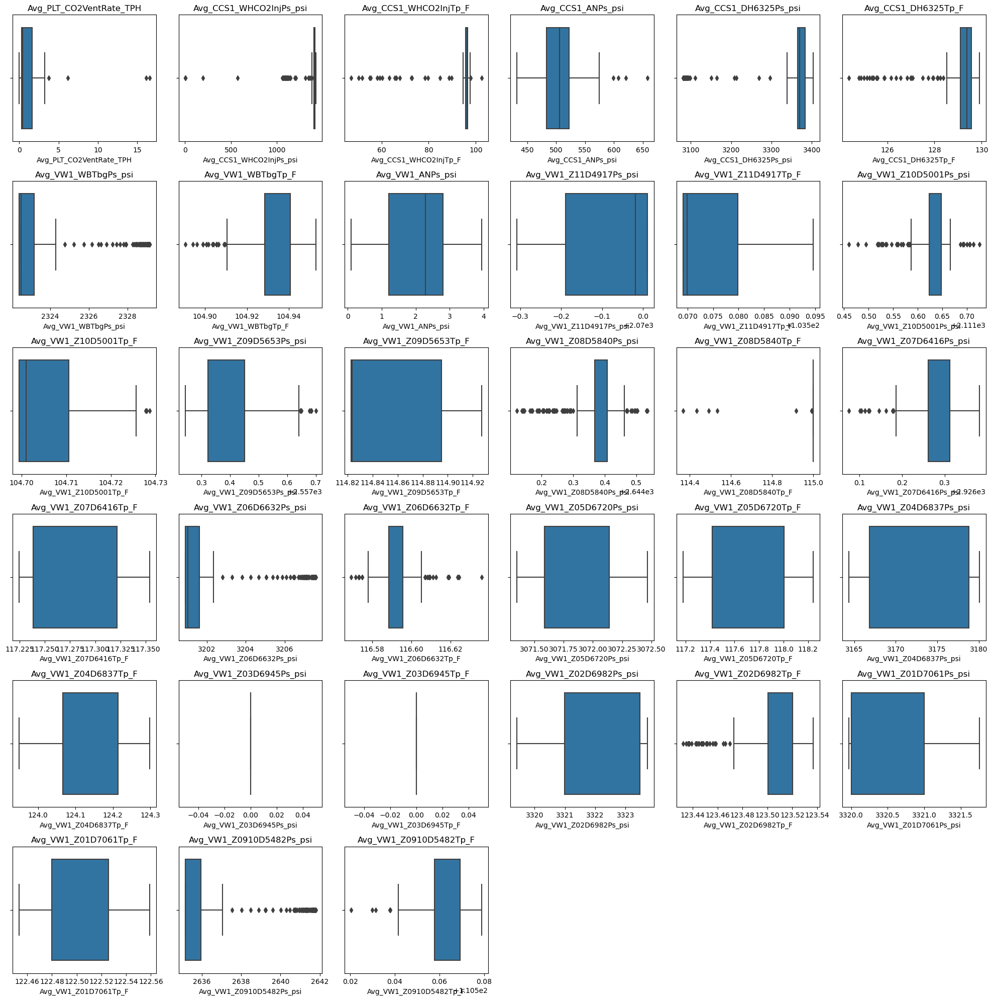

In [1695]:
fig, axs = plt.subplots(nrows=6, ncols=6, figsize=(20, 20))
axs = axs.flatten()

for i, col in enumerate(test.columns):
    sns.boxplot(x=test[col], ax=axs[i])
    axs[i].set_title(col)

for j in range(i+1, len(axs)):
    axs[j].remove()
    
plt.tight_layout()
plt.show();

### Investigating Missing Data using Missingness Matrix

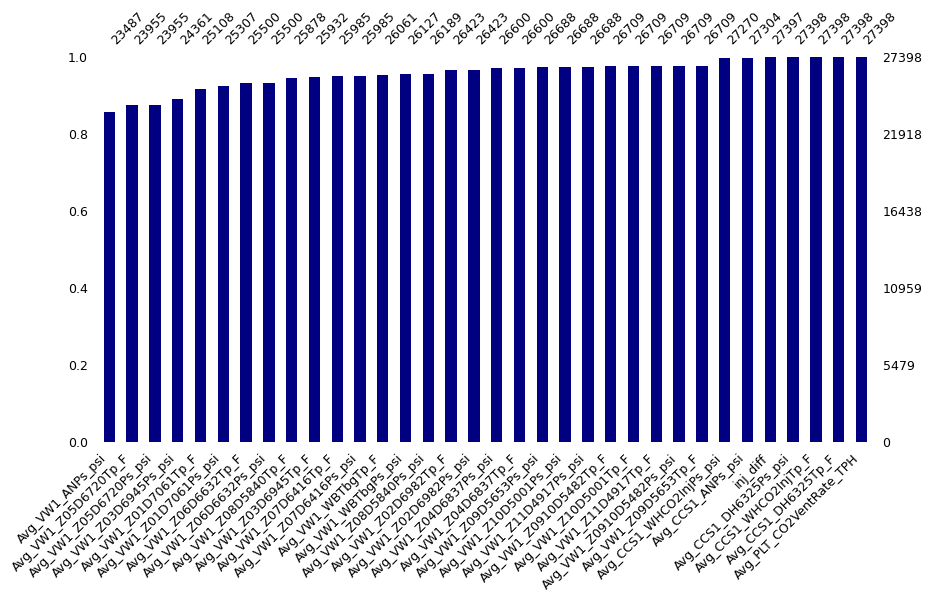

In [1696]:
msno.bar(train, color="navy", sort="ascending", figsize=(10,5), fontsize=9);

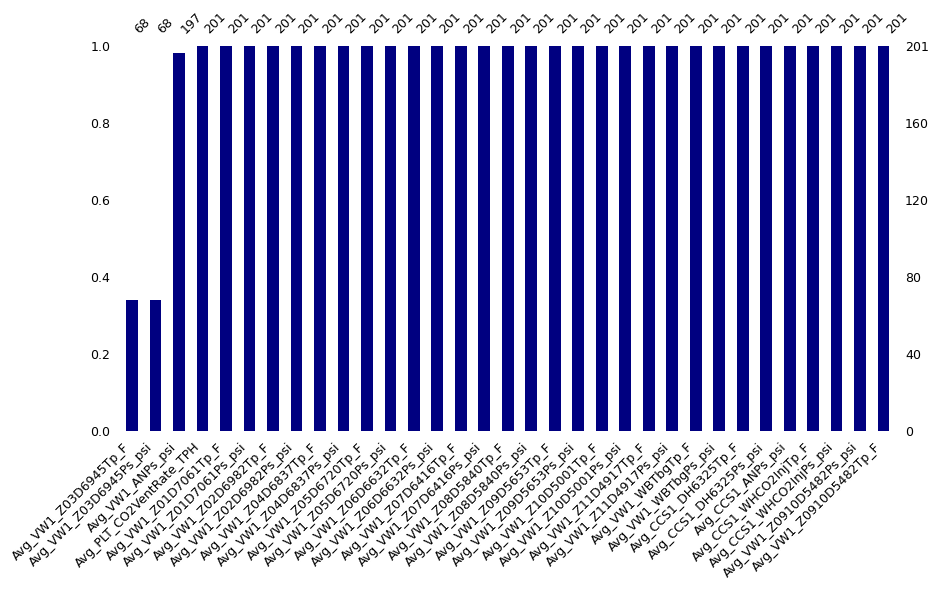

In [1697]:
msno.bar(test, color="navy", sort="ascending", figsize=(10,5), fontsize=9);

##### Avg_VW1_ANPs_psi, Avg_VW1_Z03D6945Ps_psi, Avg_VW1_Z05D6720Ps_psi and Avg_VW1_Z05D6720Tp_F are missing the most values.  


In [1698]:
miss_val = train.isnull().sum()  
miss_val_pct = round(100 * train.isnull().sum() / len(train),2)
miss_val_table = pd.concat([miss_val, miss_val_pct], axis=1,  sort=True)
miss_val_table = miss_val_table[miss_val_table[0] > 0]
miss_val_table.rename(columns = {0 : 'Missing Values', 1 : '%'});

#### In the test set, Avg_VW1_Z03D6945Ps_psi and Avg_VW1_Z03D6945Tp_F are significantlly missing in appearance.


In [1699]:
miss_val = test.isnull().sum()  
miss_val_pct = round(100 * test.isnull().sum() / len(test),2)
miss_val_table = pd.concat([miss_val, miss_val_pct], axis=1,  sort=True)
miss_val_table = miss_val_table[miss_val_table[0] > 0] 
miss_val_table.rename(columns = {0 : 'Missing Values', 1 : '%'});

### Counting 0 appearances

In [1700]:
(train == 0).sum()

Avg_PLT_CO2VentRate_TPH      8818
Avg_CCS1_WHCO2InjPs_psi       242
Avg_CCS1_WHCO2InjTp_F         242
Avg_CCS1_ANPs_psi             242
Avg_CCS1_DH6325Ps_psi          39
Avg_CCS1_DH6325Tp_F            39
Avg_VW1_WBTbgPs_psi          6078
Avg_VW1_WBTbgTp_F            6004
Avg_VW1_ANPs_psi              249
Avg_VW1_Z11D4917Ps_psi       6127
Avg_VW1_Z11D4917Tp_F         6004
Avg_VW1_Z10D5001Ps_psi       6127
Avg_VW1_Z10D5001Tp_F         6004
Avg_VW1_Z09D5653Ps_psi       6126
Avg_VW1_Z09D5653Tp_F         6004
Avg_VW1_Z08D5840Ps_psi      10012
Avg_VW1_Z08D5840Tp_F        10310
Avg_VW1_Z07D6416Ps_psi       6499
Avg_VW1_Z07D6416Tp_F         6355
Avg_VW1_Z06D6632Ps_psi       6150
Avg_VW1_Z06D6632Tp_F         6006
Avg_VW1_Z05D6720Ps_psi       7665
Avg_VW1_Z05D6720Tp_F         7347
Avg_VW1_Z04D6837Ps_psi       6736
Avg_VW1_Z04D6837Tp_F         6420
Avg_VW1_Z03D6945Ps_psi       7003
Avg_VW1_Z03D6945Tp_F         6718
Avg_VW1_Z02D6982Ps_psi       6866
Avg_VW1_Z02D6982Tp_F         6550
Avg_VW1_Z01D70

In [1701]:
(test == 0).sum()

Avg_PLT_CO2VentRate_TPH     11
Avg_CCS1_WHCO2InjPs_psi      0
Avg_CCS1_WHCO2InjTp_F        0
Avg_CCS1_ANPs_psi            0
Avg_CCS1_DH6325Ps_psi        0
Avg_CCS1_DH6325Tp_F          0
Avg_VW1_WBTbgPs_psi          0
Avg_VW1_WBTbgTp_F            0
Avg_VW1_ANPs_psi             0
Avg_VW1_Z11D4917Ps_psi       0
Avg_VW1_Z11D4917Tp_F         0
Avg_VW1_Z10D5001Ps_psi       0
Avg_VW1_Z10D5001Tp_F         0
Avg_VW1_Z09D5653Ps_psi       0
Avg_VW1_Z09D5653Tp_F         0
Avg_VW1_Z08D5840Ps_psi       0
Avg_VW1_Z08D5840Tp_F         0
Avg_VW1_Z07D6416Ps_psi       0
Avg_VW1_Z07D6416Tp_F         0
Avg_VW1_Z06D6632Ps_psi       0
Avg_VW1_Z06D6632Tp_F         0
Avg_VW1_Z05D6720Ps_psi       0
Avg_VW1_Z05D6720Tp_F         0
Avg_VW1_Z04D6837Ps_psi       0
Avg_VW1_Z04D6837Tp_F         0
Avg_VW1_Z03D6945Ps_psi      68
Avg_VW1_Z03D6945Tp_F        68
Avg_VW1_Z02D6982Ps_psi       0
Avg_VW1_Z02D6982Tp_F         0
Avg_VW1_Z01D7061Ps_psi       0
Avg_VW1_Z01D7061Tp_F         0
Avg_VW1_Z0910D5482Ps_psi     0
Avg_VW1_

In [1702]:
train.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Avg_PLT_CO2VentRate_TPH,27398.0,2.122022,133.162146,0.00000,0.000000,0.058333,0.150000,18333.150000
Avg_CCS1_WHCO2InjPs_psi,27270.0,1239.861825,817.740091,0.00000,1235.469308,1338.872024,1361.045834,39032.410160
Avg_CCS1_WHCO2InjTp_F,27398.0,89.766221,48.287324,0.00000,92.953925,96.268226,96.851236,2879.416016
Avg_CCS1_ANPs_psi,27304.0,560.862134,445.931405,0.00000,523.536663,564.901591,604.763645,24105.630860
Avg_CCS1_DH6325Ps_psi,27398.0,3244.168246,173.471253,0.00000,3233.023426,3286.067870,3324.735273,3515.880615
Avg_CCS1_DH6325Tp_F,27398.0,127.738740,7.167508,0.00000,127.166621,130.109008,131.082033,135.670399
Avg_VW1_WBTbgPs_psi,26127.0,1801.844864,999.374082,0.00000,2173.526853,2322.382139,2379.839354,4954.731745
Avg_VW1_WBTbgTp_F,26061.0,80.794406,44.286916,0.00000,103.423346,104.196940,105.044018,120.056561
Avg_VW1_ANPs_psi,23487.0,525.000311,3988.707539,0.00000,0.452148,4.656250,16.900514,31993.509770
Avg_VW1_Z11D4917Ps_psi,26688.0,1597.476442,873.254402,0.00000,2070.333608,2073.364497,2074.094025,2377.999424


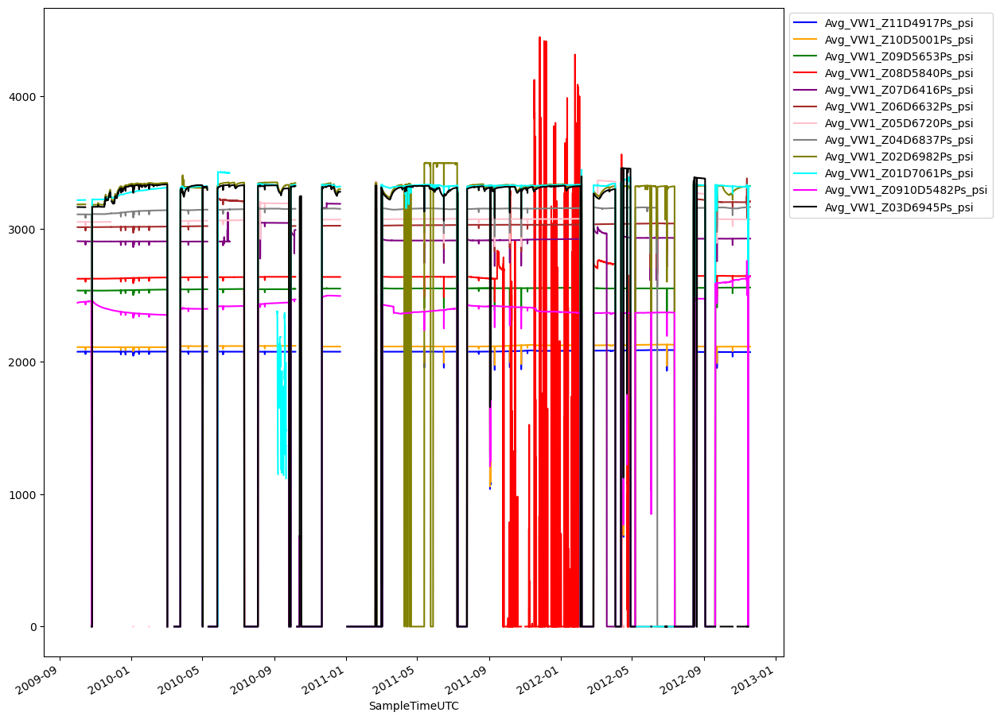

In [1703]:
zone_colors = {'Avg_VW1_Z11D4917Ps_psi': 'blue',
               'Avg_VW1_Z10D5001Ps_psi': 'orange',
               'Avg_VW1_Z09D5653Ps_psi': 'green',
               'Avg_VW1_Z08D5840Ps_psi': 'red',
               'Avg_VW1_Z07D6416Ps_psi': 'purple',
               'Avg_VW1_Z06D6632Ps_psi': 'brown',
               'Avg_VW1_Z05D6720Ps_psi': 'pink',
               'Avg_VW1_Z04D6837Ps_psi': 'gray',
               'Avg_VW1_Z02D6982Ps_psi': 'olive',
               'Avg_VW1_Z01D7061Ps_psi': 'cyan',
               'Avg_VW1_Z0910D5482Ps_psi': 'magenta',
               'Avg_VW1_Z03D6945Ps_psi': 'black'}

for zone, color in zone_colors.items():
    train[zone].plot(color=color)
    
plt.legend(zone_colors.keys(), bbox_to_anchor=(1.0, 1.0));

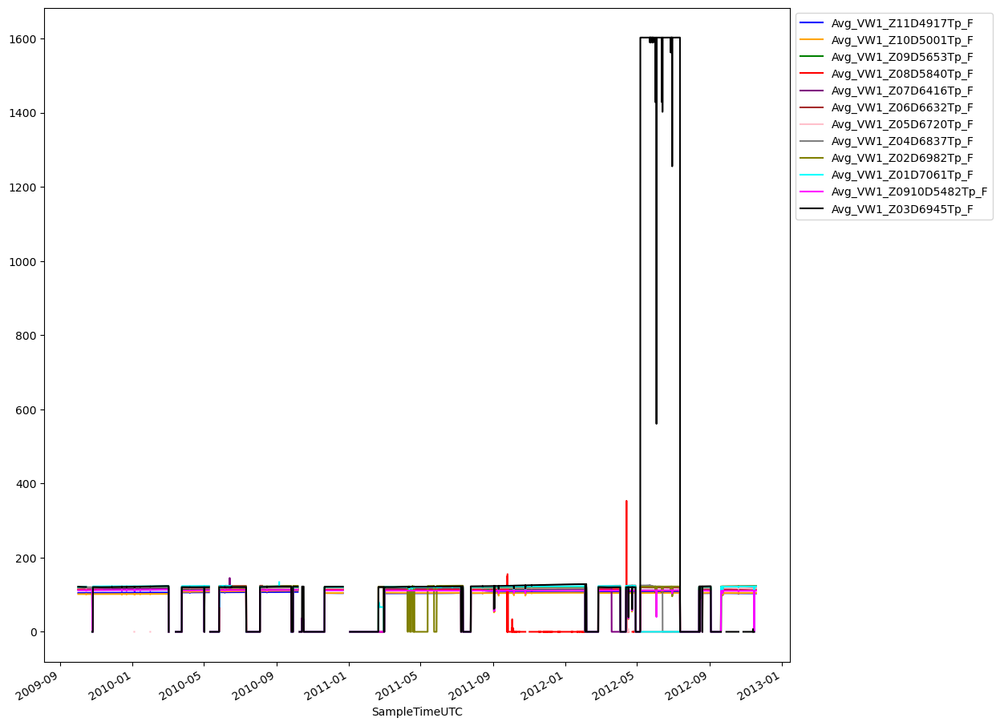

In [1704]:
zone_colors = {'Avg_VW1_Z11D4917Tp_F': 'blue',
               'Avg_VW1_Z10D5001Tp_F': 'orange',
               'Avg_VW1_Z09D5653Tp_F': 'green',
               'Avg_VW1_Z08D5840Tp_F': 'red',
               'Avg_VW1_Z07D6416Tp_F': 'purple',
               'Avg_VW1_Z06D6632Tp_F': 'brown',
               'Avg_VW1_Z05D6720Tp_F': 'pink',
               'Avg_VW1_Z04D6837Tp_F': 'gray',
               'Avg_VW1_Z02D6982Tp_F': 'olive',
               'Avg_VW1_Z01D7061Tp_F': 'cyan',
               'Avg_VW1_Z0910D5482Tp_F': 'magenta',
               'Avg_VW1_Z03D6945Tp_F': 'black'}

for zone, color in zone_colors.items():
    train[zone].plot(color=color)

plt.legend(zone_colors.keys(), bbox_to_anchor=(1.0, 1.0));

# DATA PREPROCESSING

### Predicting injection rate delta using only injection data; pre injection data is filtered out. 

In [1705]:
train = train[(train.index > '2012-02-26')]
train = train[(train.index < '2012-03-29')]

### After experimentation, a filter on the train set to include observations between ‘2012-02-26’ and ‘2012-03-29’ best resembled the distribution and trends portrayed in the test set. It is important to maintain the integrity of the train set throughout the preprocessing techniques.

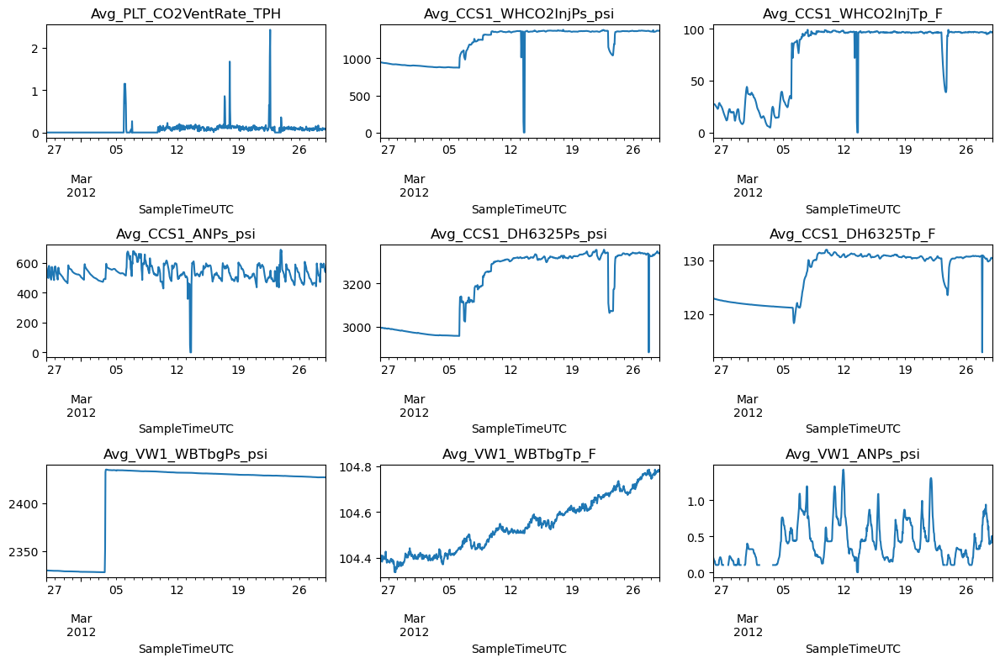

In [1706]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(12,8))

for i, col in enumerate(train[['Avg_PLT_CO2VentRate_TPH', 'Avg_CCS1_WHCO2InjPs_psi', 'Avg_CCS1_WHCO2InjTp_F', 'Avg_CCS1_ANPs_psi', 'Avg_CCS1_DH6325Ps_psi', 'Avg_CCS1_DH6325Tp_F', 'Avg_VW1_WBTbgPs_psi', 'Avg_VW1_WBTbgTp_F', 'Avg_VW1_ANPs_psi']].columns):
    ax = axes.flatten()[i]
    train[col].plot(ax=ax)
    ax.set_title(col)
    
plt.tight_layout()
plt.show();

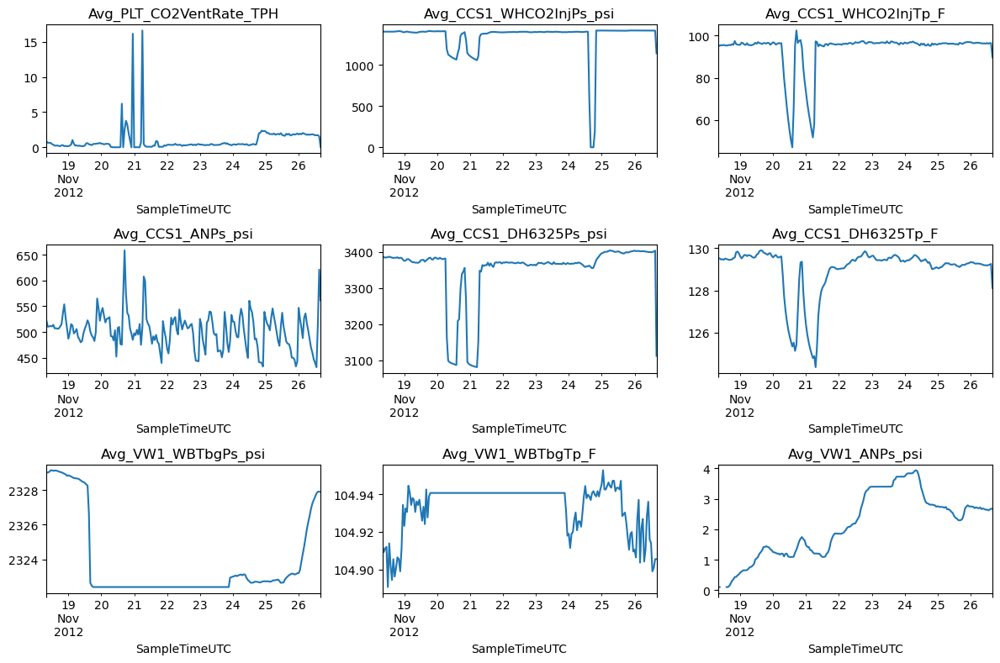

In [1707]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(12,8))

for i, col in enumerate(test[['Avg_PLT_CO2VentRate_TPH', 'Avg_CCS1_WHCO2InjPs_psi', 'Avg_CCS1_WHCO2InjTp_F', 'Avg_CCS1_ANPs_psi', 'Avg_CCS1_DH6325Ps_psi', 'Avg_CCS1_DH6325Tp_F', 'Avg_VW1_WBTbgPs_psi', 'Avg_VW1_WBTbgTp_F', 'Avg_VW1_ANPs_psi']].columns):
    ax = axes.flatten()[i]
    test[col].plot(ax=ax)
    ax.set_title(col)
    
plt.tight_layout()
plt.show();

In [1708]:
corr_train = train[train.columns[1:]].corr()['inj_diff'][:].sort_values(ascending=True).to_frame()

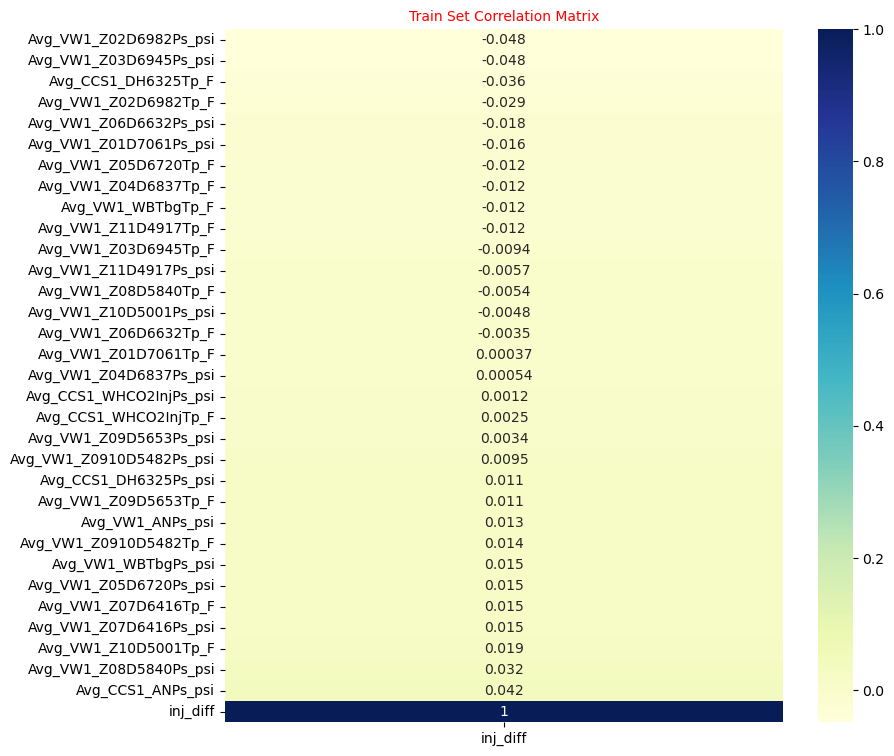

In [1709]:
plt.figure(figsize = (9,9))
ax = sns.heatmap(corr_train, annot=True,cmap="YlGnBu") #seaborn heatmap
plt.title('Train Set Correlation Matrix', fontsize = 10, color = 'red');

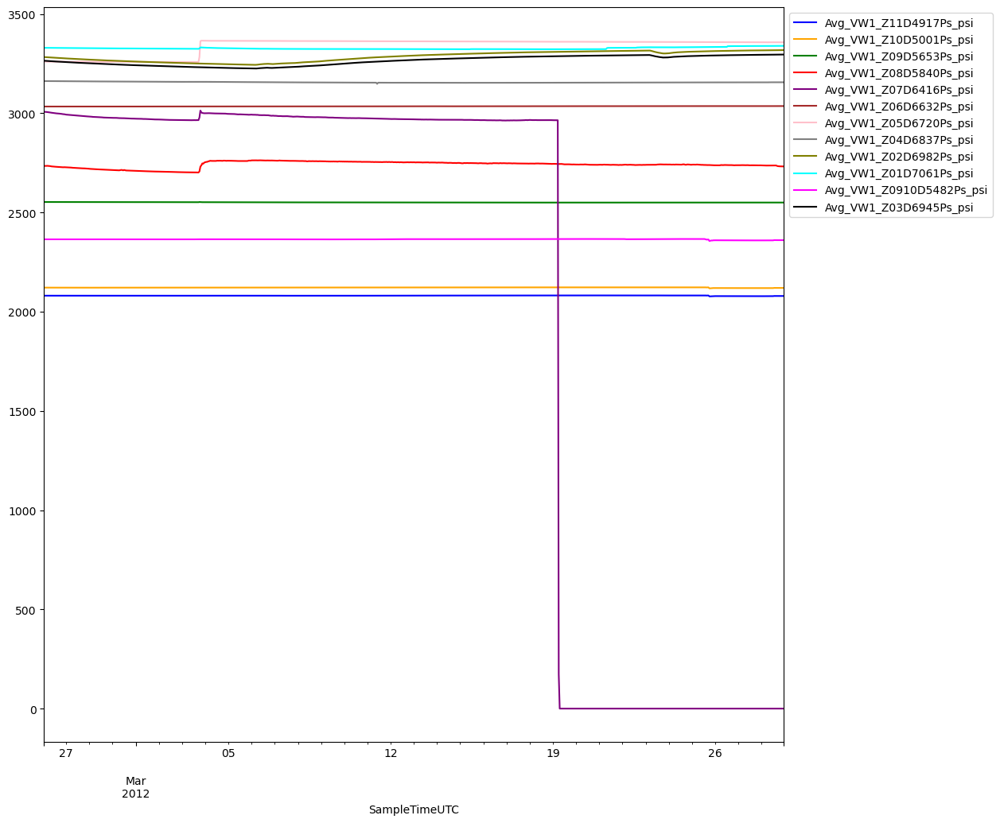

In [1710]:
zone_colors = {'Avg_VW1_Z11D4917Ps_psi': 'blue',
               'Avg_VW1_Z10D5001Ps_psi': 'orange',
               'Avg_VW1_Z09D5653Ps_psi': 'green',
               'Avg_VW1_Z08D5840Ps_psi': 'red',
               'Avg_VW1_Z07D6416Ps_psi': 'purple',
               'Avg_VW1_Z06D6632Ps_psi': 'brown',
               'Avg_VW1_Z05D6720Ps_psi': 'pink',
               'Avg_VW1_Z04D6837Ps_psi': 'gray',
               'Avg_VW1_Z02D6982Ps_psi': 'olive',
               'Avg_VW1_Z01D7061Ps_psi': 'cyan',
               'Avg_VW1_Z0910D5482Ps_psi': 'magenta',
               'Avg_VW1_Z03D6945Ps_psi': 'black'}

for zone, color in zone_colors.items():
    train[zone].plot(color=color)
    ax.set_xlabel('SampleTimeUTC')
    
plt.legend(zone_colors.keys(), bbox_to_anchor=(1.0, 1.0));

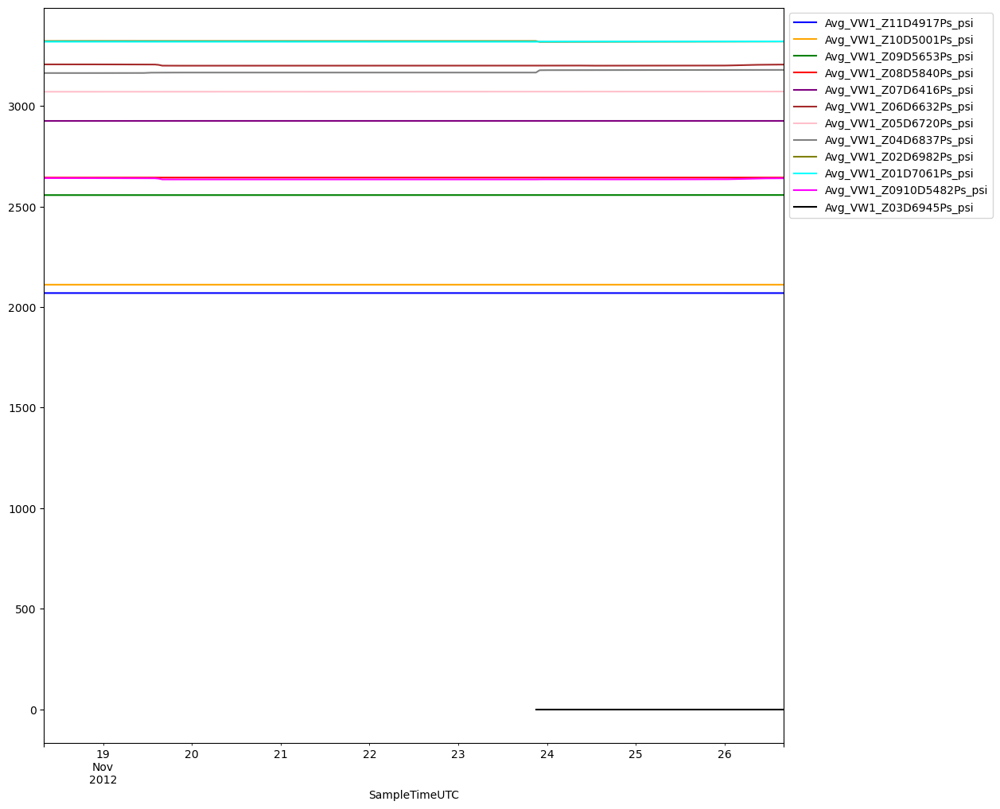

In [1711]:
zone_colors = {'Avg_VW1_Z11D4917Ps_psi': 'blue',
               'Avg_VW1_Z10D5001Ps_psi': 'orange',
               'Avg_VW1_Z09D5653Ps_psi': 'green',
               'Avg_VW1_Z08D5840Ps_psi': 'red',
               'Avg_VW1_Z07D6416Ps_psi': 'purple',
               'Avg_VW1_Z06D6632Ps_psi': 'brown',
               'Avg_VW1_Z05D6720Ps_psi': 'pink',
               'Avg_VW1_Z04D6837Ps_psi': 'gray',
               'Avg_VW1_Z02D6982Ps_psi': 'olive',
               'Avg_VW1_Z01D7061Ps_psi': 'cyan',
               'Avg_VW1_Z0910D5482Ps_psi': 'magenta',
               'Avg_VW1_Z03D6945Ps_psi': 'black'}

for zone, color in zone_colors.items():
    test[zone].plot(color=color)

plt.legend(zone_colors.keys(), bbox_to_anchor=(1.0, 1.0));

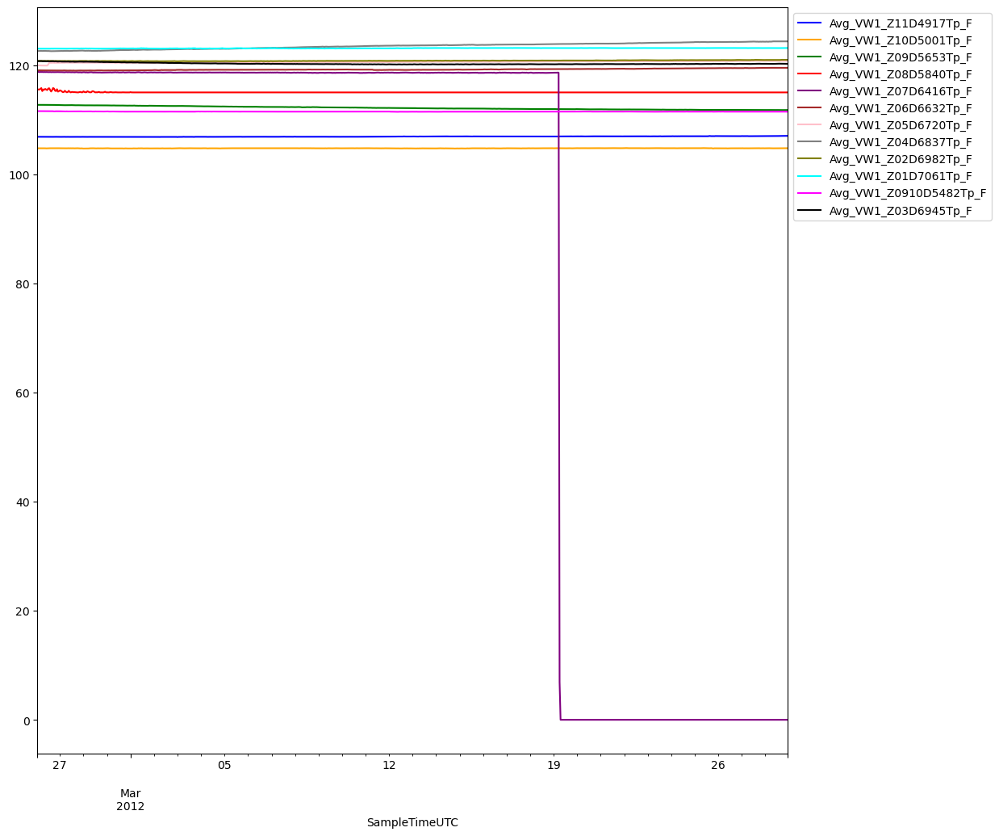

In [1712]:
zone_colors = {'Avg_VW1_Z11D4917Tp_F': 'blue',
               'Avg_VW1_Z10D5001Tp_F': 'orange',
               'Avg_VW1_Z09D5653Tp_F': 'green',
               'Avg_VW1_Z08D5840Tp_F': 'red',
               'Avg_VW1_Z07D6416Tp_F': 'purple',
               'Avg_VW1_Z06D6632Tp_F': 'brown',
               'Avg_VW1_Z05D6720Tp_F': 'pink',
               'Avg_VW1_Z04D6837Tp_F': 'gray',
               'Avg_VW1_Z02D6982Tp_F': 'olive',
               'Avg_VW1_Z01D7061Tp_F': 'cyan',
               'Avg_VW1_Z0910D5482Tp_F': 'magenta',
               'Avg_VW1_Z03D6945Tp_F': 'black'}

for zone, color in zone_colors.items():
    train[zone].plot(color=color)

plt.legend(zone_colors.keys(), bbox_to_anchor=(1.0, 1.0));

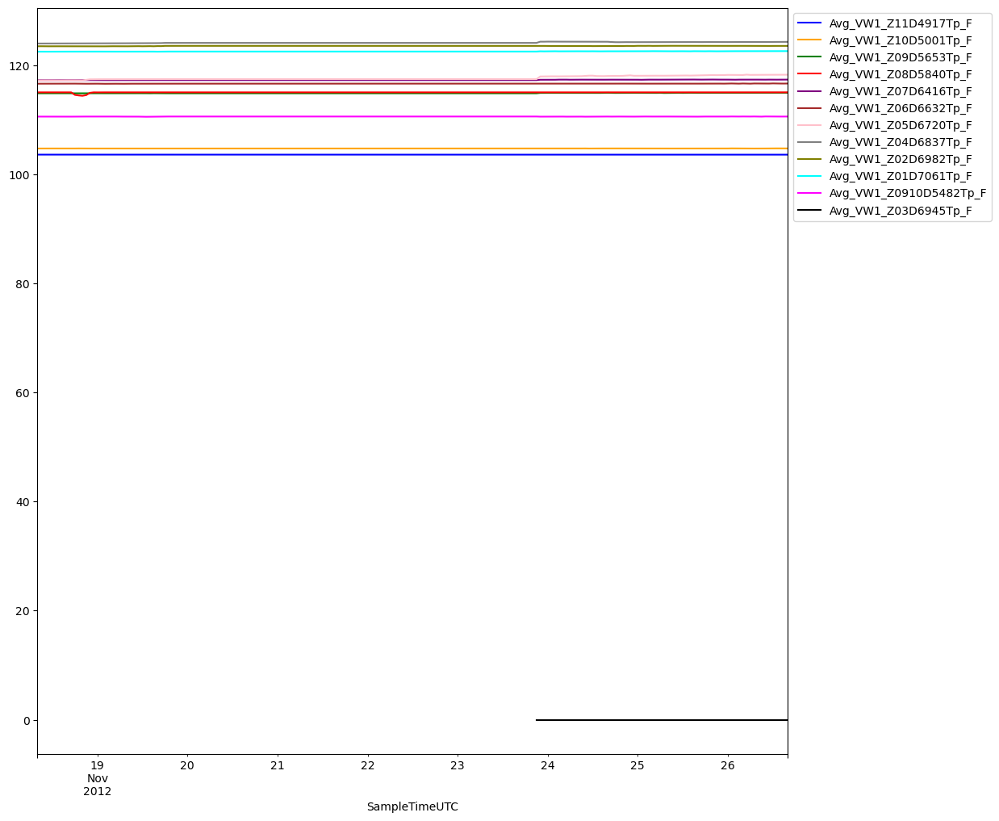

In [1713]:
zone_colors = {'Avg_VW1_Z11D4917Tp_F': 'blue',
               'Avg_VW1_Z10D5001Tp_F': 'orange',
               'Avg_VW1_Z09D5653Tp_F': 'green',
               'Avg_VW1_Z08D5840Tp_F': 'red',
               'Avg_VW1_Z07D6416Tp_F': 'purple',
               'Avg_VW1_Z06D6632Tp_F': 'brown',
               'Avg_VW1_Z05D6720Tp_F': 'pink',
               'Avg_VW1_Z04D6837Tp_F': 'gray',
               'Avg_VW1_Z02D6982Tp_F': 'olive',
               'Avg_VW1_Z01D7061Tp_F': 'cyan',
               'Avg_VW1_Z0910D5482Tp_F': 'magenta',
               'Avg_VW1_Z03D6945Tp_F': 'black'}

for zone, color in zone_colors.items():
    test[zone].plot(color=color)

plt.legend(zone_colors.keys(), bbox_to_anchor=(1.0, 1.0));

In [1714]:
train.isna().sum()

Avg_PLT_CO2VentRate_TPH      0
Avg_CCS1_WHCO2InjPs_psi      0
Avg_CCS1_WHCO2InjTp_F        0
Avg_CCS1_ANPs_psi            0
Avg_CCS1_DH6325Ps_psi        0
Avg_CCS1_DH6325Tp_F          0
Avg_VW1_WBTbgPs_psi          0
Avg_VW1_WBTbgTp_F            0
Avg_VW1_ANPs_psi            66
Avg_VW1_Z11D4917Ps_psi       0
Avg_VW1_Z11D4917Tp_F         0
Avg_VW1_Z10D5001Ps_psi       0
Avg_VW1_Z10D5001Tp_F         0
Avg_VW1_Z09D5653Ps_psi       0
Avg_VW1_Z09D5653Tp_F         0
Avg_VW1_Z08D5840Ps_psi       0
Avg_VW1_Z08D5840Tp_F         0
Avg_VW1_Z07D6416Ps_psi       0
Avg_VW1_Z07D6416Tp_F         0
Avg_VW1_Z06D6632Ps_psi       0
Avg_VW1_Z06D6632Tp_F         0
Avg_VW1_Z05D6720Ps_psi       0
Avg_VW1_Z05D6720Tp_F         0
Avg_VW1_Z04D6837Ps_psi       0
Avg_VW1_Z04D6837Tp_F         0
Avg_VW1_Z03D6945Ps_psi       0
Avg_VW1_Z03D6945Tp_F         0
Avg_VW1_Z02D6982Ps_psi       0
Avg_VW1_Z02D6982Tp_F         0
Avg_VW1_Z01D7061Ps_psi       0
Avg_VW1_Z01D7061Tp_F         0
Avg_VW1_Z0910D5482Ps_psi     0
Avg_VW1_

In [1715]:
train.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Avg_PLT_CO2VentRate_TPH,767.0,0.077357,0.160668,0.000000,0.000000,0.066667,0.108333,2.425000
Avg_CCS1_WHCO2InjPs_psi,767.0,1200.519418,223.698254,0.000000,922.825562,1358.043984,1366.594504,1385.143337
Avg_CCS1_WHCO2InjTp_F,767.0,73.939329,34.040681,0.000000,35.442787,96.304582,96.771218,99.027993
Avg_CCS1_ANPs_psi,767.0,531.872395,61.066530,0.000000,498.541495,528.648709,567.095314,687.251211
Avg_CCS1_DH6325Ps_psi,767.0,3200.469434,159.132811,2879.517171,2988.914446,3310.802299,3328.298707,3357.619303
Avg_CCS1_DH6325Tp_F,767.0,127.578196,4.188039,112.936863,122.220846,130.377882,130.768867,131.962924
Avg_VW1_WBTbgPs_psi,767.0,2409.340169,41.856604,2327.665389,2427.435196,2429.743738,2432.186924,2435.321936
Avg_VW1_WBTbgTp_F,767.0,104.540281,0.120638,104.337385,104.421863,104.525604,104.628619,104.785928
Avg_VW1_ANPs_psi,701.0,0.426006,0.276994,0.000000,0.207702,0.364257,0.600463,1.428177
Avg_VW1_Z11D4917Ps_psi,767.0,2080.915922,0.977904,2077.124158,2080.715845,2080.833319,2081.686666,2082.124139


### Outliers

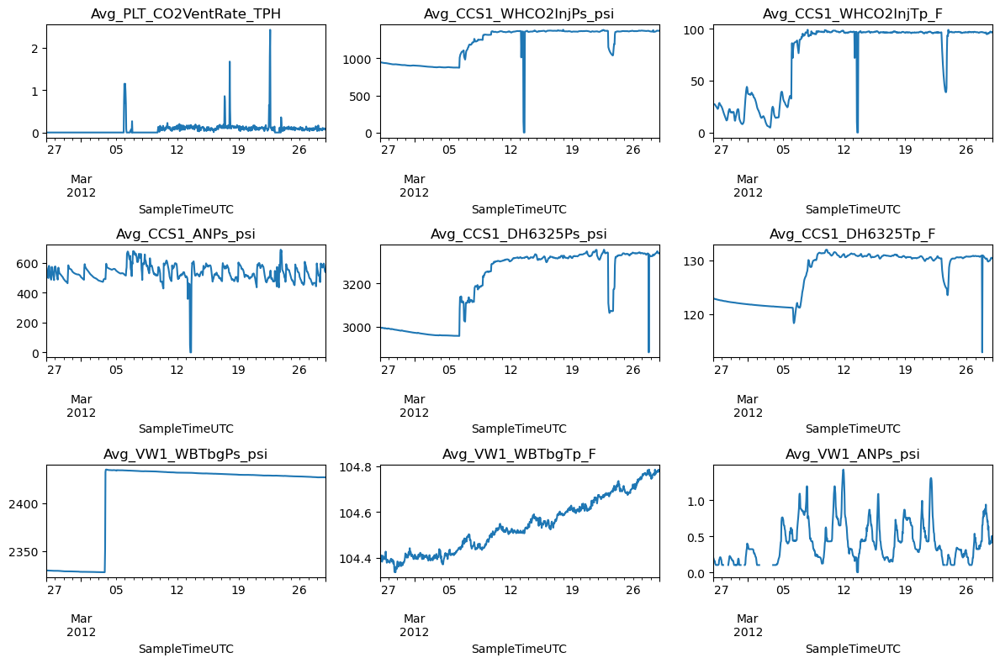

In [1716]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(12,8))

for i, col in enumerate(train[['Avg_PLT_CO2VentRate_TPH', 'Avg_CCS1_WHCO2InjPs_psi', 'Avg_CCS1_WHCO2InjTp_F', 'Avg_CCS1_ANPs_psi', 'Avg_CCS1_DH6325Ps_psi', 'Avg_CCS1_DH6325Tp_F', 'Avg_VW1_WBTbgPs_psi', 'Avg_VW1_WBTbgTp_F', 'Avg_VW1_ANPs_psi']].columns):
    ax = axes.flatten()[i]
    train[col].plot(ax=ax)
    ax.set_title(col)
    
plt.tight_layout()
plt.show();

#### Replacing 0 pressure and temprature observations in all zones in train dataset and zone 3 in the test dataset.

In [1717]:
train['Avg_VW1_Z11D4917Ps_psi'] = train['Avg_VW1_Z11D4917Ps_psi'].replace(0, np.nan)
train['Avg_VW1_Z11D4917Tp_F'] = train['Avg_VW1_Z11D4917Tp_F'].replace(0, np.nan)
train['Avg_VW1_Z10D5001Ps_psi'] = train['Avg_VW1_Z10D5001Ps_psi'].replace(0, np.nan)
train['Avg_VW1_Z10D5001Tp_F'] = train['Avg_VW1_Z10D5001Tp_F'].replace(0, np.nan)
train['Avg_VW1_Z09D5653Ps_psi'] = train['Avg_VW1_Z09D5653Ps_psi'].replace(0, np.nan)
train['Avg_VW1_Z09D5653Tp_F'] = train['Avg_VW1_Z09D5653Tp_F'].replace(0, np.nan)
train['Avg_VW1_Z08D5840Ps_psi'] = train['Avg_VW1_Z08D5840Ps_psi'].replace(0, np.nan)
train['Avg_VW1_Z08D5840Tp_F'] = train['Avg_VW1_Z08D5840Tp_F'].replace(0, np.nan)
train['Avg_VW1_Z07D6416Ps_psi'] = train['Avg_VW1_Z07D6416Ps_psi'].replace(0, np.nan)
train['Avg_VW1_Z07D6416Tp_F'] = train['Avg_VW1_Z07D6416Tp_F'].replace(0, np.nan)
train['Avg_VW1_Z06D6632Ps_psi'] = train['Avg_VW1_Z06D6632Ps_psi'].replace(0, np.nan)
train['Avg_VW1_Z06D6632Tp_F'] = train['Avg_VW1_Z06D6632Tp_F'].replace(0, np.nan)
train['Avg_VW1_Z05D6720Ps_psi'] = train['Avg_VW1_Z05D6720Ps_psi'].replace(0, np.nan)
train['Avg_VW1_Z05D6720Tp_F'] = train['Avg_VW1_Z05D6720Tp_F'].replace(0, np.nan)
train['Avg_VW1_Z04D6837Ps_psi'] = train['Avg_VW1_Z04D6837Ps_psi'].replace(0, np.nan)
train['Avg_VW1_Z04D6837Tp_F'] = train['Avg_VW1_Z04D6837Tp_F'].replace(0, np.nan)
train['Avg_VW1_Z02D6982Ps_psi'] = train['Avg_VW1_Z02D6982Ps_psi'].replace(0, np.nan)
train['Avg_VW1_Z02D6982Tp_F'] = train['Avg_VW1_Z02D6982Tp_F'].replace(0, np.nan)
train['Avg_VW1_Z01D7061Ps_psi'] = train['Avg_VW1_Z01D7061Ps_psi'].replace(0, np.nan)
train['Avg_VW1_Z01D7061Tp_F'] = train['Avg_VW1_Z01D7061Tp_F'].replace(0, np.nan)
train['Avg_VW1_Z0910D5482Ps_psi'] = train['Avg_VW1_Z0910D5482Ps_psi'].replace(0, np.nan)
train['Avg_VW1_Z0910D5482Tp_F'] = train['Avg_VW1_Z0910D5482Tp_F'].replace(0, np.nan)
train['Avg_VW1_Z03D6945Ps_psi'] = train['Avg_VW1_Z03D6945Ps_psi'].replace(0, np.nan)
train['Avg_VW1_Z03D6945Tp_F'] = train['Avg_VW1_Z03D6945Tp_F'].replace(0, np.nan)

In [1718]:
test['Avg_VW1_Z03D6945Ps_psi'] = test['Avg_VW1_Z03D6945Ps_psi'].replace(0, np.nan)
test['Avg_VW1_Z03D6945Tp_F'] = test['Avg_VW1_Z03D6945Tp_F'].replace(0, np.nan)

## KNN Imputer

In [1719]:
test['inj_diff'] = np.nan

In [1720]:
# Fit KNN imputer on training set
imputer = KNNImputer(n_neighbors=5)
imputer.fit(train);

In [1721]:
train_imputed = imputer.transform(train)
train = pd.DataFrame(train_imputed, columns=train.columns)

In [1722]:
test_imputed = imputer.transform(test)
test = pd.DataFrame(test_imputed, columns=test.columns)
test.drop(columns=['inj_diff'], inplace=True)

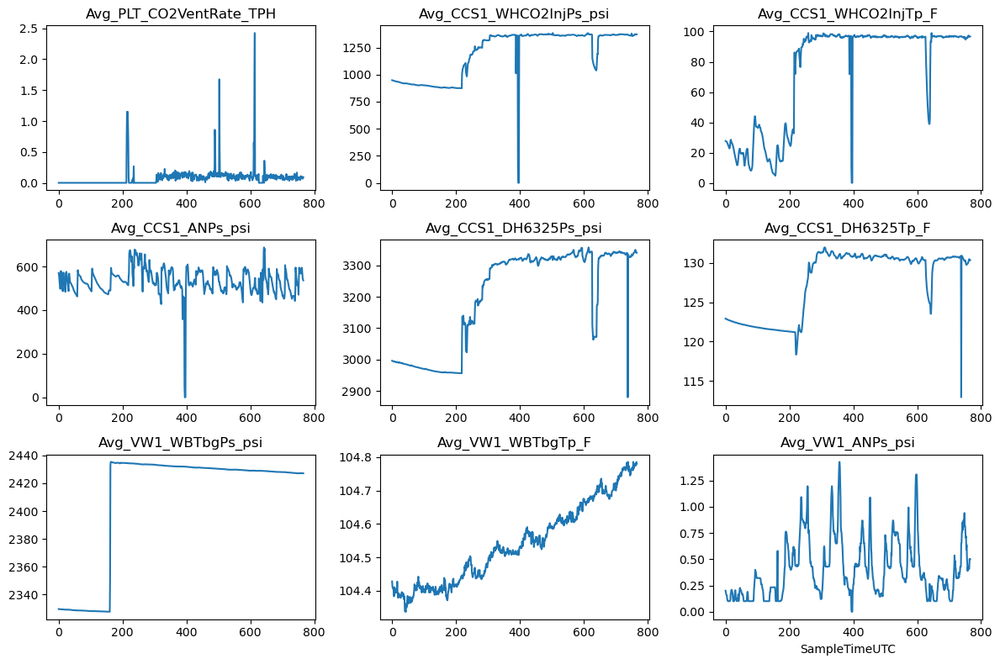

In [1723]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(12,8))

for i, col in enumerate(train[['Avg_PLT_CO2VentRate_TPH', 'Avg_CCS1_WHCO2InjPs_psi', 'Avg_CCS1_WHCO2InjTp_F', 'Avg_CCS1_ANPs_psi', 'Avg_CCS1_DH6325Ps_psi', 'Avg_CCS1_DH6325Tp_F', 'Avg_VW1_WBTbgPs_psi', 'Avg_VW1_WBTbgTp_F', 'Avg_VW1_ANPs_psi']].columns):
    ax = axes.flatten()[i]
    train[col].plot(ax=ax)
    ax.set_title(col)
    plt.xlabel('SampleTimeUTC')

plt.tight_layout()
plt.show();

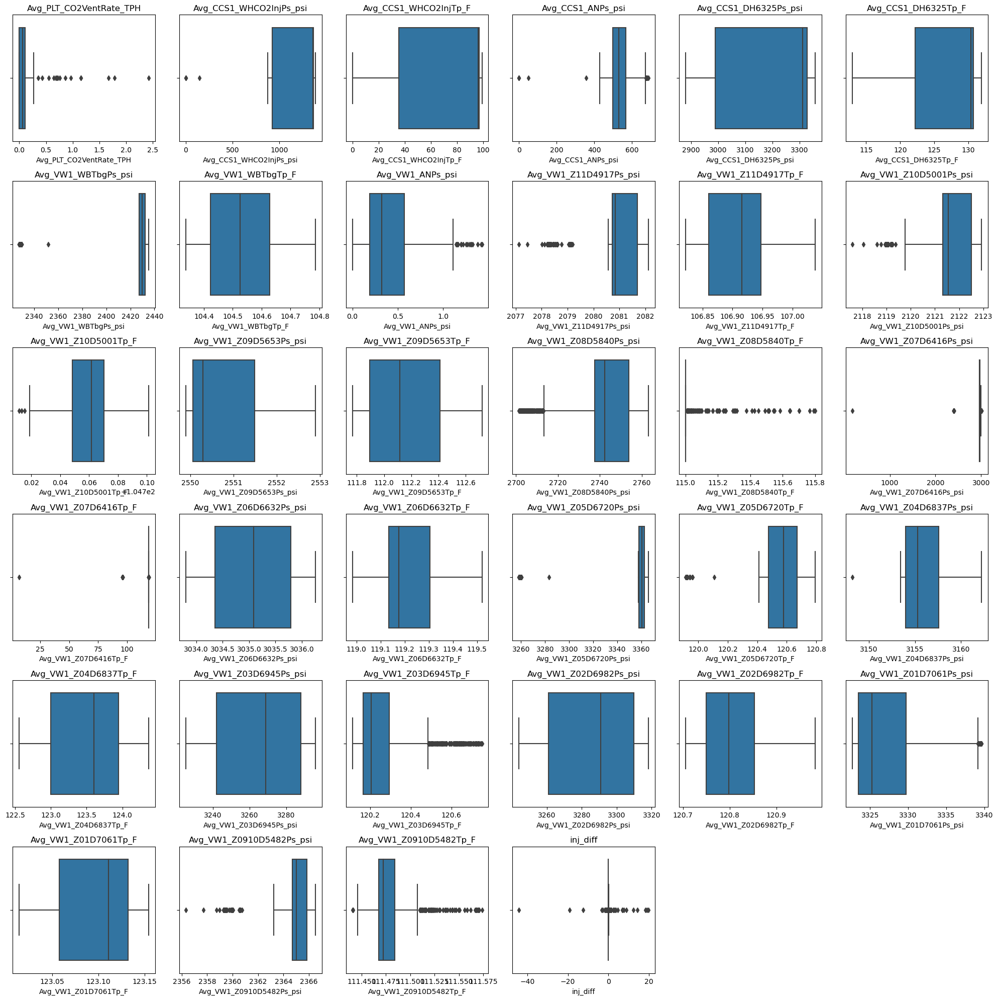

In [1724]:
fig, axs = plt.subplots(nrows=6, ncols=6, figsize=(20, 20))
axs = axs.flatten()

for i, col in enumerate(train.columns):
    sns.boxplot(x=train[col], ax=axs[i])
    axs[i].set_title(col)

for j in range(i+1, len(axs)):
    axs[j].remove()
    
plt.tight_layout()
plt.show();

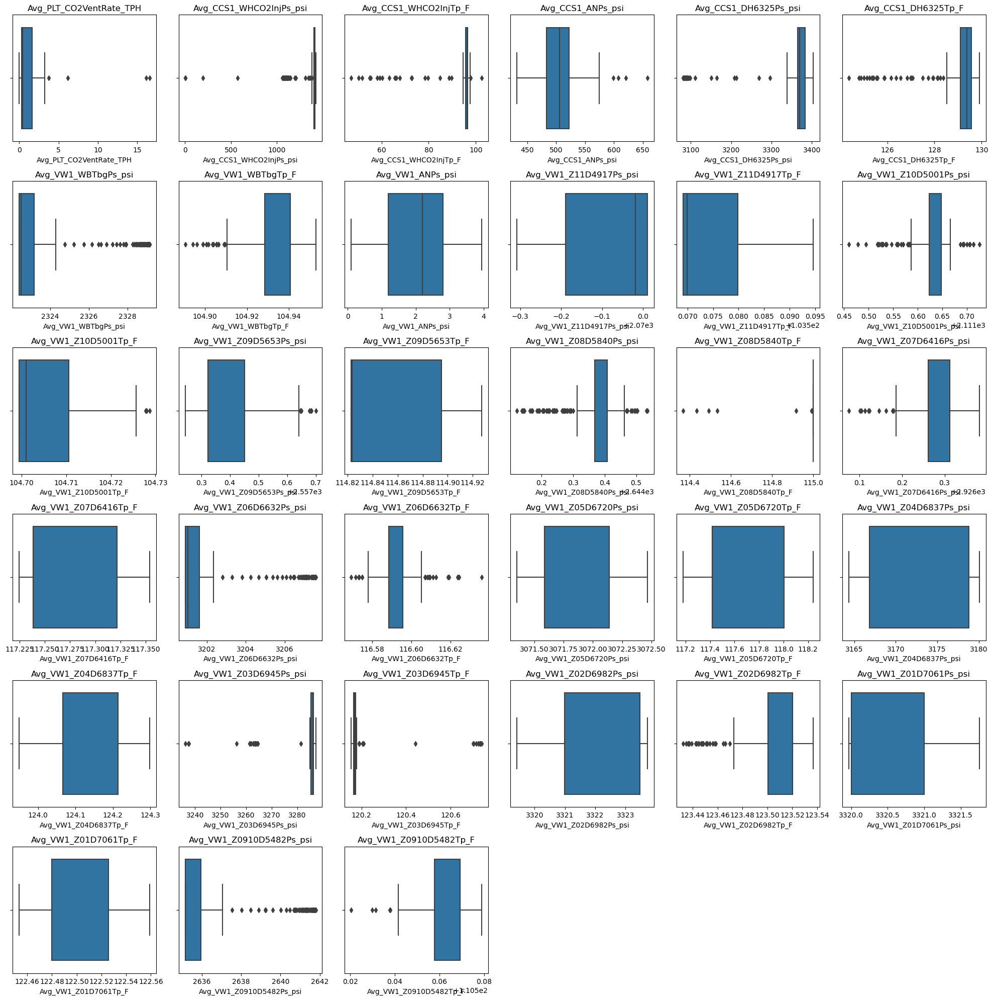

In [1725]:
fig, axs = plt.subplots(nrows=6, ncols=6, figsize=(20, 20))
axs = axs.flatten()

for i, col in enumerate(test.columns):
    sns.boxplot(x=test[col], ax=axs[i])
    axs[i].set_title(col)

for j in range(i+1, len(axs)):
    axs[j].remove()
    
plt.tight_layout()
plt.show();

## IQR 

In [1726]:
Q1 = train.quantile(0.35)
Q3 = train.quantile(0.65)
IQR = Q3 -Q1

upper_bounds = Q3 + 1.5 * IQR
train = train[(train <= upper_bounds)]
lower_bounds = Q1 - 1.5 * IQR
train = train[(train >= lower_bounds)]

## KNN Imputer

In [1727]:
# Fit KNN imputer on training set
imputer = KNNImputer(n_neighbors=5)
imputer.fit(train);

In [1728]:
train_imputed = imputer.transform(train)
train = pd.DataFrame(train_imputed, columns=train.columns)

# DATA VISUALIZATION

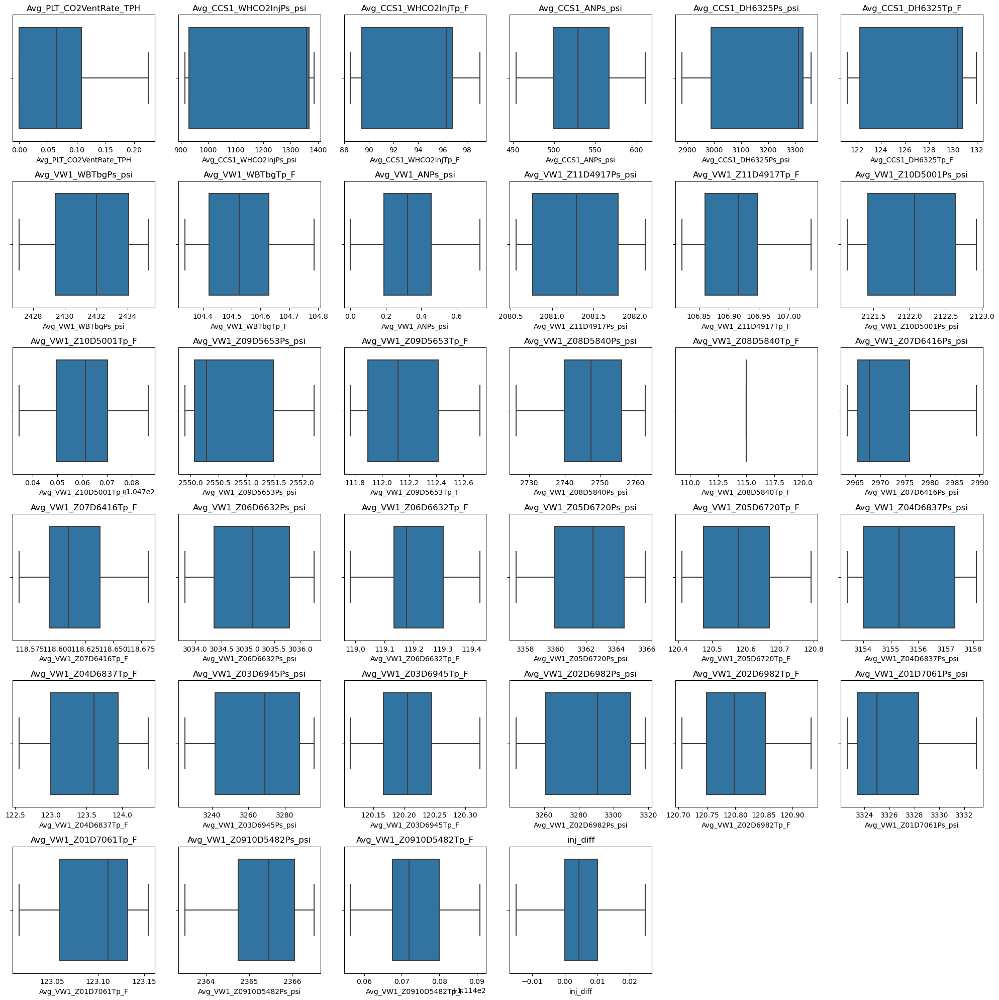

In [1729]:
fig, axs = plt.subplots(nrows=6, ncols=6, figsize=(20, 20))
axs = axs.flatten()

for i, col in enumerate(train.columns):
    sns.boxplot(x=train[col], ax=axs[i])
    axs[i].set_title(col)
    
for j in range(i+1, len(axs)):
    axs[j].remove()
    
plt.tight_layout()
plt.show();

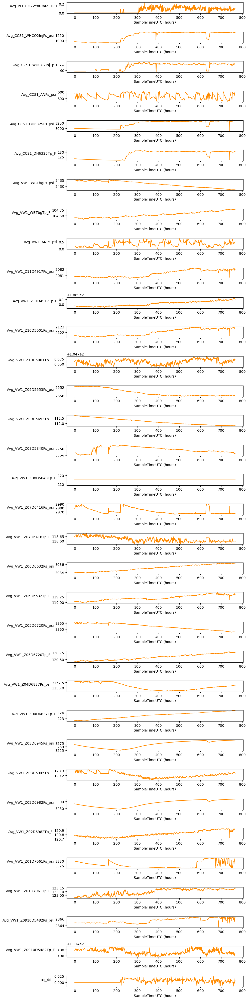

In [1730]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(nrows=len(train.columns), figsize=(10, 40))

for i, col in enumerate(train.columns):
    axs[i].plot(train.index, train[col], color='darkorange')
    axs[i].set_ylabel(col, rotation=0, ha='right')
    axs[i].set_xlabel('SampleTimeUTC (hours)')
    
plt.tight_layout()
plt.show();

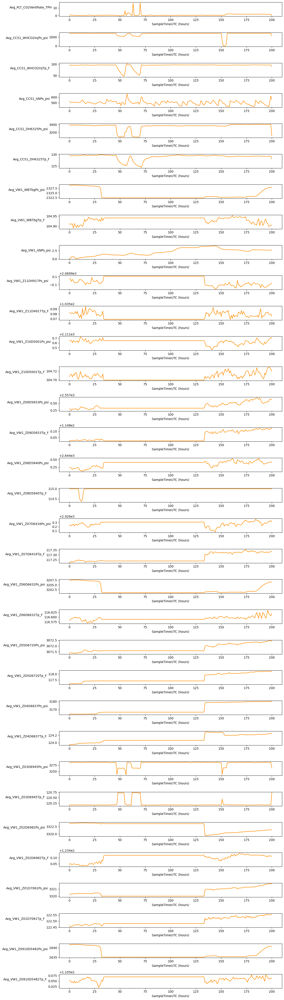

In [1731]:
import matplotlib.pyplot as plt

fig, axs = plt.subplots(nrows=len(test.columns), figsize=(13, 45))

for i, col in enumerate(test.columns):
    axs[i].plot(test.index, test[col], color='darkorange')
    axs[i].set_ylabel(col, rotation=0, ha='right')
    axs[i].set_xlabel('SampleTimeUTC (hours)')
    
plt.tight_layout()
plt.show();

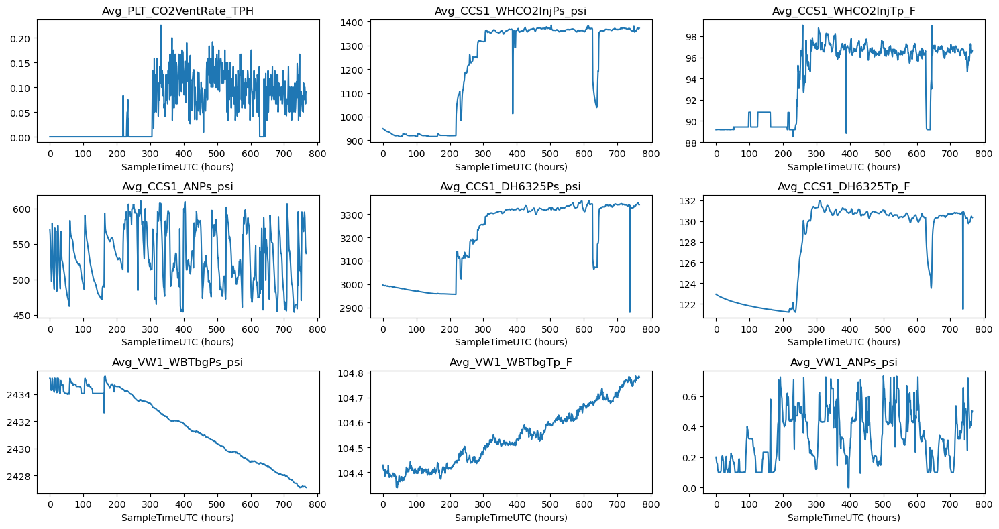

In [1732]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15,8))

for i, col in enumerate(train[['Avg_PLT_CO2VentRate_TPH', 'Avg_CCS1_WHCO2InjPs_psi', 'Avg_CCS1_WHCO2InjTp_F', 'Avg_CCS1_ANPs_psi', 'Avg_CCS1_DH6325Ps_psi', 'Avg_CCS1_DH6325Tp_F', 'Avg_VW1_WBTbgPs_psi', 'Avg_VW1_WBTbgTp_F', 'Avg_VW1_ANPs_psi']].columns):
    ax = axes.flatten()[i]
    train[col].plot(ax=ax)
    ax.set_title(col)
    ax.set_xlabel('SampleTimeUTC (hours)')
    
plt.tight_layout()
plt.show();

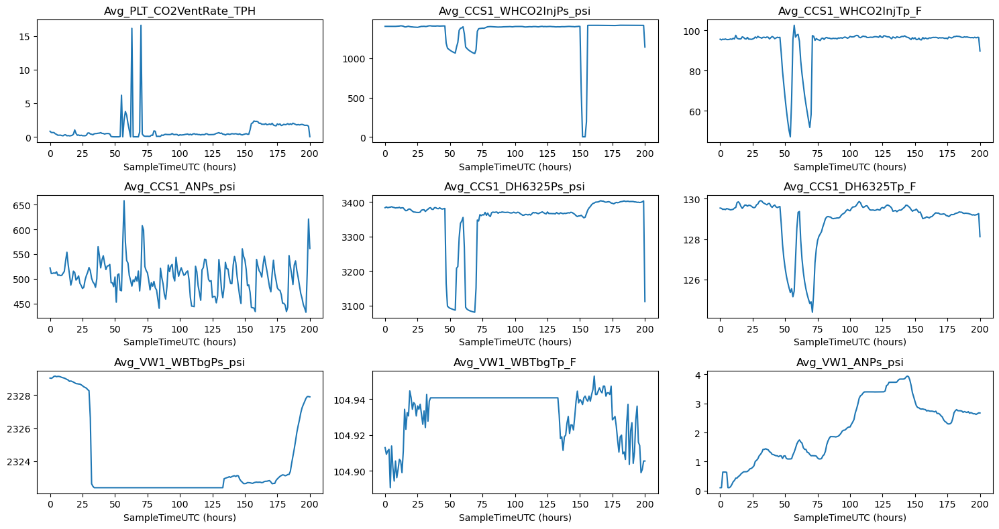

In [1733]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(15,8))

for i, col in enumerate(test[['Avg_PLT_CO2VentRate_TPH', 'Avg_CCS1_WHCO2InjPs_psi', 'Avg_CCS1_WHCO2InjTp_F', 'Avg_CCS1_ANPs_psi', 'Avg_CCS1_DH6325Ps_psi', 'Avg_CCS1_DH6325Tp_F', 'Avg_VW1_WBTbgPs_psi', 'Avg_VW1_WBTbgTp_F', 'Avg_VW1_ANPs_psi']].columns):
    ax = axes.flatten()[i]
    test[col].plot(ax=ax)
    ax.set_title(col)
    ax.set_xlabel('SampleTimeUTC (hours)')
    
plt.tight_layout()
plt.show();

In [1734]:
train.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Avg_PLT_CO2VentRate_TPH,767.0,0.058698,0.056345,0.000000,0.000000,0.065421,0.108333,0.225000
Avg_CCS1_WHCO2InjPs_psi,767.0,1213.572244,197.523513,914.850525,928.903717,1358.182825,1366.594504,1385.143337
Avg_CCS1_WHCO2InjTp_F,767.0,94.224649,3.374372,88.509315,89.427701,96.312538,96.778099,99.027993
Avg_CCS1_ANPs_psi,767.0,532.168611,39.945240,453.933614,499.768544,528.976981,566.681184,610.585070
Avg_CCS1_DH6325Ps_psi,767.0,3200.469434,159.132811,2879.517171,2988.914446,3310.802299,3328.298707,3357.619303
Avg_CCS1_DH6325Tp_F,767.0,127.611681,4.120907,121.195825,122.220846,130.377882,130.768867,131.962924
Avg_VW1_WBTbgPs_psi,767.0,2431.690815,2.493291,2427.111456,2429.405176,2432.013369,2434.052619,2435.321936
Avg_VW1_WBTbgTp_F,767.0,104.540254,0.120584,104.337385,104.421863,104.525604,104.628619,104.785680
Avg_VW1_ANPs_psi,767.0,0.335285,0.174276,0.000000,0.188842,0.321228,0.455320,0.730468
Avg_VW1_Z11D4917Ps_psi,767.0,2081.269154,0.522070,2080.564789,2080.764582,2081.294010,2081.797433,2082.124139


In [1735]:
test.describe().transpose()

,count,mean,std,min,25%,50%,75%,max
Avg_PLT_CO2VentRate_TPH,201.0,0.921872,1.764105,0.000000,0.275000,0.408333,1.633333,16.600000
Avg_CCS1_WHCO2InjPs_psi,201.0,1345.153592,213.702344,2.253255,1399.276364,1403.883153,1411.612355,1420.542983
Avg_CCS1_WHCO2InjTp_F,201.0,93.490199,9.542911,47.104775,95.707924,96.275185,96.561928,102.449867
Avg_CCS1_ANPs_psi,201.0,503.071620,34.185322,432.052225,483.594512,505.896142,522.013451,658.335748
Avg_CCS1_DH6325Ps_psi,201.0,3349.569130,83.034673,3080.499689,3364.381673,3370.058956,3383.651774,3403.902148
Avg_CCS1_DH6325Tp_F,201.0,128.971283,1.184947,124.369378,129.101550,129.378667,129.567974,129.900645
Avg_VW1_WBTbgPs_psi,201.0,2323.846507,2.422593,2322.399902,2322.399902,2322.485856,2323.178274,2329.147909
Avg_VW1_WBTbgTp_F,201.0,104.933402,0.012986,104.890602,104.928493,104.940697,104.940697,104.952787
Avg_VW1_ANPs_psi,201.0,2.113707,1.057902,0.100585,1.199219,2.190735,2.808716,3.937561
Avg_VW1_Z11D4917Ps_psi,201.0,2069.913372,0.105827,2069.692133,2069.810765,2069.981110,2070.010986,2070.010986


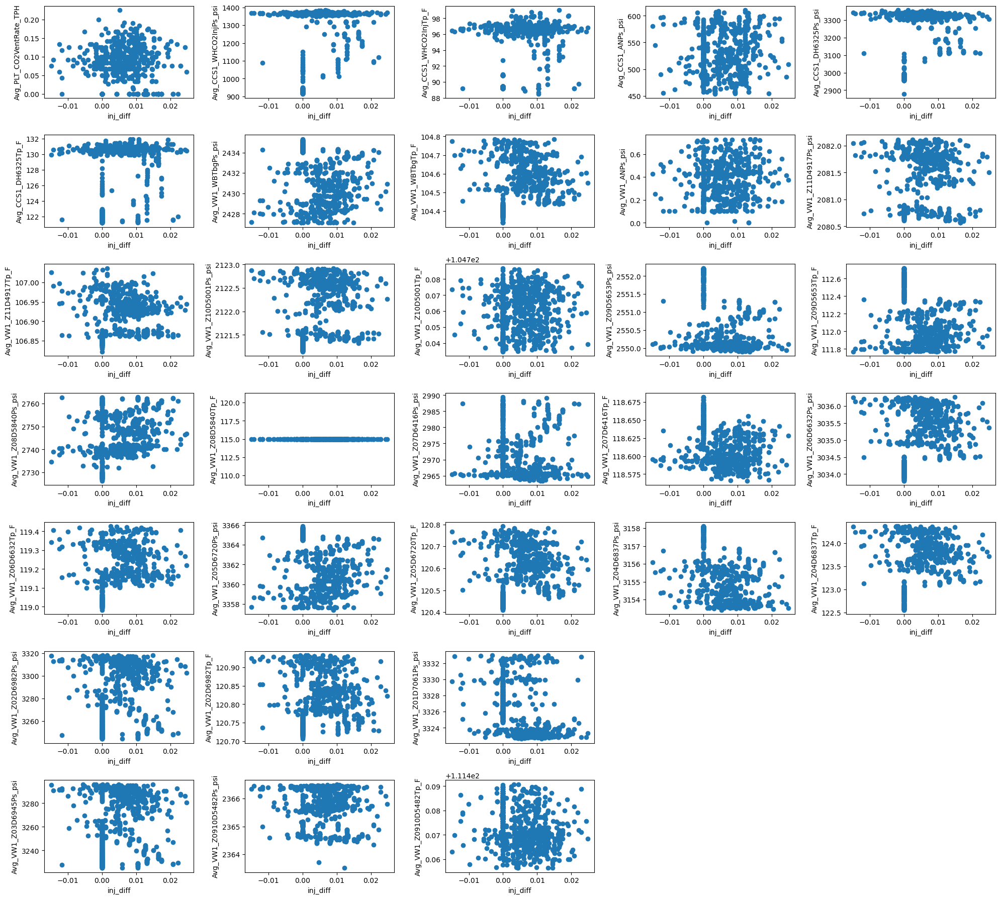

In [1736]:
import matplotlib.pyplot as plt
import pandas as pd

cols_to_plot = ['Avg_PLT_CO2VentRate_TPH', 'Avg_CCS1_WHCO2InjPs_psi', 'Avg_CCS1_WHCO2InjTp_F','Avg_CCS1_ANPs_psi', 'Avg_CCS1_DH6325Ps_psi', 'Avg_CCS1_DH6325Tp_F','Avg_VW1_WBTbgPs_psi', 'Avg_VW1_WBTbgTp_F', 'Avg_VW1_ANPs_psi','Avg_VW1_Z11D4917Ps_psi', 'Avg_VW1_Z11D4917Tp_F', 'Avg_VW1_Z10D5001Ps_psi','Avg_VW1_Z10D5001Tp_F', 'Avg_VW1_Z09D5653Ps_psi', 'Avg_VW1_Z09D5653Tp_F','Avg_VW1_Z08D5840Ps_psi', 'Avg_VW1_Z08D5840Tp_F', 'Avg_VW1_Z07D6416Ps_psi','Avg_VW1_Z07D6416Tp_F', 'Avg_VW1_Z06D6632Ps_psi', 'Avg_VW1_Z06D6632Tp_F','Avg_VW1_Z05D6720Ps_psi', 'Avg_VW1_Z05D6720Tp_F', 'Avg_VW1_Z04D6837Ps_psi','Avg_VW1_Z04D6837Tp_F', 'Avg_VW1_Z02D6982Ps_psi', 'Avg_VW1_Z02D6982Tp_F','Avg_VW1_Z01D7061Ps_psi', 'Avg_VW1_Z01D7061Tp_F', 'Avg_VW1_Z03D6945Tp_F','Avg_VW1_Z03D6945Ps_psi', 'Avg_VW1_Z0910D5482Ps_psi', 'Avg_VW1_Z0910D5482Tp_F']
fig, axes = plt.subplots(nrows=7, ncols=5, figsize=(20,18))

for i, col in enumerate(cols_to_plot):
    row_idx = i // 5
    col_idx = i % 5
    ax = axes[row_idx, col_idx]
    ax.scatter( train['inj_diff'],train[col])
    ax.set_xlabel('inj_diff')
    ax.set_ylabel(col)
    
fig.delaxes(axes[6,3])
fig.delaxes(axes[6,4])
fig.delaxes(axes[5,3])
fig.delaxes(axes[5,4])

plt.tight_layout()
plt.show();

C:\Users\Bbarb\AppData\Local\Temp\ipykernel_11976\3353801855.py:15: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zone_psi_df['inj_diff'] = train['inj_diff']


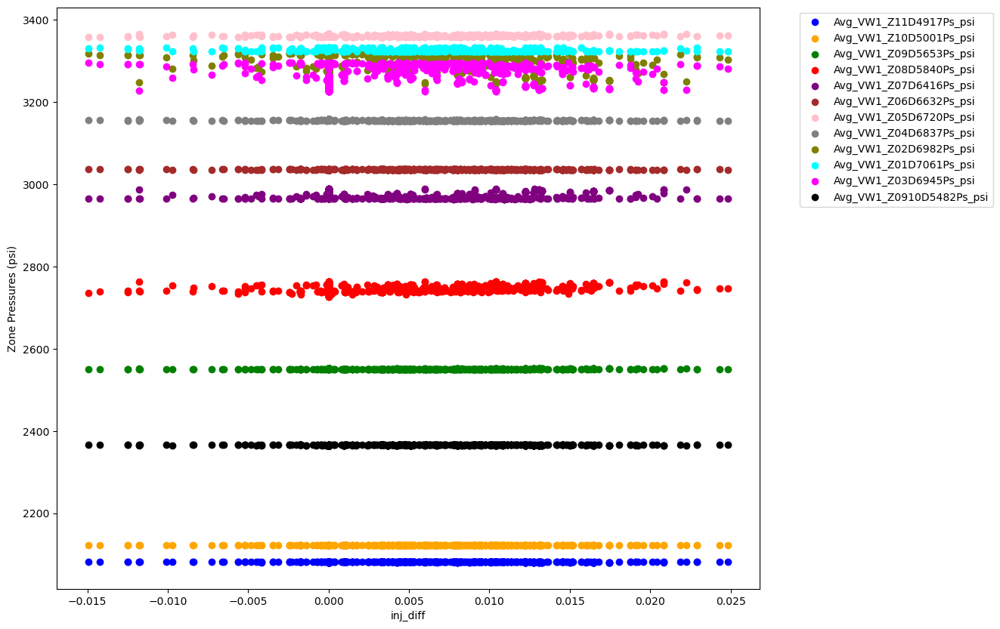

C:\Users\Bbarb\AppData\Local\Temp\ipykernel_11976\3353801855.py:21: SettingWithCopyWarning: 
A value is trying to be set on a copy of a slice from a DataFrame.
Try using .loc[row_indexer,col_indexer] = value instead

See the caveats in the documentation: https://pandas.pydata.org/pandas-docs/stable/user_guide/indexing.html#returning-a-view-versus-a-copy
  zone_temp_df['inj_diff'] = train['inj_diff']


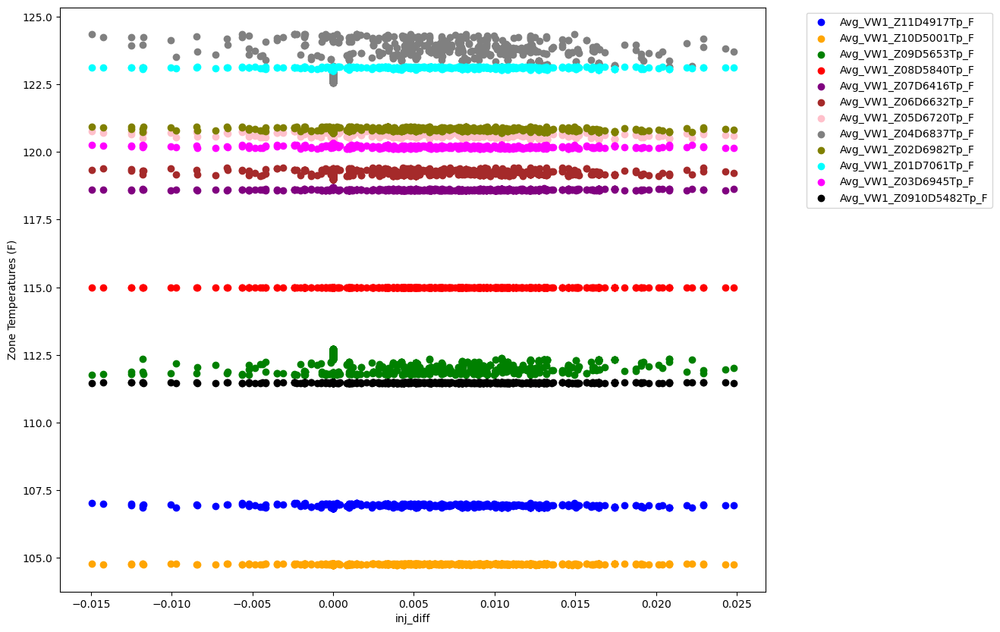

In [1737]:
colors = ['blue', 'orange', 'green', 'red', 'purple', 'brown', 'pink', 'gray', 'olive', 'cyan', 'magenta', 'black']

def plot_scatter(df, cols, x_col, y_label, colors):
    fig, ax = plt.subplots(figsize=(12,10))
    for i, col in enumerate(cols):
        ax.scatter(df[x_col], df[col], label=col, color=colors[i])
    ax.set_xlabel(x_col)
    ax.set_ylabel(y_label)
    ax.legend(bbox_to_anchor=(1.05, 1), loc='upper left')
    plt.show()

# Zone pressures
zone_psi_cols = ['Avg_VW1_Z11D4917Ps_psi', 'Avg_VW1_Z10D5001Ps_psi', 'Avg_VW1_Z09D5653Ps_psi', 'Avg_VW1_Z08D5840Ps_psi', 'Avg_VW1_Z07D6416Ps_psi', 'Avg_VW1_Z06D6632Ps_psi', 'Avg_VW1_Z05D6720Ps_psi', 'Avg_VW1_Z04D6837Ps_psi', 'Avg_VW1_Z02D6982Ps_psi', 'Avg_VW1_Z01D7061Ps_psi', 'Avg_VW1_Z03D6945Ps_psi', 'Avg_VW1_Z0910D5482Ps_psi']
zone_psi_df = train[zone_psi_cols]
zone_psi_df['inj_diff'] = train['inj_diff']
plot_scatter(zone_psi_df, zone_psi_cols, 'inj_diff', 'Zone Pressures (psi)', colors)

# Zone temperatures
zone_temp_cols = ['Avg_VW1_Z11D4917Tp_F', 'Avg_VW1_Z10D5001Tp_F', 'Avg_VW1_Z09D5653Tp_F', 'Avg_VW1_Z08D5840Tp_F', 'Avg_VW1_Z07D6416Tp_F', 'Avg_VW1_Z06D6632Tp_F', 'Avg_VW1_Z05D6720Tp_F', 'Avg_VW1_Z04D6837Tp_F', 'Avg_VW1_Z02D6982Tp_F', 'Avg_VW1_Z01D7061Tp_F', 'Avg_VW1_Z03D6945Tp_F', 'Avg_VW1_Z0910D5482Tp_F']
zone_temp_df = train[zone_temp_cols]
zone_temp_df['inj_diff'] = train['inj_diff']
plot_scatter(zone_temp_df, zone_temp_cols,'inj_diff', 'Zone Temperatures (F)', colors)

C:\Users\Bbarb\AppData\Local\Temp\ipykernel_11976\3542889450.py:18: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axs[i].scatter(train[y], train[x], cmap='viridis')


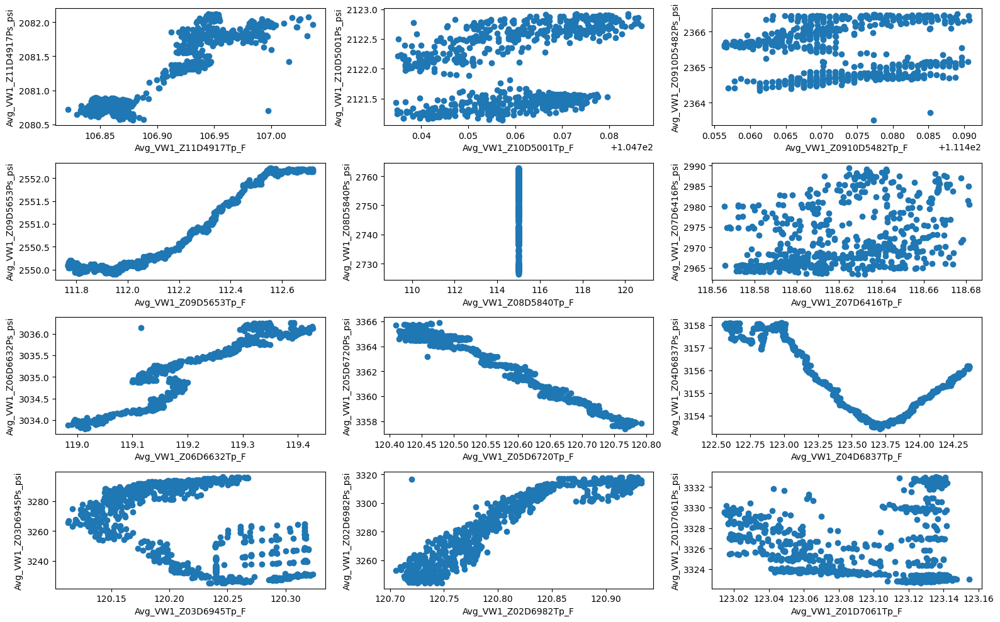

In [1738]:
pairs = [('Avg_VW1_Z11D4917Ps_psi', 'Avg_VW1_Z11D4917Tp_F'),
         ('Avg_VW1_Z10D5001Ps_psi', 'Avg_VW1_Z10D5001Tp_F'),
         ('Avg_VW1_Z0910D5482Ps_psi', 'Avg_VW1_Z0910D5482Tp_F'),
         ('Avg_VW1_Z09D5653Ps_psi', 'Avg_VW1_Z09D5653Tp_F'),
         ('Avg_VW1_Z08D5840Ps_psi', 'Avg_VW1_Z08D5840Tp_F'),
         ('Avg_VW1_Z07D6416Ps_psi', 'Avg_VW1_Z07D6416Tp_F'),
         ('Avg_VW1_Z06D6632Ps_psi', 'Avg_VW1_Z06D6632Tp_F'),
         ('Avg_VW1_Z05D6720Ps_psi', 'Avg_VW1_Z05D6720Tp_F'),
         ('Avg_VW1_Z04D6837Ps_psi', 'Avg_VW1_Z04D6837Tp_F'),
         ('Avg_VW1_Z03D6945Ps_psi', 'Avg_VW1_Z03D6945Tp_F'),
         ('Avg_VW1_Z02D6982Ps_psi', 'Avg_VW1_Z02D6982Tp_F'),
         ('Avg_VW1_Z01D7061Ps_psi', 'Avg_VW1_Z01D7061Tp_F')]

fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(16, 10))
axs = axs.flatten()

for i, (x, y) in enumerate(pairs):
    axs[i].scatter(train[y], train[x], cmap='viridis')
    axs[i].set_xlabel(y)
    axs[i].set_ylabel(x)

fig.tight_layout()
plt.show()

C:\Users\Bbarb\AppData\Local\Temp\ipykernel_11976\2666885497.py:18: UserWarning: No data for colormapping provided via 'c'. Parameters 'cmap' will be ignored
  axs[i].scatter(test[y], test[x], cmap='viridis')


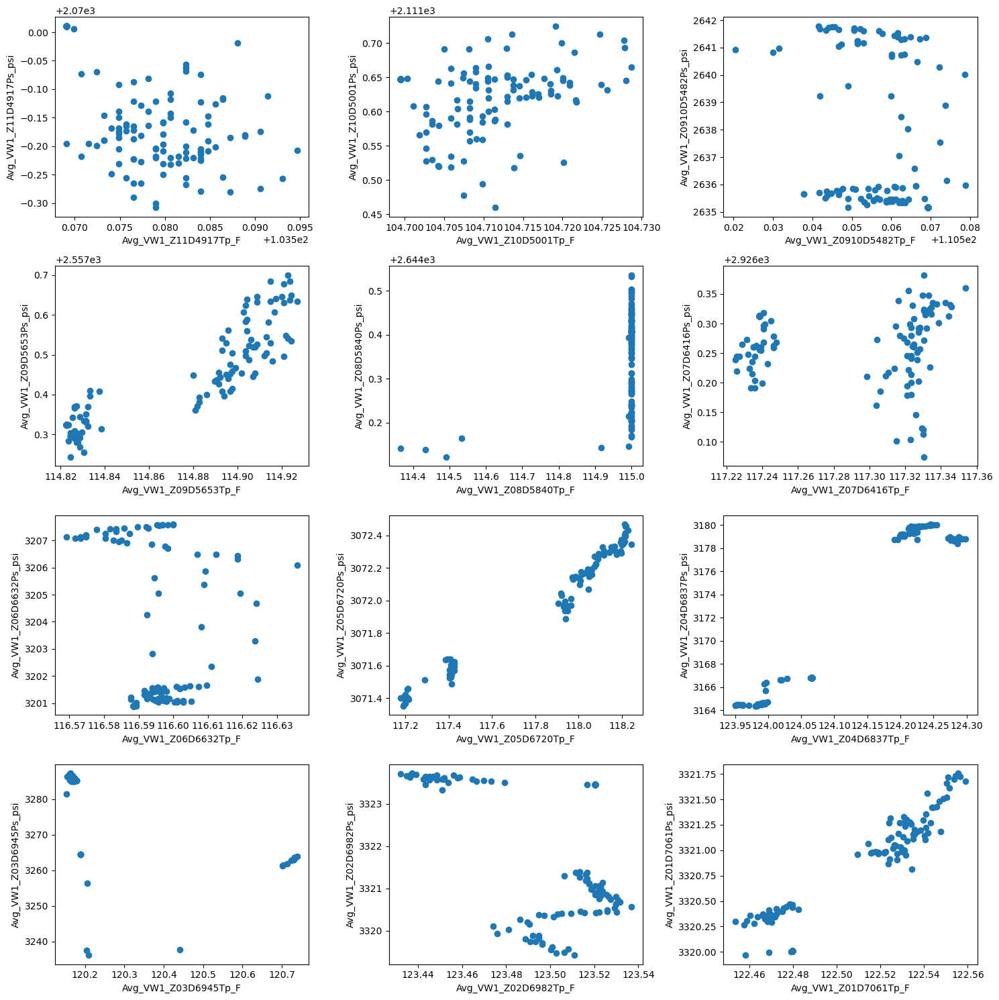

In [1739]:
pairs = [('Avg_VW1_Z11D4917Ps_psi', 'Avg_VW1_Z11D4917Tp_F'),
         ('Avg_VW1_Z10D5001Ps_psi', 'Avg_VW1_Z10D5001Tp_F'),
         ('Avg_VW1_Z0910D5482Ps_psi', 'Avg_VW1_Z0910D5482Tp_F'),
         ('Avg_VW1_Z09D5653Ps_psi', 'Avg_VW1_Z09D5653Tp_F'),
         ('Avg_VW1_Z08D5840Ps_psi', 'Avg_VW1_Z08D5840Tp_F'),
         ('Avg_VW1_Z07D6416Ps_psi', 'Avg_VW1_Z07D6416Tp_F'),
         ('Avg_VW1_Z06D6632Ps_psi', 'Avg_VW1_Z06D6632Tp_F'),
         ('Avg_VW1_Z05D6720Ps_psi', 'Avg_VW1_Z05D6720Tp_F'),
         ('Avg_VW1_Z04D6837Ps_psi', 'Avg_VW1_Z04D6837Tp_F'),
         ('Avg_VW1_Z03D6945Ps_psi', 'Avg_VW1_Z03D6945Tp_F'),
         ('Avg_VW1_Z02D6982Ps_psi', 'Avg_VW1_Z02D6982Tp_F'),
         ('Avg_VW1_Z01D7061Ps_psi', 'Avg_VW1_Z01D7061Tp_F')]

fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(15, 15))
axs = axs.flatten()

for i, (x, y) in enumerate(pairs):
    axs[i].scatter(test[y], test[x], cmap='viridis')
    axs[i].set_xlabel(y)
    axs[i].set_ylabel(x)

fig.tight_layout()
plt.show()

### Pressures and Temperatures relationship of each zone, inj_diff

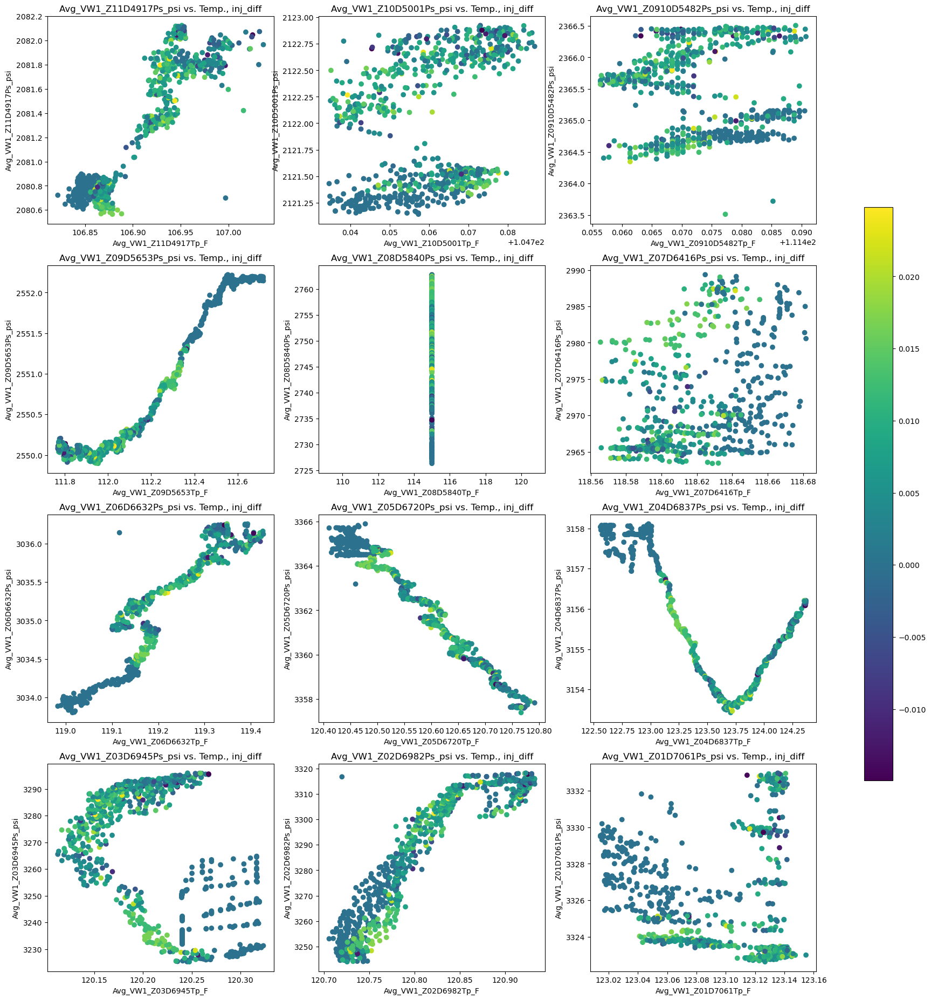

In [1740]:
pairs = [('Avg_VW1_Z11D4917Ps_psi', 'Avg_VW1_Z11D4917Tp_F', 'inj_diff'),
         ('Avg_VW1_Z10D5001Ps_psi', 'Avg_VW1_Z10D5001Tp_F', 'inj_diff'),
         ('Avg_VW1_Z0910D5482Ps_psi', 'Avg_VW1_Z0910D5482Tp_F', 'inj_diff'),
         ('Avg_VW1_Z09D5653Ps_psi', 'Avg_VW1_Z09D5653Tp_F', 'inj_diff'),
         ('Avg_VW1_Z08D5840Ps_psi', 'Avg_VW1_Z08D5840Tp_F', 'inj_diff'),
         ('Avg_VW1_Z07D6416Ps_psi', 'Avg_VW1_Z07D6416Tp_F', 'inj_diff'),
         ('Avg_VW1_Z06D6632Ps_psi', 'Avg_VW1_Z06D6632Tp_F', 'inj_diff'),
         ('Avg_VW1_Z05D6720Ps_psi', 'Avg_VW1_Z05D6720Tp_F', 'inj_diff'),
         ('Avg_VW1_Z04D6837Ps_psi', 'Avg_VW1_Z04D6837Tp_F', 'inj_diff'),
         ('Avg_VW1_Z03D6945Ps_psi', 'Avg_VW1_Z03D6945Tp_F', 'inj_diff'),
         ('Avg_VW1_Z02D6982Ps_psi', 'Avg_VW1_Z02D6982Tp_F', 'inj_diff'),
         ('Avg_VW1_Z01D7061Ps_psi', 'Avg_VW1_Z01D7061Tp_F', 'inj_diff')]

fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(23, 23))
axs = axs.flatten()

for i, (x, y, z) in enumerate(pairs):
    axs[i].scatter(train[y], train[x], c=train[z], cmap='viridis')
    axs[i].set_xlabel(y)
    axs[i].set_ylabel(x)
    axs[i].set_title(f'{x} vs. Temp., inj_diff')

fig.colorbar(axs[0].collections[0], shrink=0.6,location ='right', ax=axs)
plt.show()

C:\Users\Bbarb\AppData\Local\Temp\ipykernel_11976\533537060.py:23: UserWarning: This figure includes Axes that are not compatible with tight_layout, so results might be incorrect.
  plt.tight_layout()


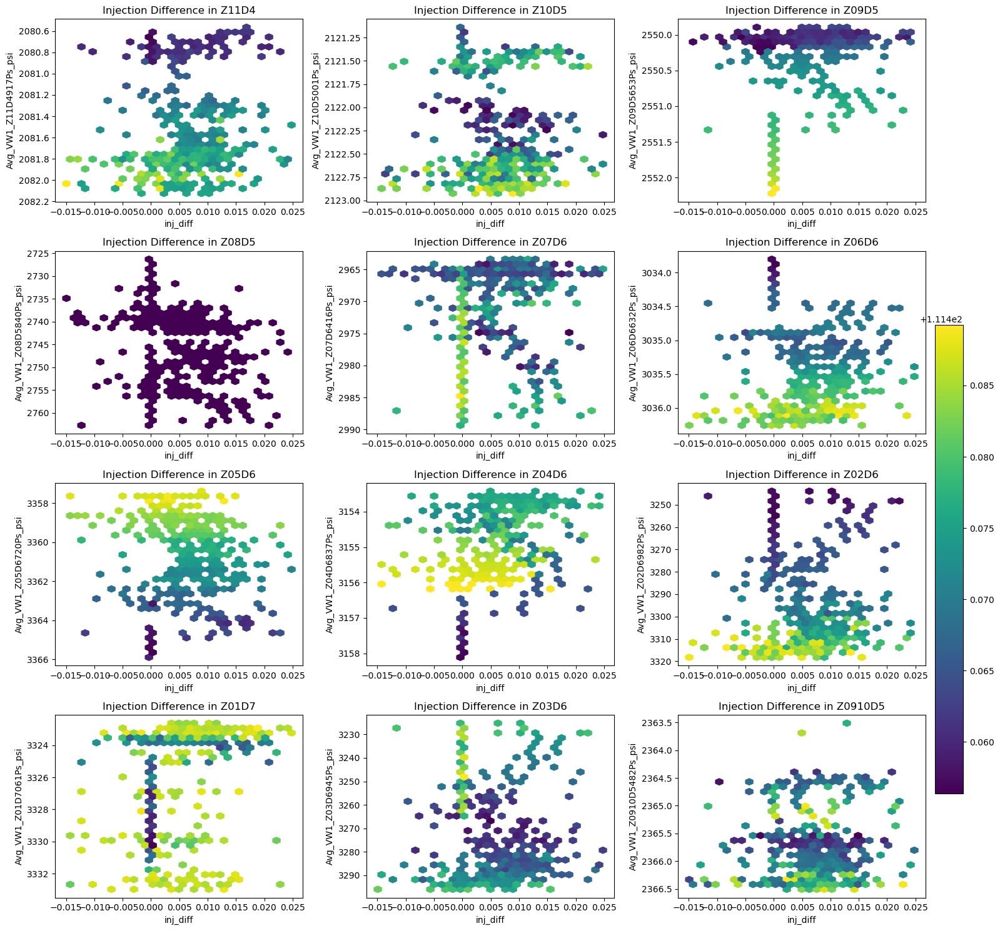

In [1741]:
cols_to_plotX = ['Avg_VW1_Z11D4917Tp_F','Avg_VW1_Z10D5001Tp_F',  'Avg_VW1_Z09D5653Tp_F', 'Avg_VW1_Z08D5840Tp_F', 'Avg_VW1_Z07D6416Tp_F','Avg_VW1_Z06D6632Tp_F', 'Avg_VW1_Z05D6720Tp_F', 'Avg_VW1_Z04D6837Tp_F',  'Avg_VW1_Z02D6982Tp_F', 'Avg_VW1_Z01D7061Tp_F', 'Avg_VW1_Z03D6945Tp_F', 'Avg_VW1_Z0910D5482Tp_F']
cols_to_ploty = ['Avg_VW1_Z11D4917Ps_psi', 'Avg_VW1_Z10D5001Ps_psi','Avg_VW1_Z09D5653Ps_psi','Avg_VW1_Z08D5840Ps_psi','Avg_VW1_Z07D6416Ps_psi', 'Avg_VW1_Z06D6632Ps_psi', 'Avg_VW1_Z05D6720Ps_psi','Avg_VW1_Z04D6837Ps_psi','Avg_VW1_Z02D6982Ps_psi','Avg_VW1_Z01D7061Ps_psi','Avg_VW1_Z03D6945Ps_psi', 'Avg_VW1_Z0910D5482Ps_psi']

gridsize = 30
fig, axs = plt.subplots(nrows=4, ncols=3, figsize=(15,15))

for i, ax in enumerate(axs.flatten()):
    x = train['inj_diff']
    y = train[cols_to_ploty[i]]
    z = train[cols_to_plotX[i]]
    
    ax.hexbin(
        x, y, C=z, gridsize=gridsize, cmap='viridis')

    ax.set_xlabel('inj_diff')
    ax.set_ylabel(cols_to_ploty[i])
    ax.set_title('Injection Difference in ' + cols_to_plotX[i][8:-7])
    ax.invert_yaxis()

cbar_ax = fig.add_axes([1, 0.15, 0.03, 0.5])
fig.colorbar(axs[-1,-1].collections[0], cax=cbar_ax)

plt.tight_layout()
plt.show();

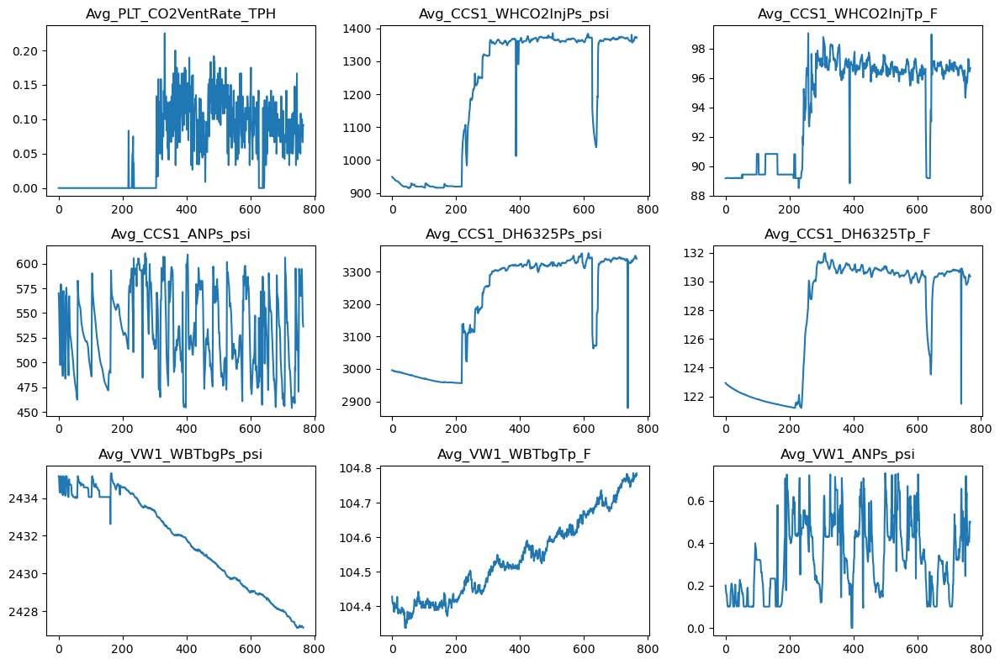

In [1742]:
fig, axes = plt.subplots(nrows=3, ncols=3, figsize=(12,8))

for i, col in enumerate(train[['Avg_PLT_CO2VentRate_TPH', 'Avg_CCS1_WHCO2InjPs_psi', 'Avg_CCS1_WHCO2InjTp_F', 'Avg_CCS1_ANPs_psi', 'Avg_CCS1_DH6325Ps_psi', 'Avg_CCS1_DH6325Tp_F', 'Avg_VW1_WBTbgPs_psi', 'Avg_VW1_WBTbgTp_F', 'Avg_VW1_ANPs_psi']].columns):
    ax = axes.flatten()[i]
    train[col].plot(ax=ax)
    ax.set_title(col)

plt.tight_layout()
plt.show();

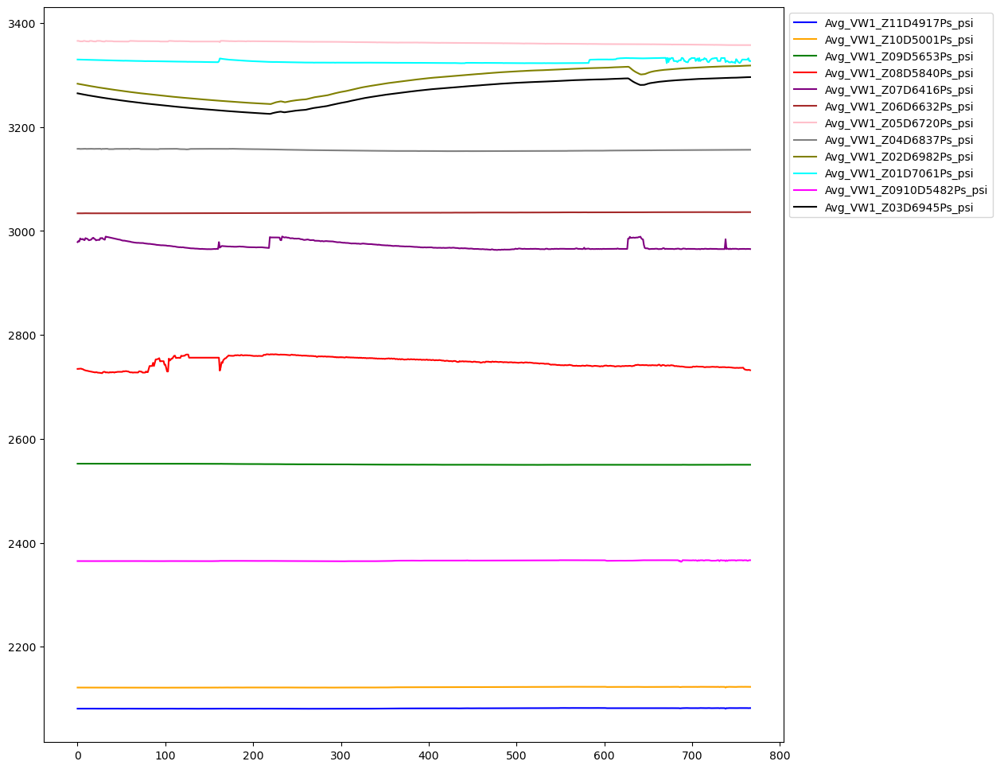

In [1743]:
zone_colors = {'Avg_VW1_Z11D4917Ps_psi': 'blue',
               'Avg_VW1_Z10D5001Ps_psi': 'orange',
               'Avg_VW1_Z09D5653Ps_psi': 'green',
               'Avg_VW1_Z08D5840Ps_psi': 'red',
               'Avg_VW1_Z07D6416Ps_psi': 'purple',
               'Avg_VW1_Z06D6632Ps_psi': 'brown',
               'Avg_VW1_Z05D6720Ps_psi': 'pink',
               'Avg_VW1_Z04D6837Ps_psi': 'gray',
               'Avg_VW1_Z02D6982Ps_psi': 'olive',
               'Avg_VW1_Z01D7061Ps_psi': 'cyan',
               'Avg_VW1_Z0910D5482Ps_psi': 'magenta',
               'Avg_VW1_Z03D6945Ps_psi': 'black'}

for zone, color in zone_colors.items():
    train[zone].plot(color=color)
    ax.set_xlabel('SampleTimeUTC')
    
plt.legend(zone_colors.keys(), bbox_to_anchor=(1.0, 1.0));

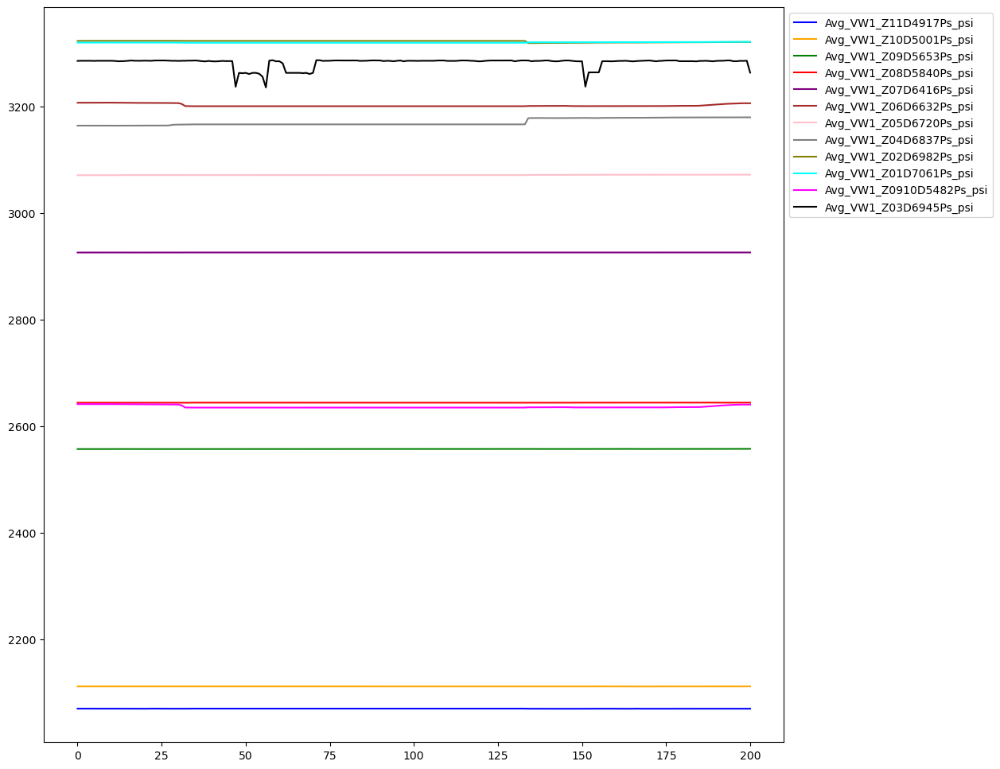

In [1744]:
zone_colors = {'Avg_VW1_Z11D4917Ps_psi': 'blue',
               'Avg_VW1_Z10D5001Ps_psi': 'orange',
               'Avg_VW1_Z09D5653Ps_psi': 'green',
               'Avg_VW1_Z08D5840Ps_psi': 'red',
               'Avg_VW1_Z07D6416Ps_psi': 'purple',
               'Avg_VW1_Z06D6632Ps_psi': 'brown',
               'Avg_VW1_Z05D6720Ps_psi': 'pink',
               'Avg_VW1_Z04D6837Ps_psi': 'gray',
               'Avg_VW1_Z02D6982Ps_psi': 'olive',
               'Avg_VW1_Z01D7061Ps_psi': 'cyan',
               'Avg_VW1_Z0910D5482Ps_psi': 'magenta',
               'Avg_VW1_Z03D6945Ps_psi': 'black'}

for zone, color in zone_colors.items():
    test[zone].plot(color=color)

plt.legend(zone_colors.keys(), bbox_to_anchor=(1.0, 1.0));

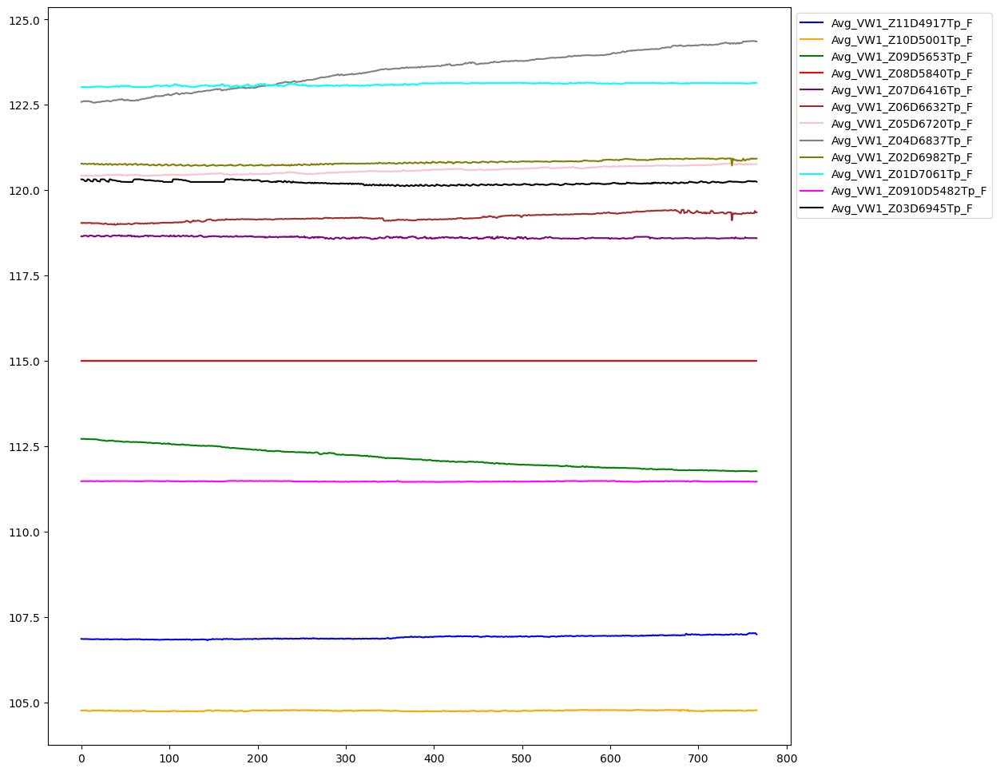

In [1745]:
zone_colors = {'Avg_VW1_Z11D4917Tp_F': 'blue',
               'Avg_VW1_Z10D5001Tp_F': 'orange',
               'Avg_VW1_Z09D5653Tp_F': 'green',
               'Avg_VW1_Z08D5840Tp_F': 'red',
               'Avg_VW1_Z07D6416Tp_F': 'purple',
               'Avg_VW1_Z06D6632Tp_F': 'brown',
               'Avg_VW1_Z05D6720Tp_F': 'pink',
               'Avg_VW1_Z04D6837Tp_F': 'gray',
               'Avg_VW1_Z02D6982Tp_F': 'olive',
               'Avg_VW1_Z01D7061Tp_F': 'cyan',
               'Avg_VW1_Z0910D5482Tp_F': 'magenta',
               'Avg_VW1_Z03D6945Tp_F': 'black'}

for zone, color in zone_colors.items():
    train[zone].plot(color=color)

plt.legend(zone_colors.keys(), bbox_to_anchor=(1.0, 1.0));

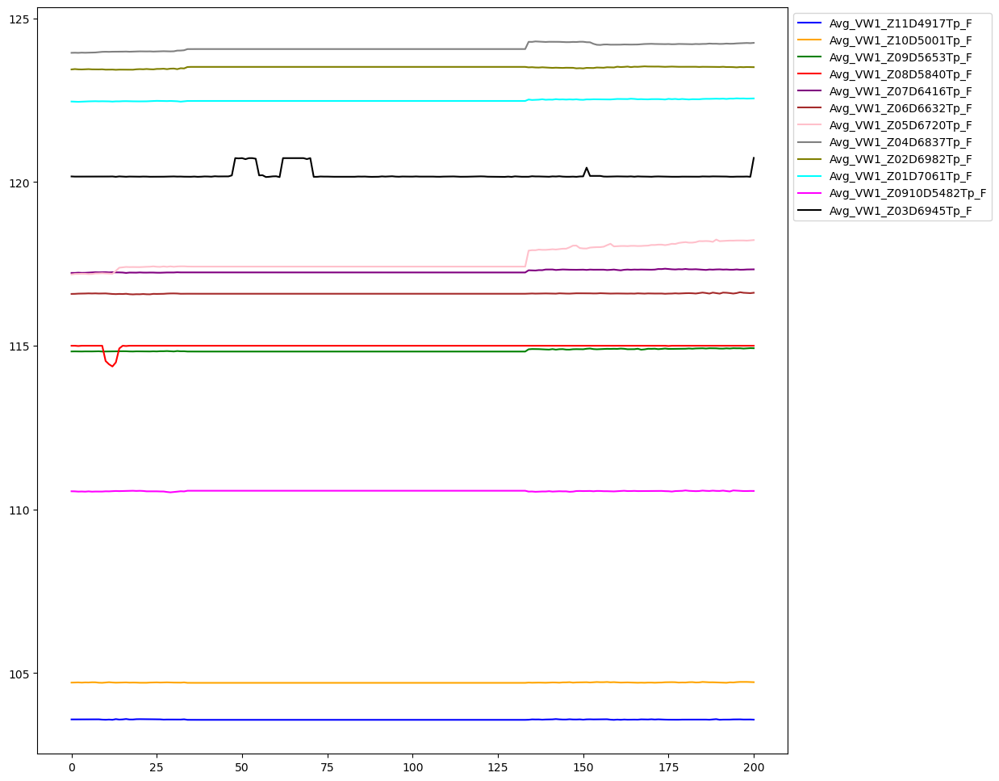

In [1746]:
zone_colors = {'Avg_VW1_Z11D4917Tp_F': 'blue',
               'Avg_VW1_Z10D5001Tp_F': 'orange',
               'Avg_VW1_Z09D5653Tp_F': 'green',
               'Avg_VW1_Z08D5840Tp_F': 'red',
               'Avg_VW1_Z07D6416Tp_F': 'purple',
               'Avg_VW1_Z06D6632Tp_F': 'brown',
               'Avg_VW1_Z05D6720Tp_F': 'pink',
               'Avg_VW1_Z04D6837Tp_F': 'gray',
               'Avg_VW1_Z02D6982Tp_F': 'olive',
               'Avg_VW1_Z01D7061Tp_F': 'cyan',
               'Avg_VW1_Z0910D5482Tp_F': 'magenta',
               'Avg_VW1_Z03D6945Tp_F': 'black'}

for zone, color in zone_colors.items():
    test[zone].plot(color=color)

plt.legend(zone_colors.keys(), bbox_to_anchor=(1.0, 1.0));

In [1747]:
kurtosis = train.kurtosis()
print(kurtosis)

Avg_PLT_CO2VentRate_TPH    -1.202096
Avg_CCS1_WHCO2InjPs_psi    -1.414149
Avg_CCS1_WHCO2InjTp_F      -1.471464
Avg_CCS1_ANPs_psi          -1.058106
Avg_CCS1_DH6325Ps_psi      -1.460316
Avg_CCS1_DH6325Tp_F        -1.487292
Avg_VW1_WBTbgPs_psi        -1.327145
Avg_VW1_WBTbgTp_F          -1.055171
Avg_VW1_ANPs_psi           -0.920517
Avg_VW1_Z11D4917Ps_psi     -1.661085
Avg_VW1_Z11D4917Tp_F       -1.192074
Avg_VW1_Z10D5001Ps_psi     -1.680343
Avg_VW1_Z10D5001Tp_F       -1.028613
Avg_VW1_Z09D5653Ps_psi     -1.173125
Avg_VW1_Z09D5653Tp_F       -1.228470
Avg_VW1_Z08D5840Ps_psi     -0.951591
Avg_VW1_Z08D5840Tp_F        0.000000
Avg_VW1_Z07D6416Ps_psi     -0.410367
Avg_VW1_Z07D6416Tp_F       -0.986194
Avg_VW1_Z06D6632Ps_psi     -1.368190
Avg_VW1_Z06D6632Tp_F       -0.962204
Avg_VW1_Z05D6720Ps_psi     -1.293415
Avg_VW1_Z05D6720Tp_F       -1.272430
Avg_VW1_Z04D6837Ps_psi     -1.344806
Avg_VW1_Z04D6837Tp_F       -1.181415
Avg_VW1_Z03D6945Ps_psi     -1.469532
Avg_VW1_Z03D6945Tp_F       -0.839517
A

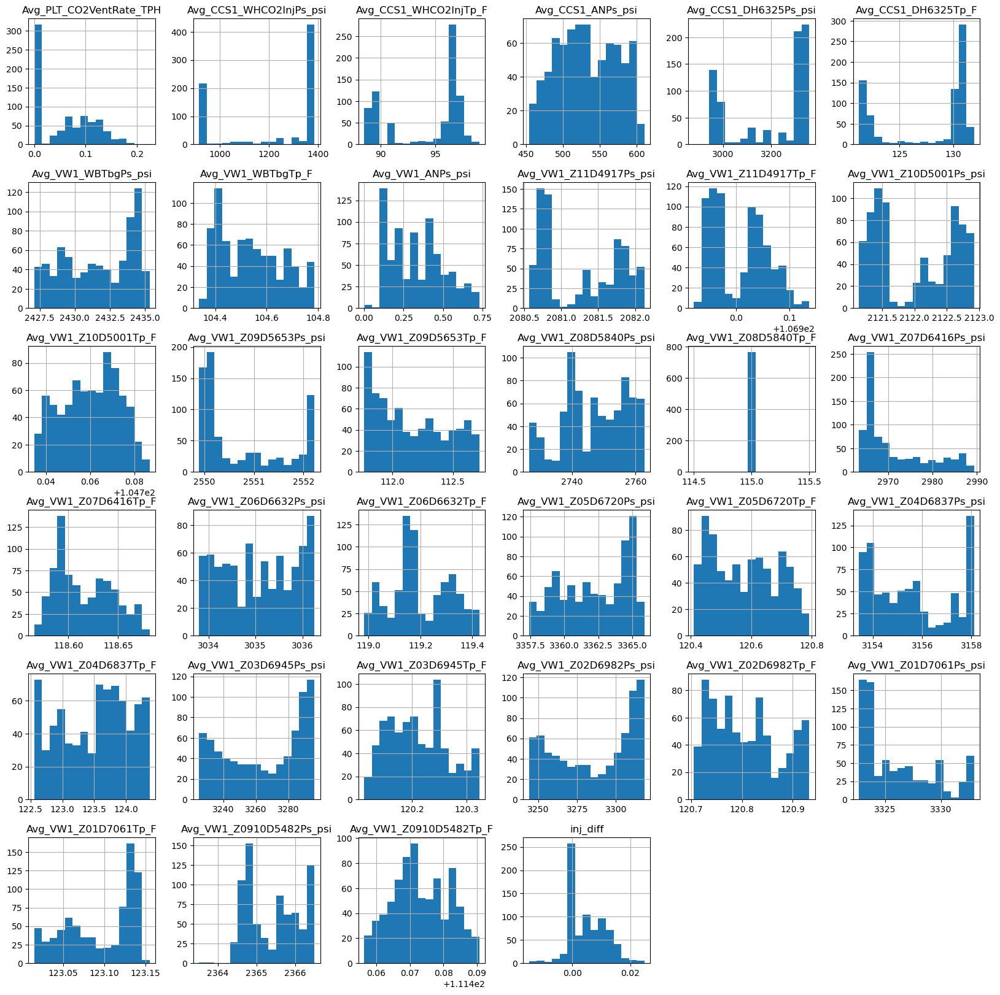

In [1748]:
train.hist(bins=15, figsize=(20, 20))
plt.show();

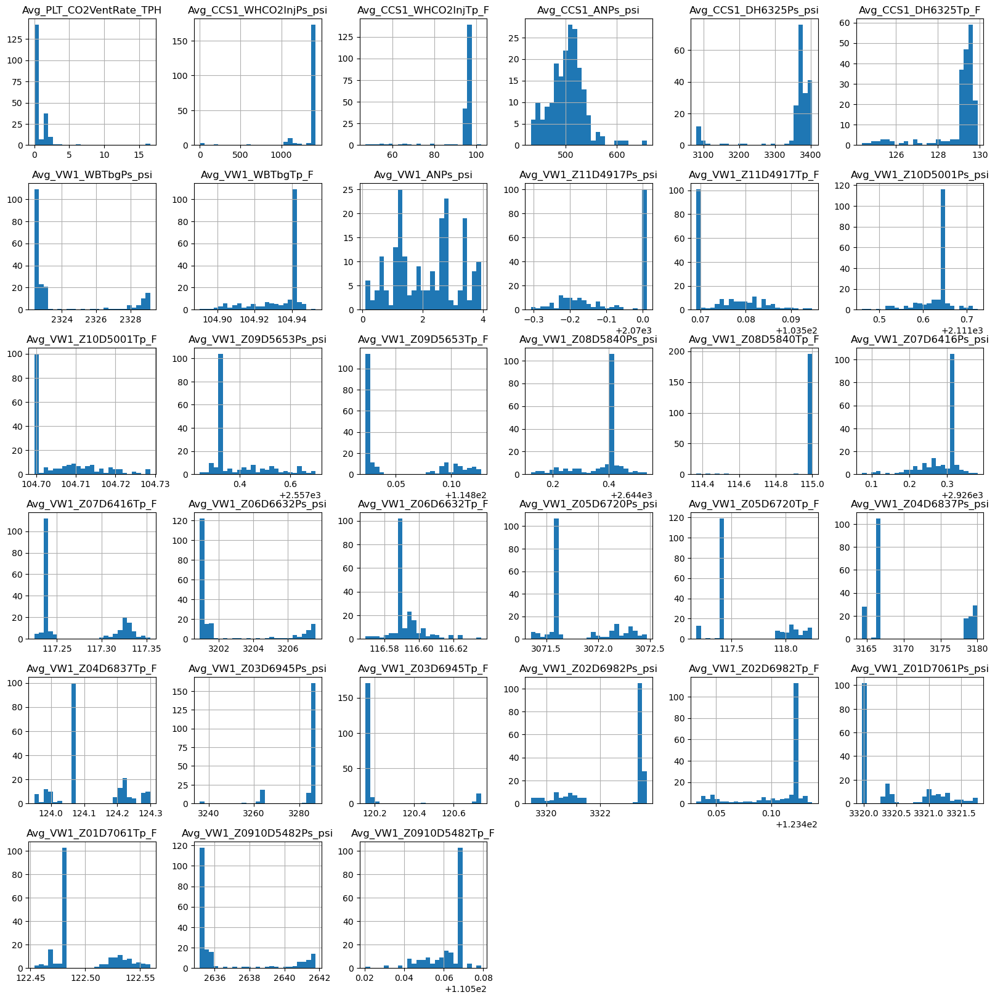

In [1749]:
test.hist(bins=25, figsize=(20, 20))
plt.show();

In [1750]:
train.skew()

Avg_PLT_CO2VentRate_TPH     0.328219
Avg_CCS1_WHCO2InjPs_psi    -0.680947
Avg_CCS1_WHCO2InjTp_F      -0.602667
Avg_CCS1_ANPs_psi           0.021165
Avg_CCS1_DH6325Ps_psi      -0.608647
Avg_CCS1_DH6325Tp_F        -0.644743
Avg_VW1_WBTbgPs_psi        -0.259622
Avg_VW1_WBTbgTp_F           0.335887
Avg_VW1_ANPs_psi            0.272212
Avg_VW1_Z11D4917Ps_psi      0.158291
Avg_VW1_Z11D4917Tp_F        0.252896
Avg_VW1_Z10D5001Ps_psi      0.081283
Avg_VW1_Z10D5001Tp_F       -0.151370
Avg_VW1_Z09D5653Ps_psi      0.696275
Avg_VW1_Z09D5653Tp_F        0.325973
Avg_VW1_Z08D5840Ps_psi     -0.245828
Avg_VW1_Z08D5840Tp_F        0.000000
Avg_VW1_Z07D6416Ps_psi      0.997334
Avg_VW1_Z07D6416Tp_F        0.396690
Avg_VW1_Z06D6632Ps_psi     -0.028070
Avg_VW1_Z06D6632Tp_F        0.117940
Avg_VW1_Z05D6720Ps_psi     -0.261818
Avg_VW1_Z05D6720Tp_F        0.170615
Avg_VW1_Z04D6837Ps_psi      0.347356
Avg_VW1_Z04D6837Tp_F       -0.202200
Avg_VW1_Z03D6945Ps_psi     -0.255435
Avg_VW1_Z03D6945Tp_F        0.288924
A

### From obderving residuals, the zone pressures and tempratures show bimodial distribution as two zones of data are present.

C:\Users\Bbarb\AppData\Local\Temp\ipykernel_11976\1909528509.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


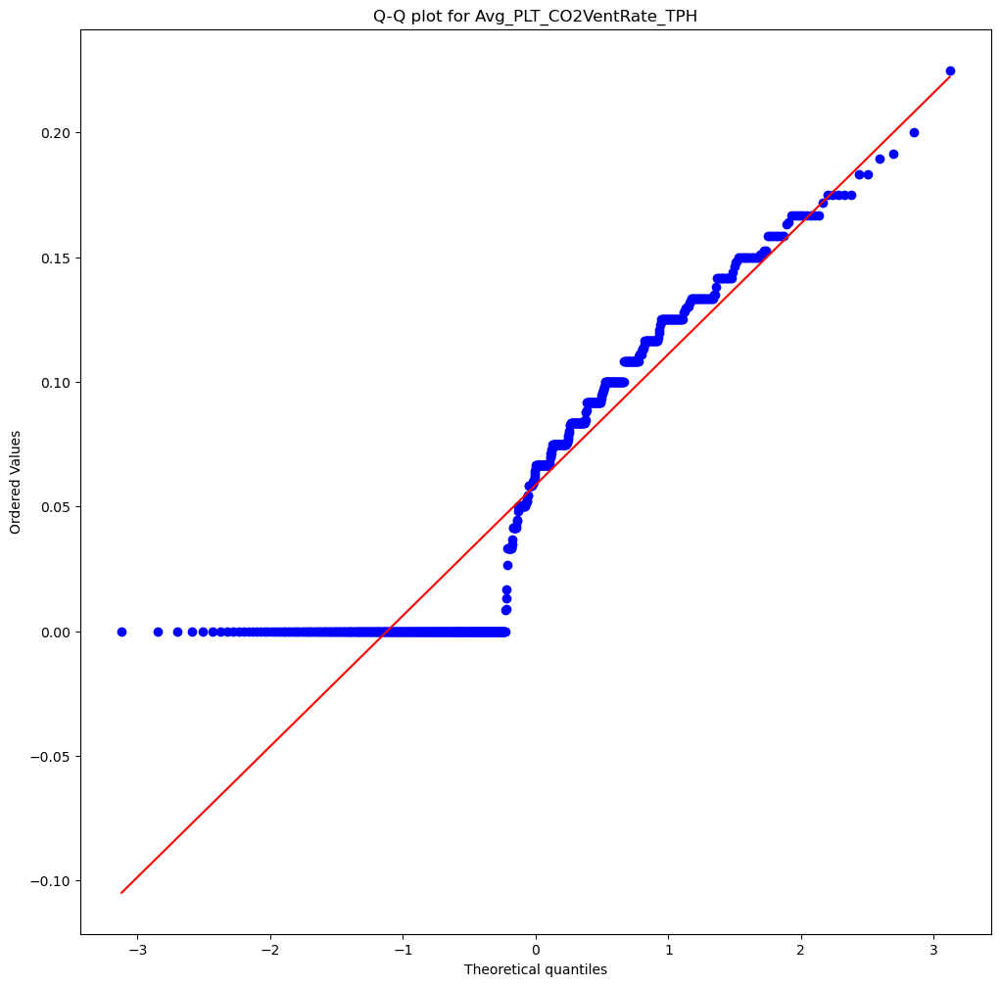

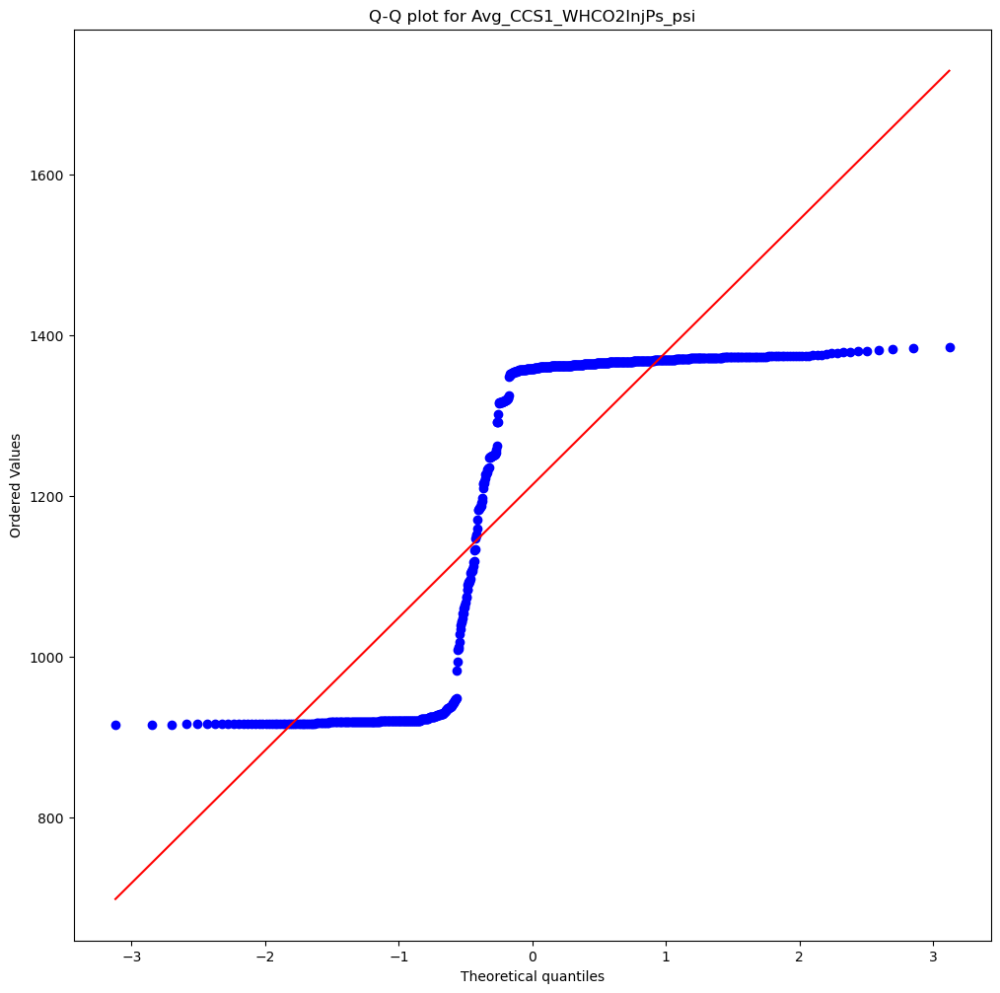

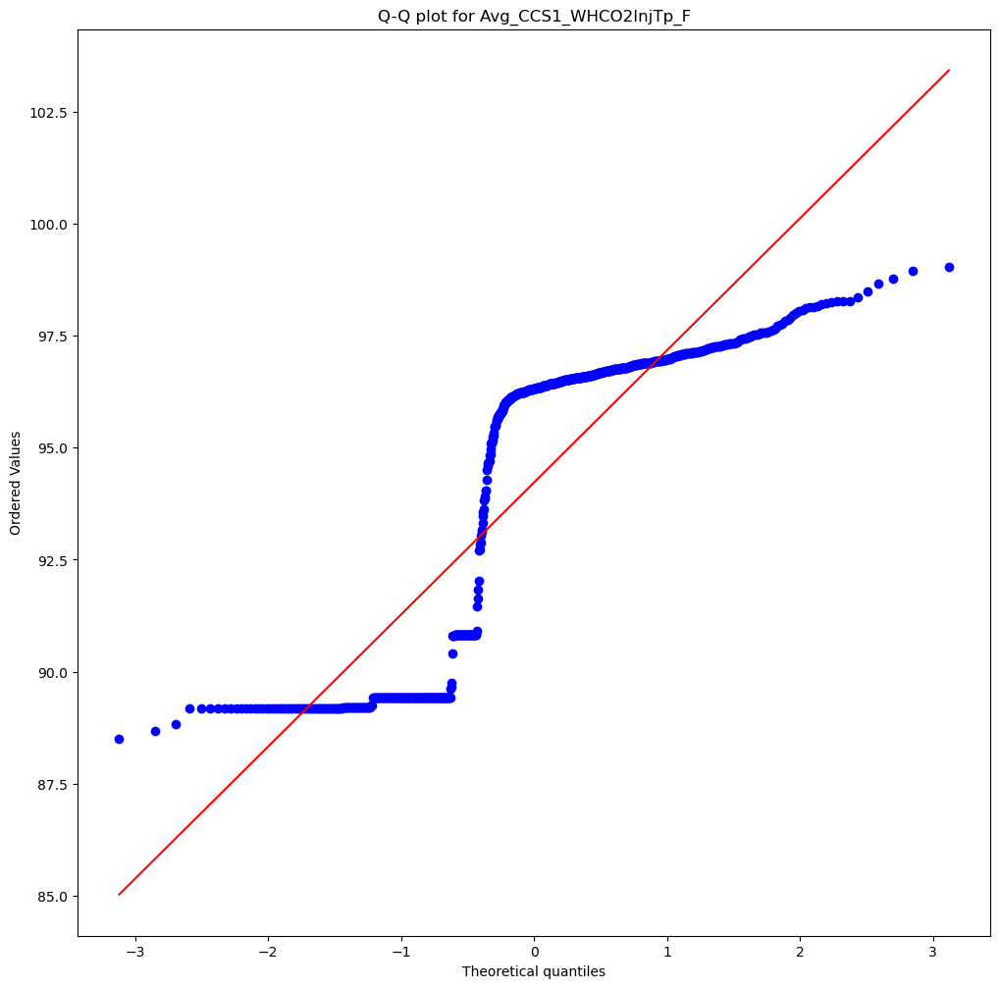

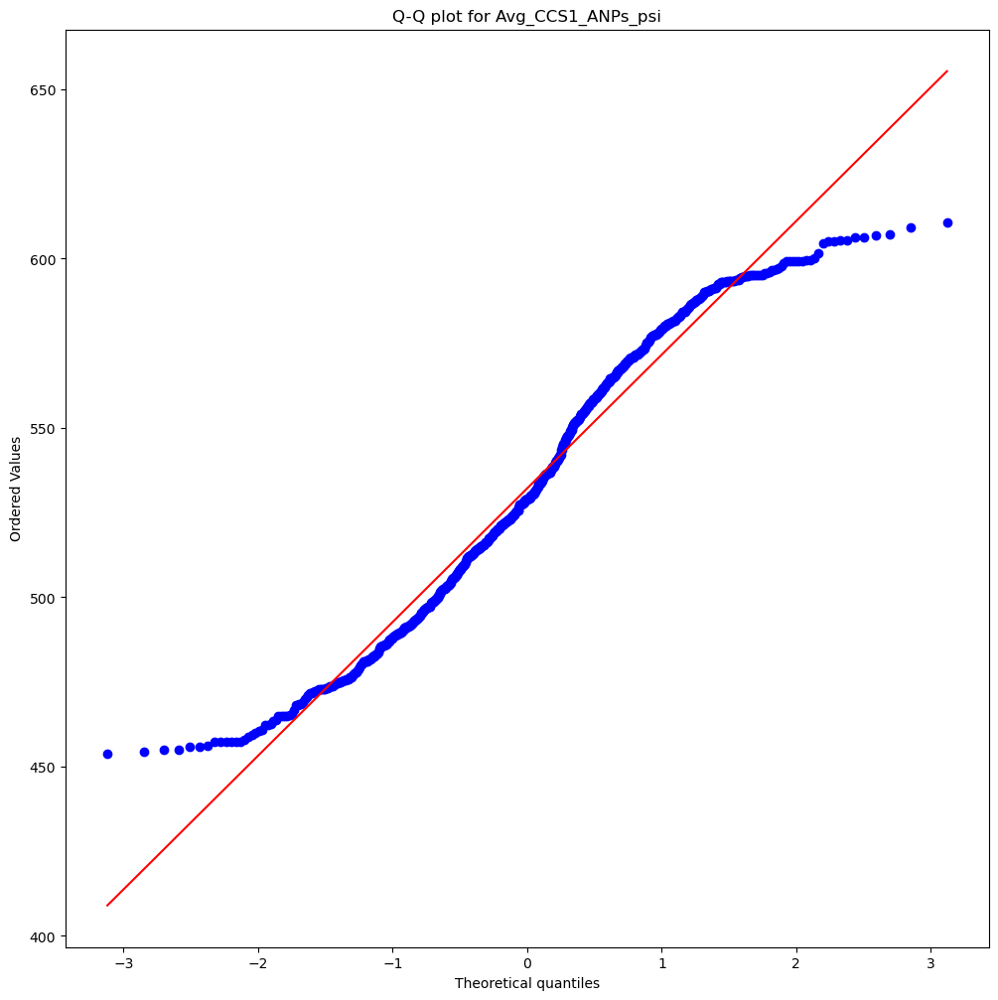

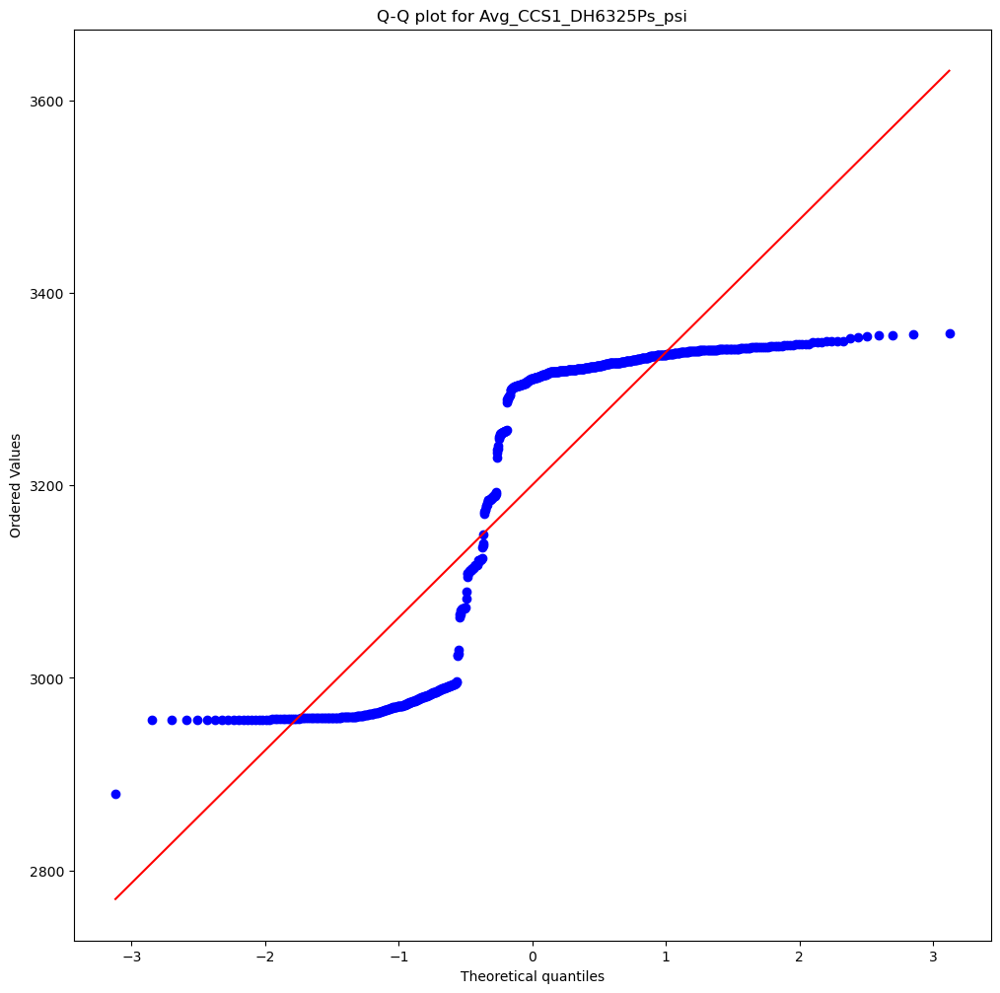

...

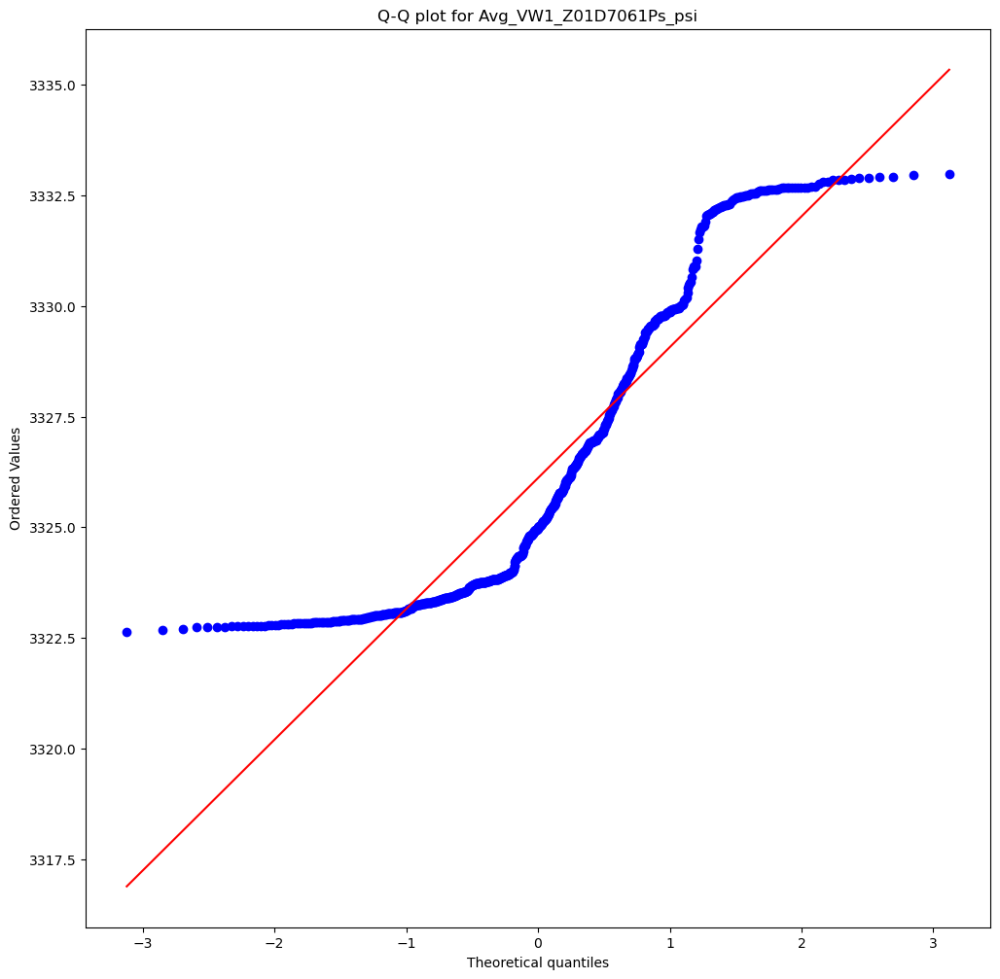

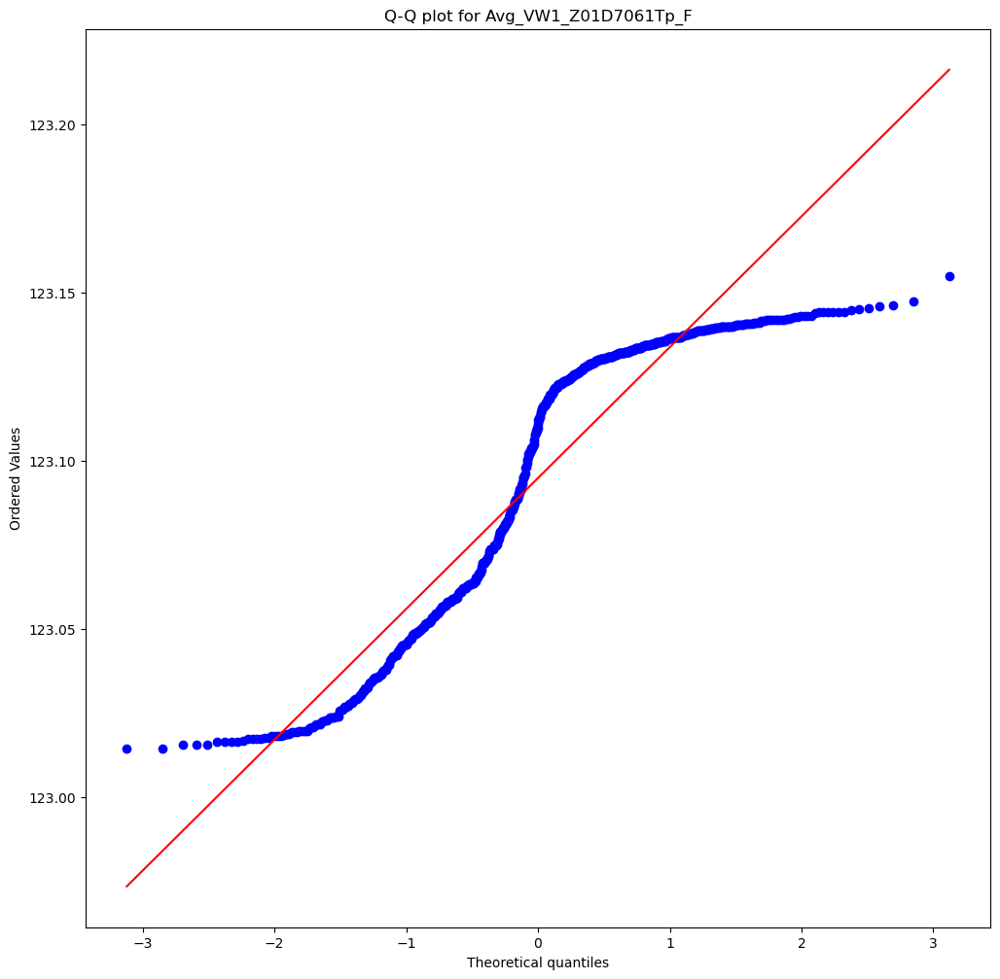

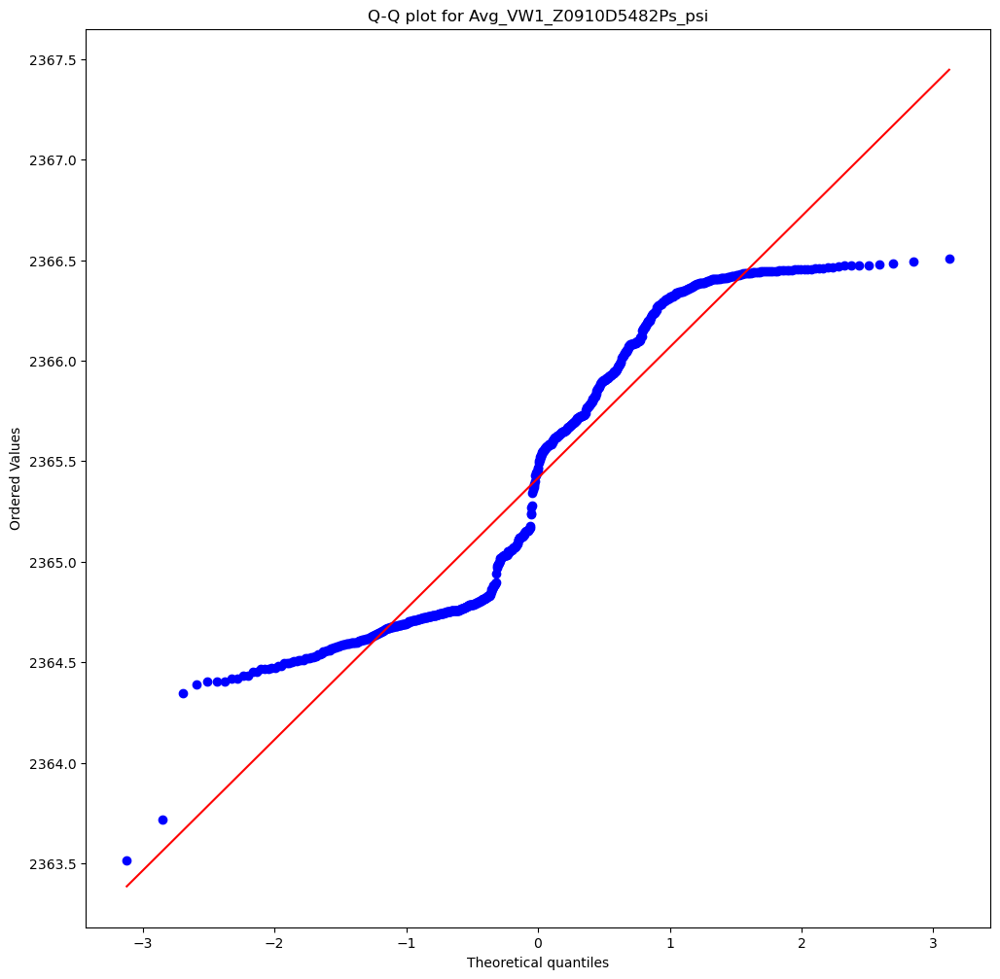

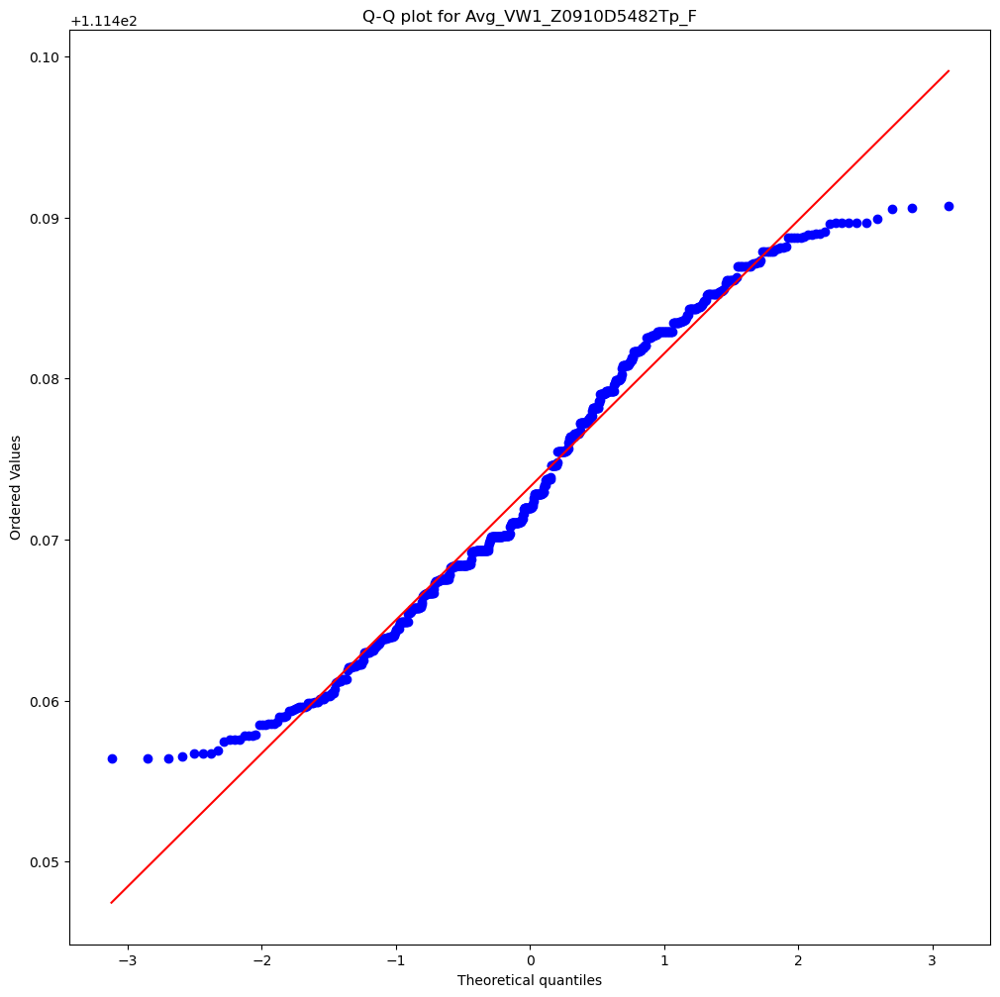

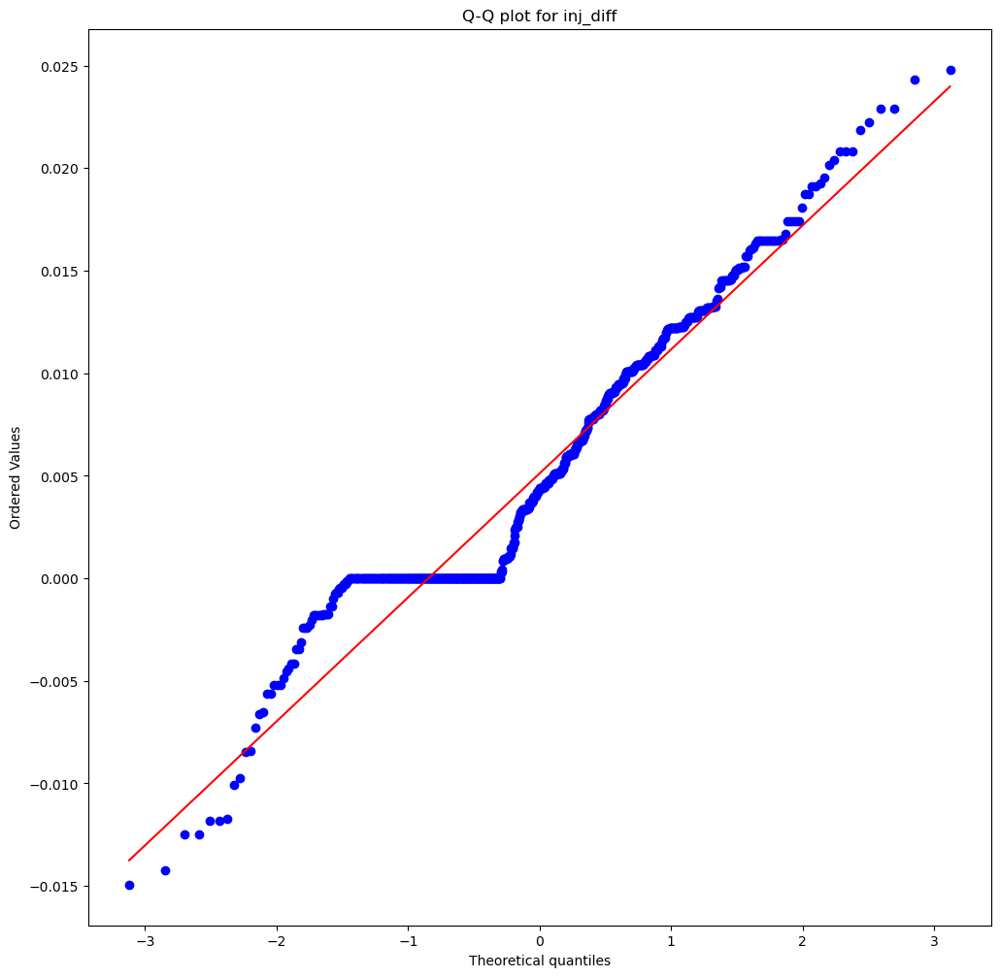

<Figure size 1200x1200 with 0 Axes>

In [1751]:
for col in train.columns:
    fig, ax = plt.subplots()
    probplot(train[col], dist='norm', plot=ax)
    ax.set_title(f'Q-Q plot for {col}')
plt.show()
plt.tight_layout() ;

C:\Users\Bbarb\AppData\Local\Temp\ipykernel_11976\1425932902.py:2: RuntimeWarning: More than 20 figures have been opened. Figures created through the pyplot interface (`matplotlib.pyplot.figure`) are retained until explicitly closed and may consume too much memory. (To control this warning, see the rcParam `figure.max_open_warning`). Consider using `matplotlib.pyplot.close()`.
  fig, ax = plt.subplots()


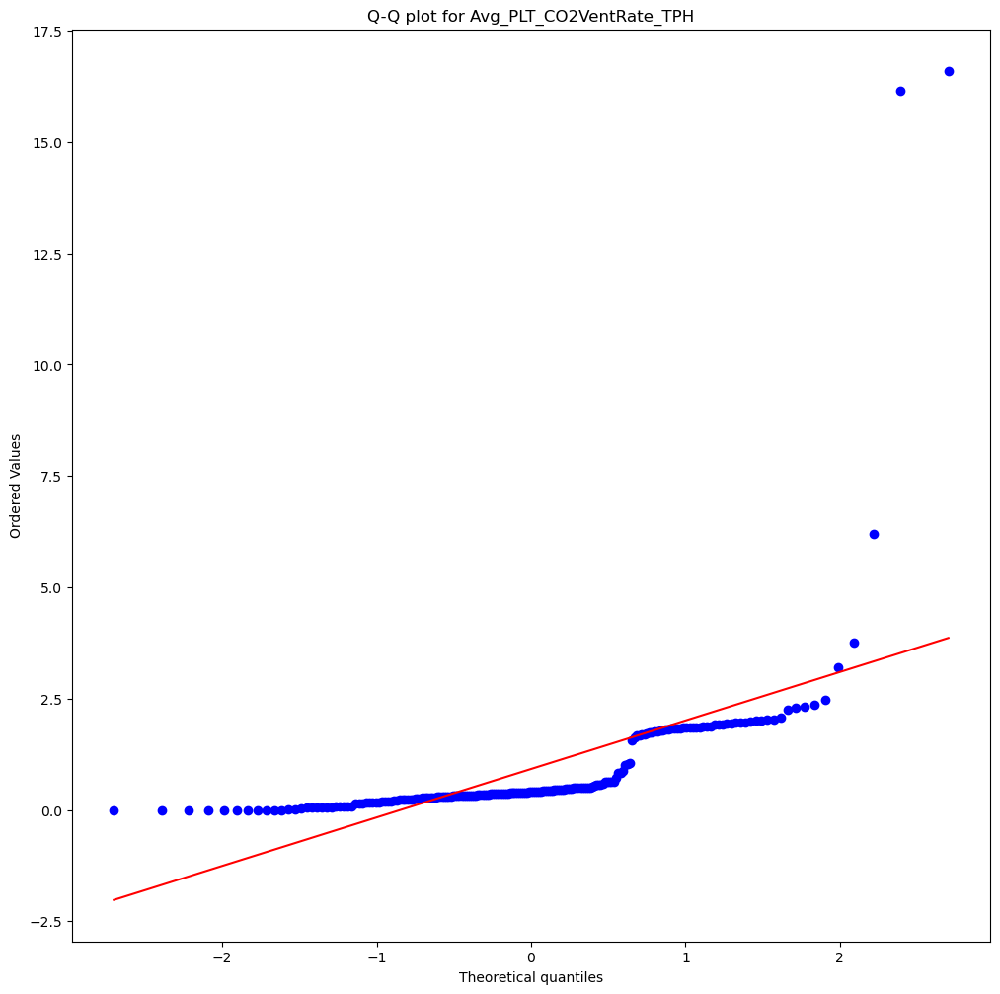

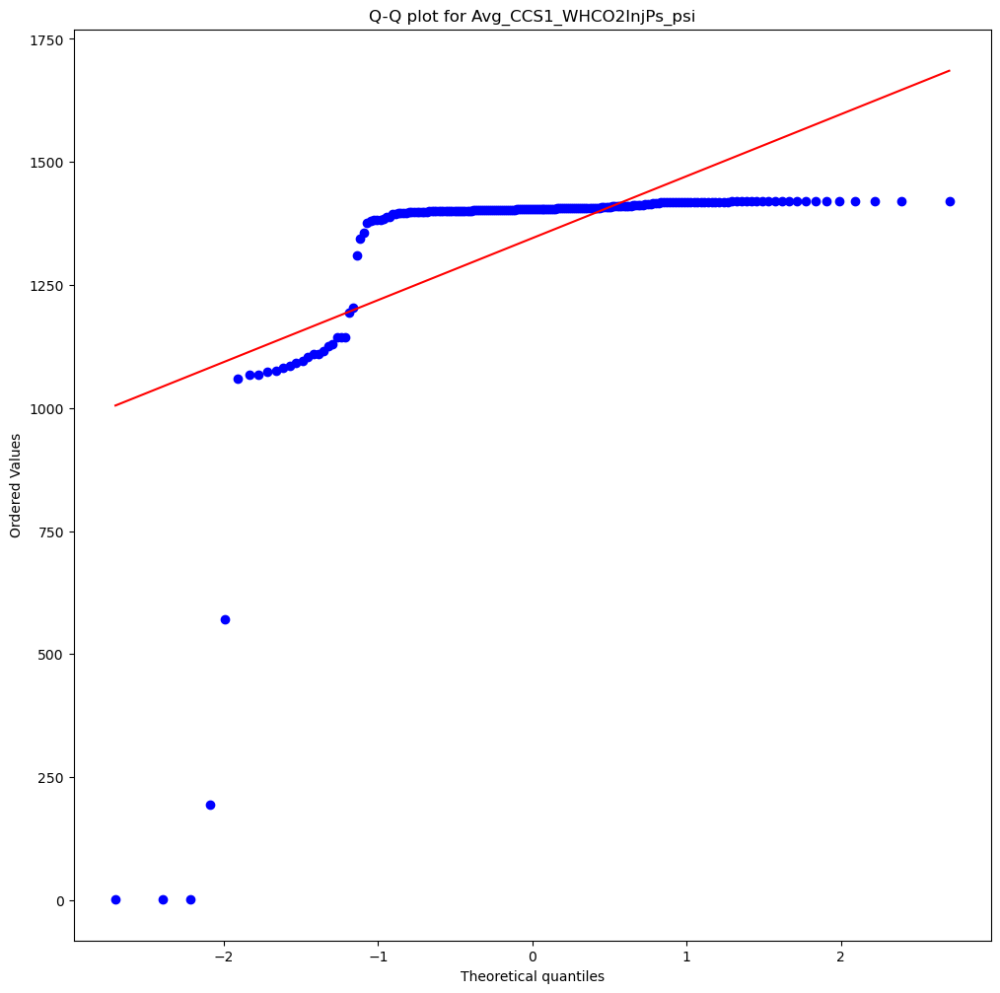

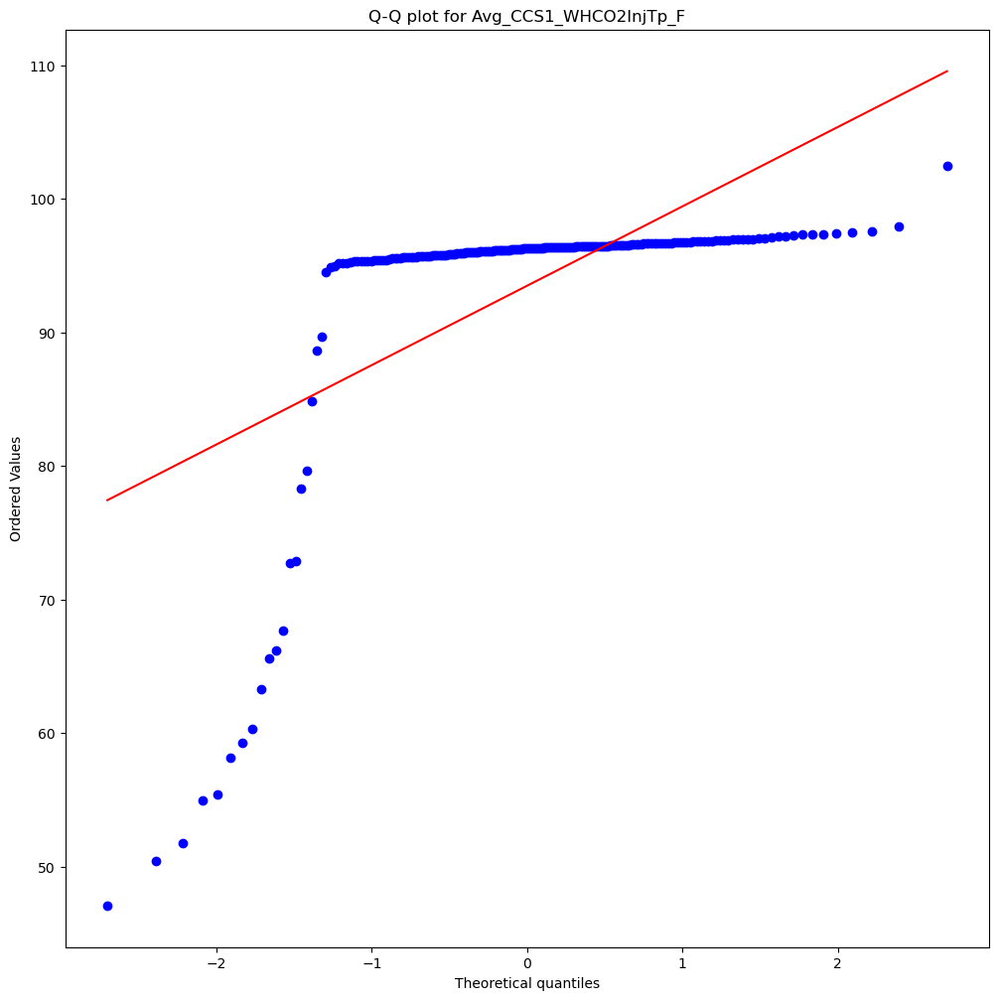

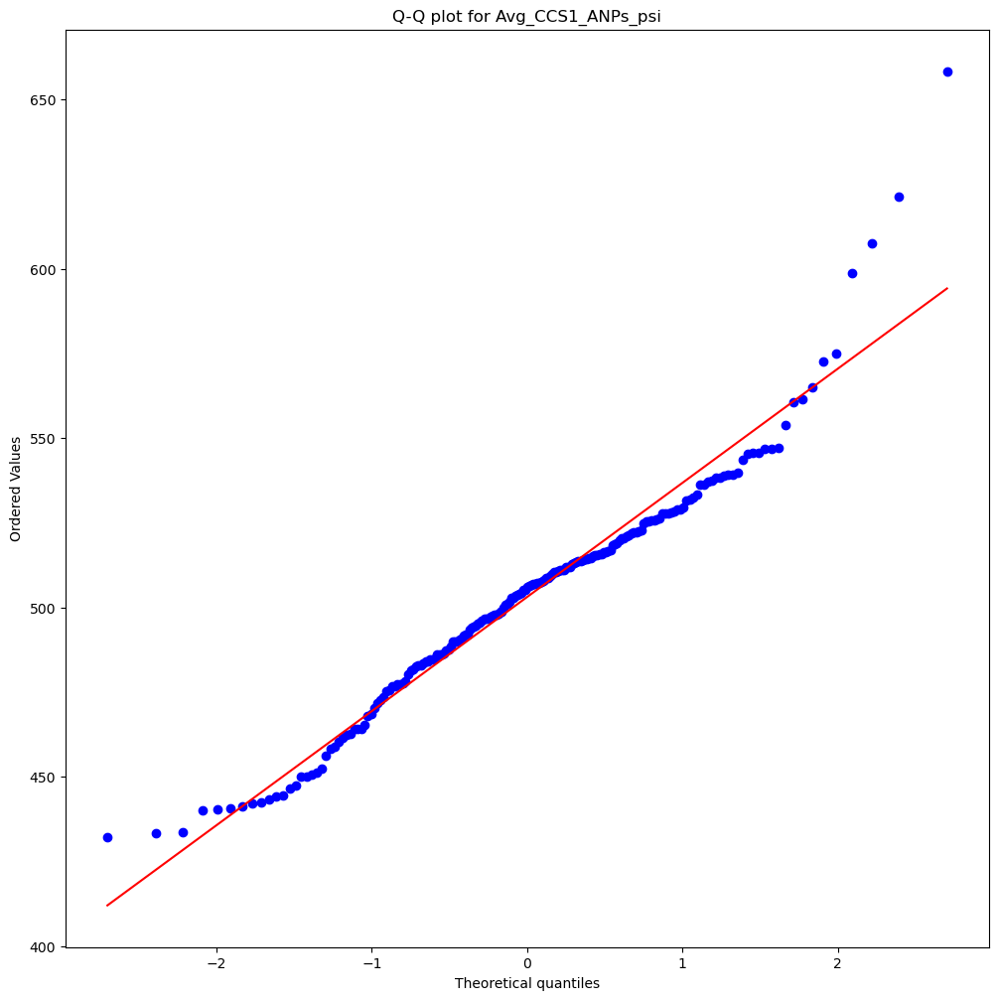

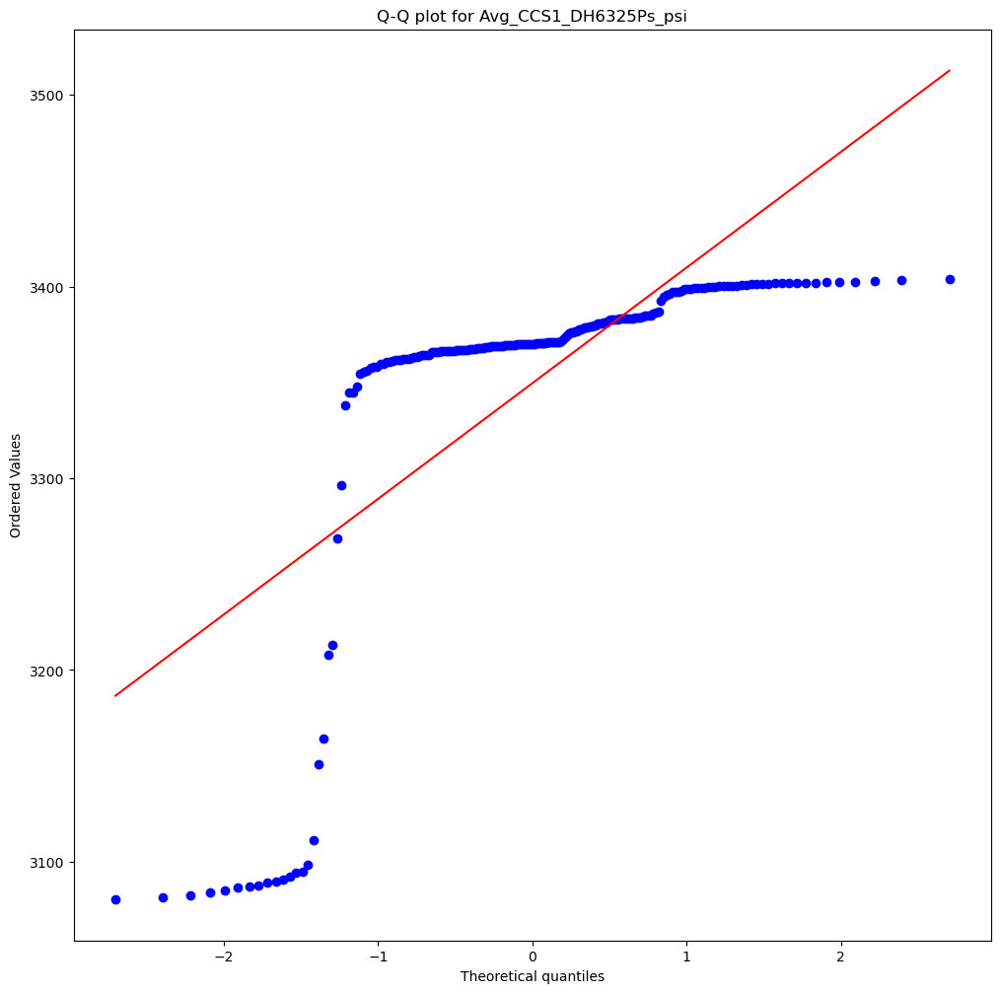

...

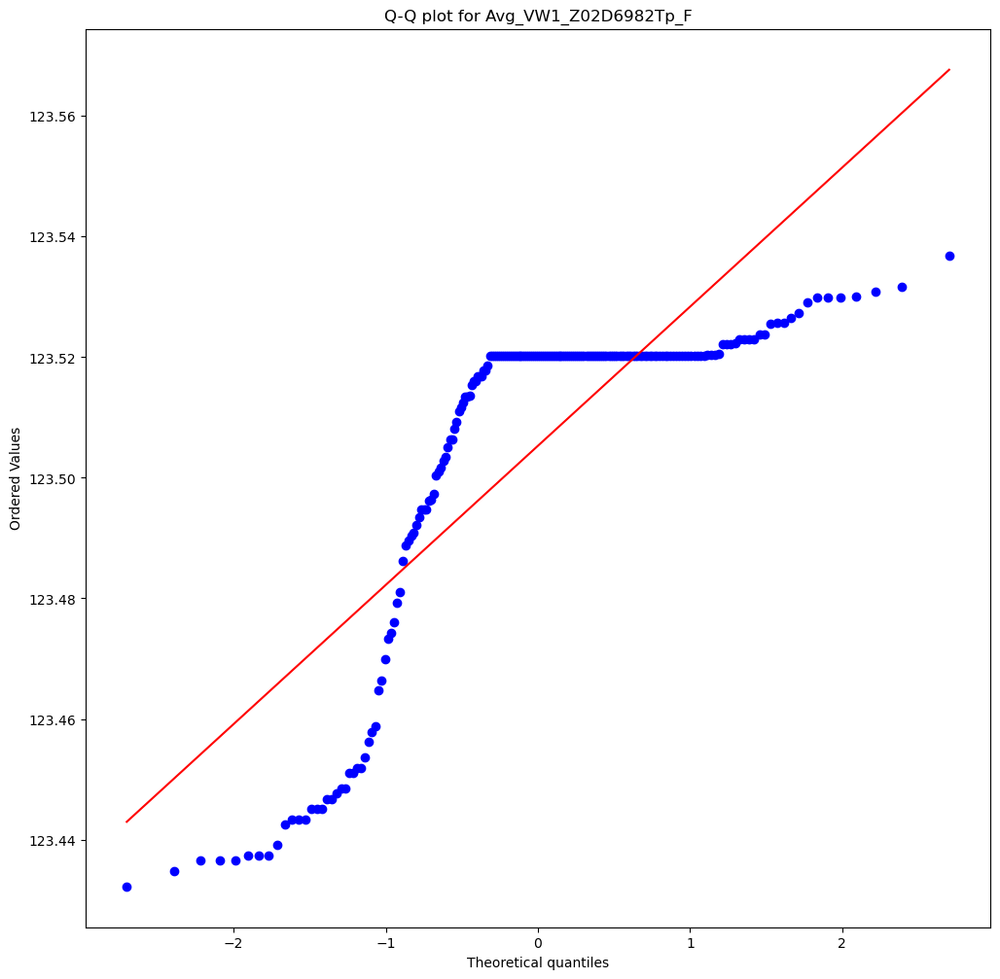

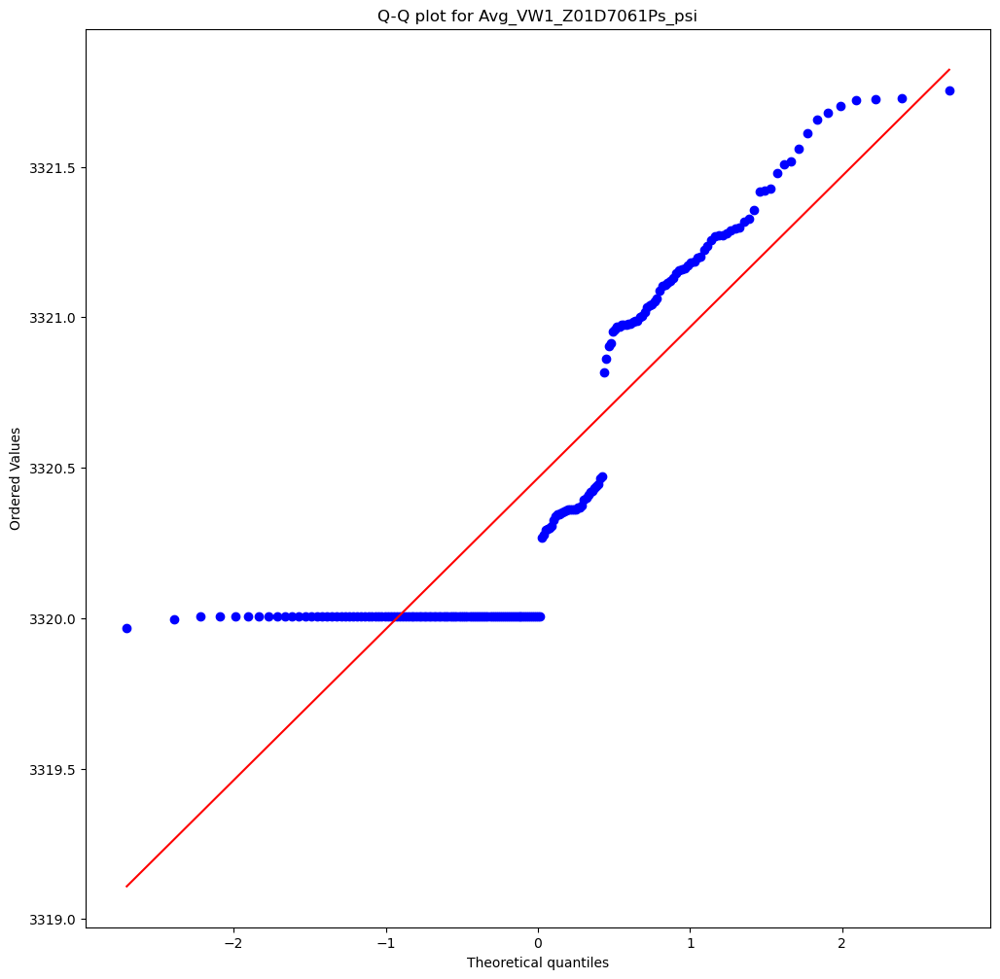

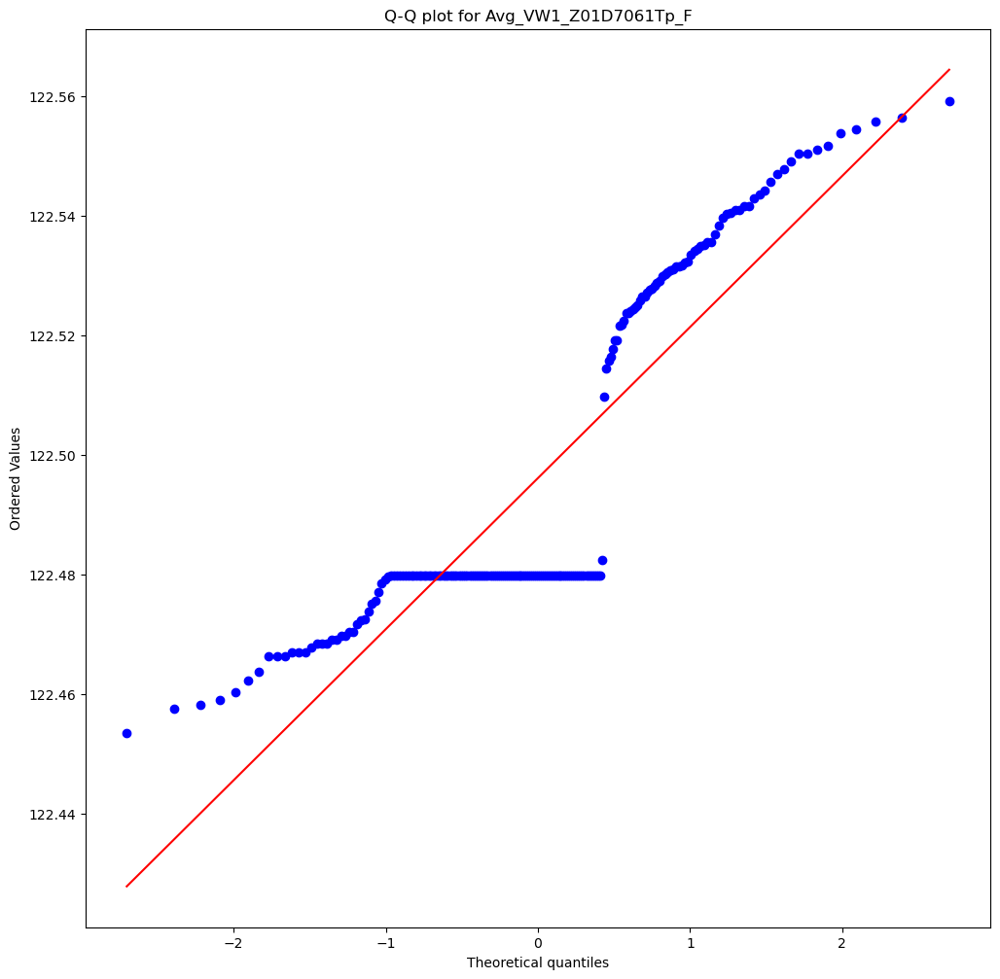

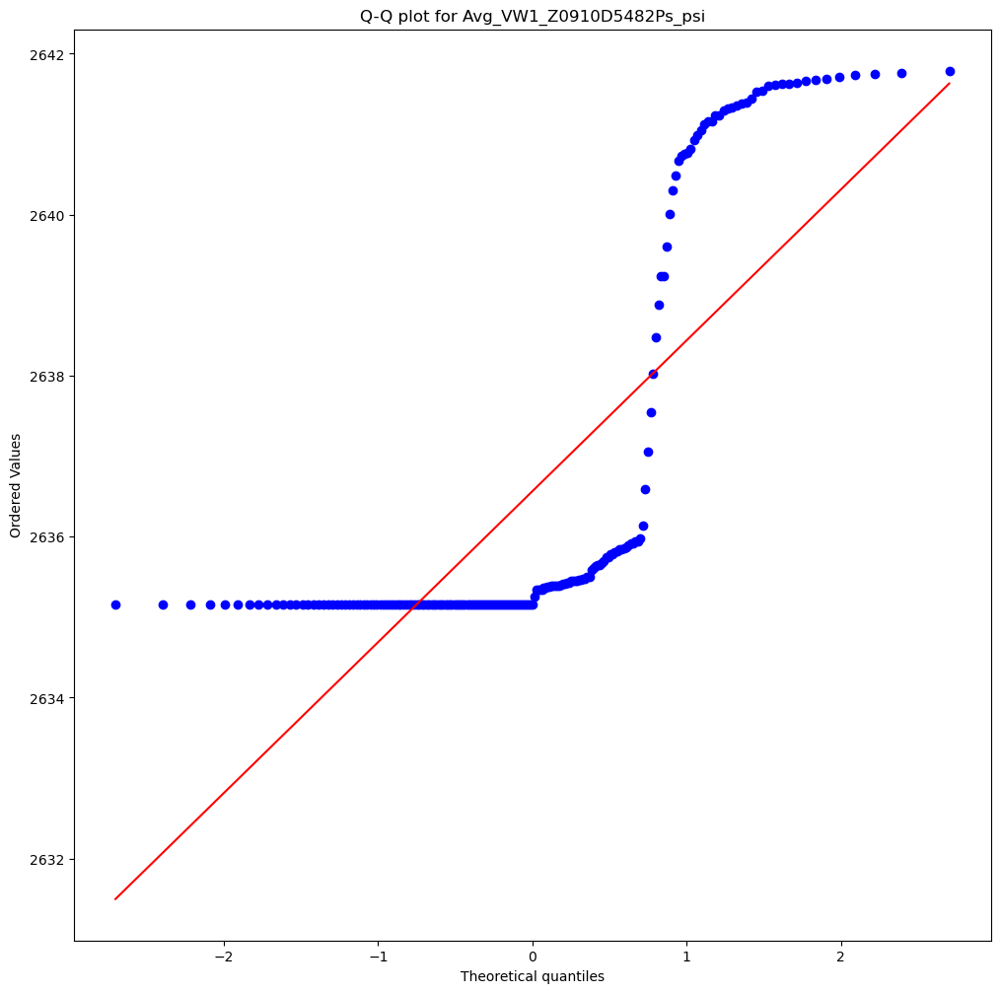

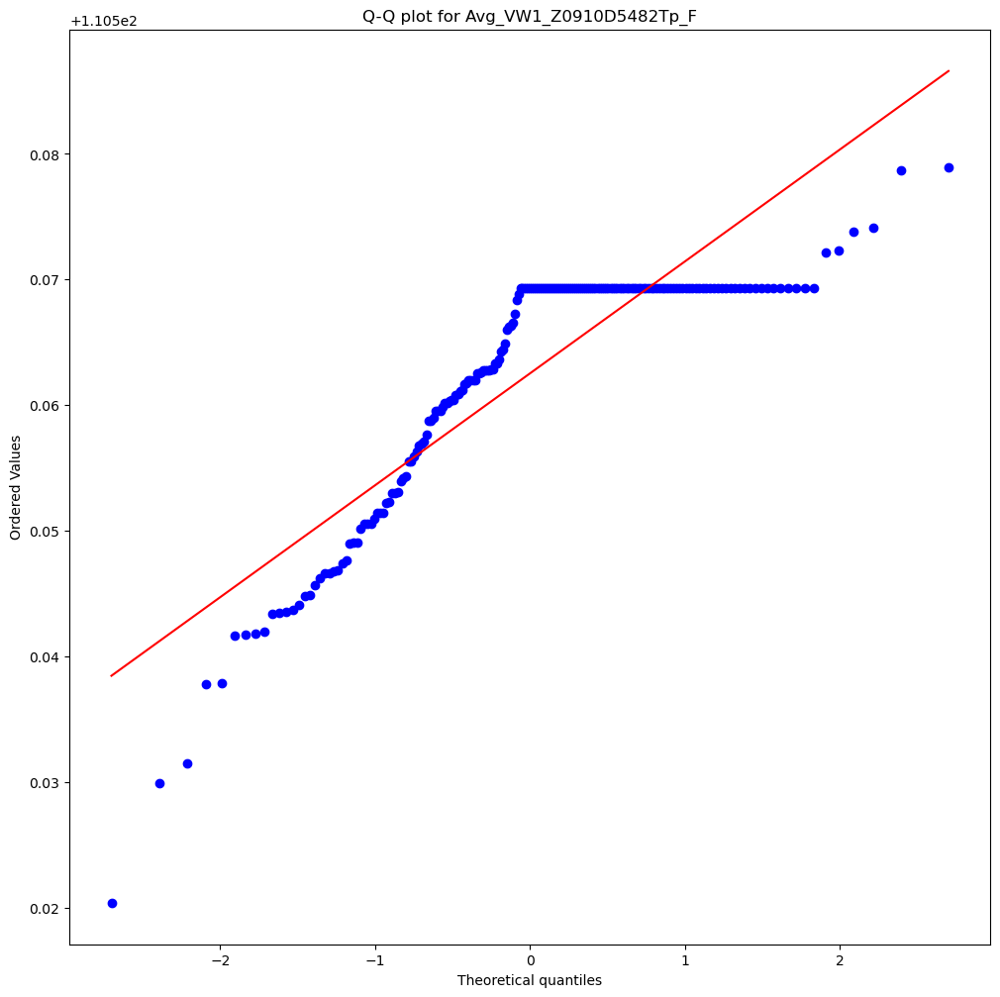

<Figure size 1200x1200 with 0 Axes>

In [1752]:
for col in test.columns:
    fig, ax = plt.subplots()
    probplot(test[col], dist='norm', plot=ax)
    ax.set_title(f'Q-Q plot for {col}')
plt.show()
plt.tight_layout();

### Cleaned Train Set Correlation Plot

In [1753]:
corr_train = train[train.columns[1:]].corr()['inj_diff'][:].sort_values(ascending=True).to_frame()

In [1754]:
corr_train

,inj_diff
Avg_VW1_Z04D6837Ps_psi,-0.495322
Avg_VW1_Z03D6945Tp_F,-0.460167
Avg_VW1_Z09D5653Ps_psi,-0.400392
Avg_VW1_Z07D6416Tp_F,-0.370689
Avg_VW1_Z01D7061Ps_psi,-0.363027
Avg_VW1_Z09D5653Tp_F,-0.287627
Avg_VW1_Z0910D5482Tp_F,-0.280083
Avg_VW1_Z05D6720Ps_psi,-0.162700
Avg_VW1_WBTbgPs_psi,-0.161998
Avg_VW1_Z07D6416Ps_psi,-0.003552


Text(0.5, 1.0, 'Train Set Correlation Matrix')

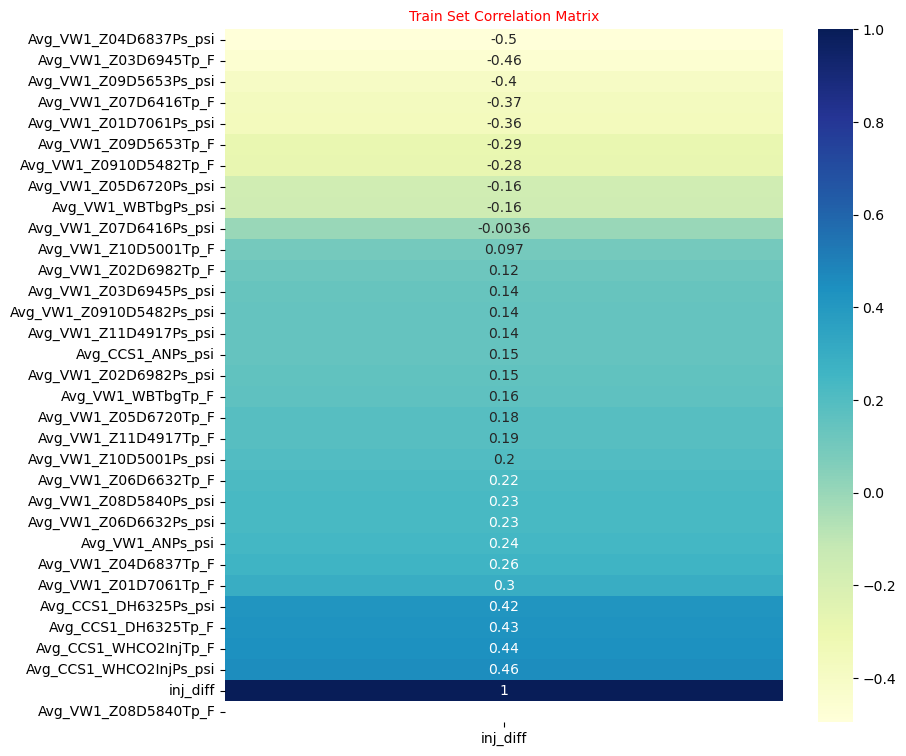

In [1755]:
plt.figure(figsize = (9,9))

ax = sns.heatmap(corr_train, annot=True,cmap="YlGnBu")
plt.title('Train Set Correlation Matrix', fontsize = 10, color = 'red')

### Train- Test Split Creating Validation Set

In [1756]:
X_train = train.drop(columns=['inj_diff'], axis =1)

In [1757]:
y_train = train['inj_diff']

In [1758]:
X_test = test

In [1759]:
scaler = MinMaxScaler()
scaler.fit(X_train)
X_train = pd.DataFrame(scaler.transform(X_train), columns=X_train.columns)

In [1760]:
scaler = MinMaxScaler()
scaler.fit(X_test)
X_test = pd.DataFrame(scaler.transform(X_test), columns=X_test.columns)

In [1761]:
X_train, X_val, y_train, y_val = train_test_split(X_train, y_train, test_size=0.2, random_state=42)

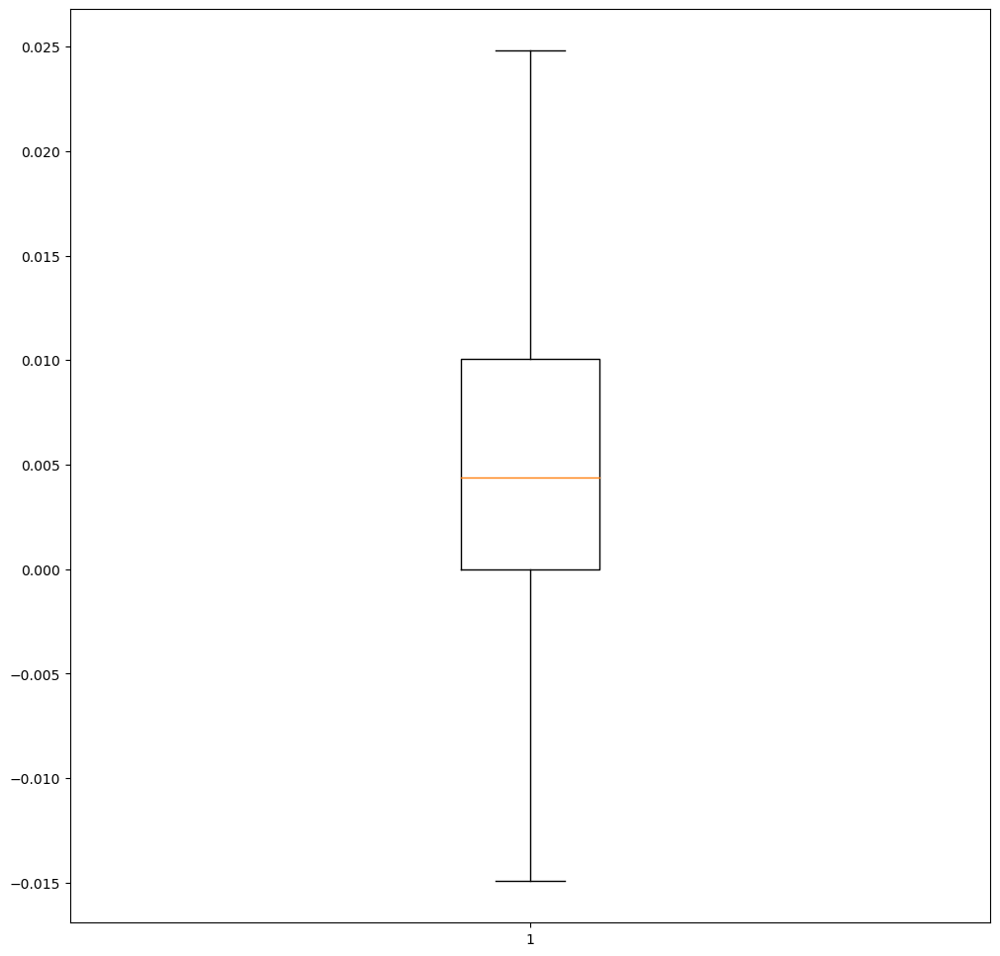

In [1762]:
plt.boxplot(train['inj_diff']);

In [1763]:
train['inj_diff'].describe()

count    767.000000
mean       0.005117
std        0.006223
min       -0.014931
25%        0.000000
50%        0.004386
75%        0.010061
max        0.024806
Name: inj_diff, dtype: float64

(array([-100.,    0.,  100.,  200.,  300.,  400.,  500.,  600.,  700.,
         800.,  900.]),
 [Text(-100.0, 0, '−100'),
  Text(0.0, 0, '0'),
  Text(100.0, 0, '100'),
  Text(200.0, 0, '200'),
  Text(300.0, 0, '300'),
  Text(400.0, 0, '400'),
  Text(500.0, 0, '500'),
  Text(600.0, 0, '600'),
  Text(700.0, 0, '700'),
  Text(800.0, 0, '800'),
  Text(900.0, 0, '900')])

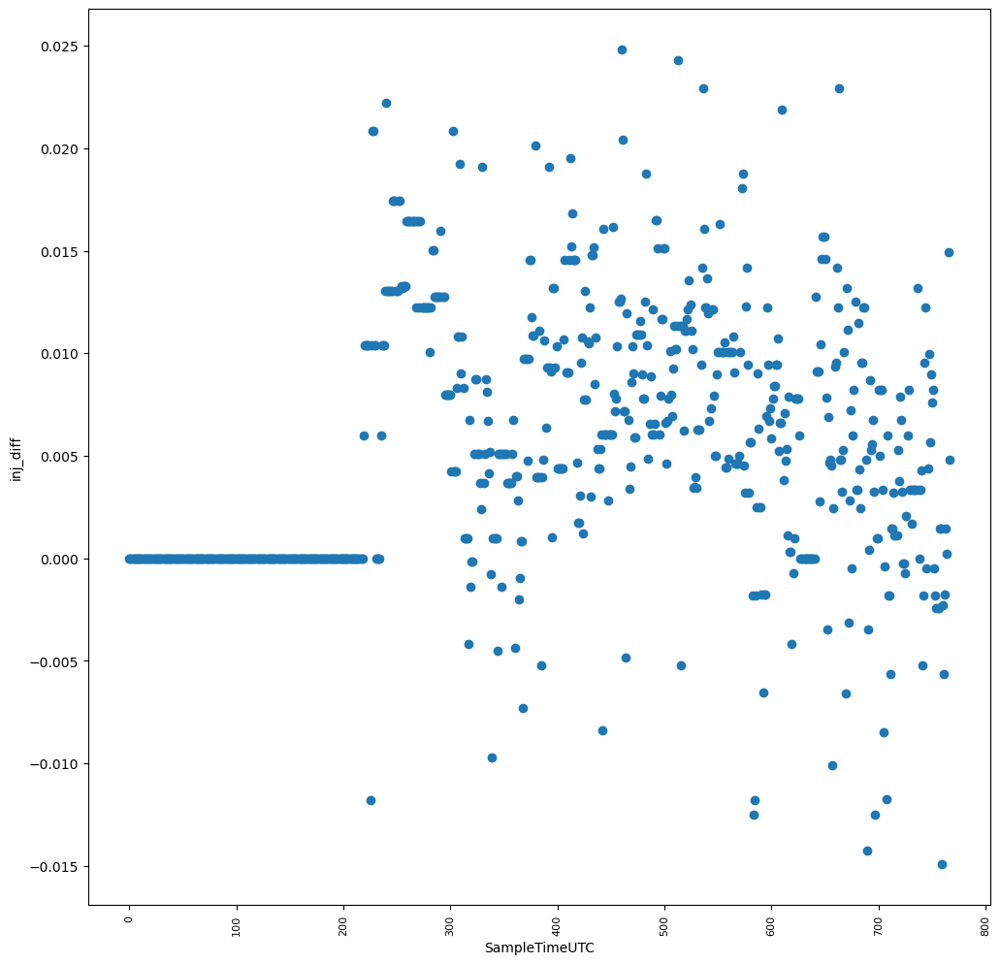

In [1764]:
plt.scatter(train.index, train['inj_diff'])
plt.xlabel('SampleTimeUTC')
plt.ylabel('inj_diff')
plt.xticks(rotation=90, fontsize =8)

# MODEL: Neural Network

In [1765]:
model = tf.keras.Sequential([
    tf.keras.layers.Dense(64, activation='relu', input_shape=(33,)),
    tf.keras.layers.Dense(34, activation='relu'),
    tf.keras.layers.Dense(1) ])

model.compile(loss='mean_squared_error', optimizer=tf.keras.optimizers.Adam(lr=0.001))
history = model.fit(X_train, y_train, epochs=100, batch_size=34, validation_split=0.2)

Epoch 1/100


B:\Anaconda\lib\site-packages\keras\optimizers\optimizer_v2\adam.py:114: UserWarning: The `lr` argument is deprecated, use `learning_rate` instead.
  super().__init__(name, **kwargs)


15/15 [==============================] - 1s 24ms/step - loss: 0.0194 - val_loss: 0.0111
Epoch 2/100
15/15 [==============================] - 0s 6ms/step - loss: 0.0046 - val_loss: 0.0015
Epoch 3/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0017 - val_loss: 0.0011
Epoch 4/100
15/15 [==============================] - 0s 5ms/step - loss: 0.0011 - val_loss: 9.7151e-04
Epoch 5/100
15/15 [==============================] - 0s 6ms/step - loss: 8.1747e-04 - val_loss: 8.7096e-04
Epoch 6/100
15/15 [==============================] - 0s 6ms/step - loss: 6.5650e-04 - val_loss: 7.9287e-04
Epoch 7/100
15/15 [==============================] - 0s 5ms/step - loss: 6.0009e-04 - val_loss: 8.8438e-04
Epoch 8/100
15/15 [==============================] - 0s 5ms/step - loss: 5.3829e-04 - val_loss: 7.4733e-04
Epoch 9/100
15/15 [==============================] - 0s 5ms/step - loss: 4.9449e-04 - val_loss: 5.8152e-04
Epoch 10/100
15/15 [==============================] - 0s 5ms/step - loss: 4.

15/15 [==============================] - 0s 5ms/step - loss: 4.5471e-05 - val_loss: 8.4579e-05
Epoch 78/100
15/15 [==============================] - 0s 5ms/step - loss: 3.6234e-05 - val_loss: 9.1352e-05
Epoch 79/100
15/15 [==============================] - 0s 5ms/step - loss: 3.6774e-05 - val_loss: 9.1476e-05
Epoch 80/100
15/15 [==============================] - 0s 5ms/step - loss: 4.3149e-05 - val_loss: 8.4333e-05
Epoch 81/100
15/15 [==============================] - 0s 6ms/step - loss: 4.2135e-05 - val_loss: 8.1733e-05
Epoch 82/100
15/15 [==============================] - 0s 5ms/step - loss: 4.0498e-05 - val_loss: 8.3259e-05
Epoch 83/100
15/15 [==============================] - 0s 5ms/step - loss: 3.9887e-05 - val_loss: 9.2553e-05
Epoch 84/100
15/15 [==============================] - 0s 5ms/step - loss: 3.3378e-05 - val_loss: 7.7692e-05
Epoch 85/100
15/15 [==============================] - 0s 5ms/step - loss: 3.2192e-05 - val_loss: 7.9014e-05
Epoch 86/100
15/15 [=====================

In [1766]:
train_loss = model.evaluate(X_train, y_train)
val_loss = model.evaluate(X_val, y_val)
print('Training loss:', train_loss)
print('Validation loss:', val_loss)

new_data_predictions = model.predict(X_test)

5/5 [==============================] - 0s 2ms/step - loss: 8.0149e-05
Training loss: 3.5504624975146726e-05
Validation loss: 8.014945342438295e-05
7/7 [==============================] - 0s 4ms/step


### Training and Validation Loss Plot

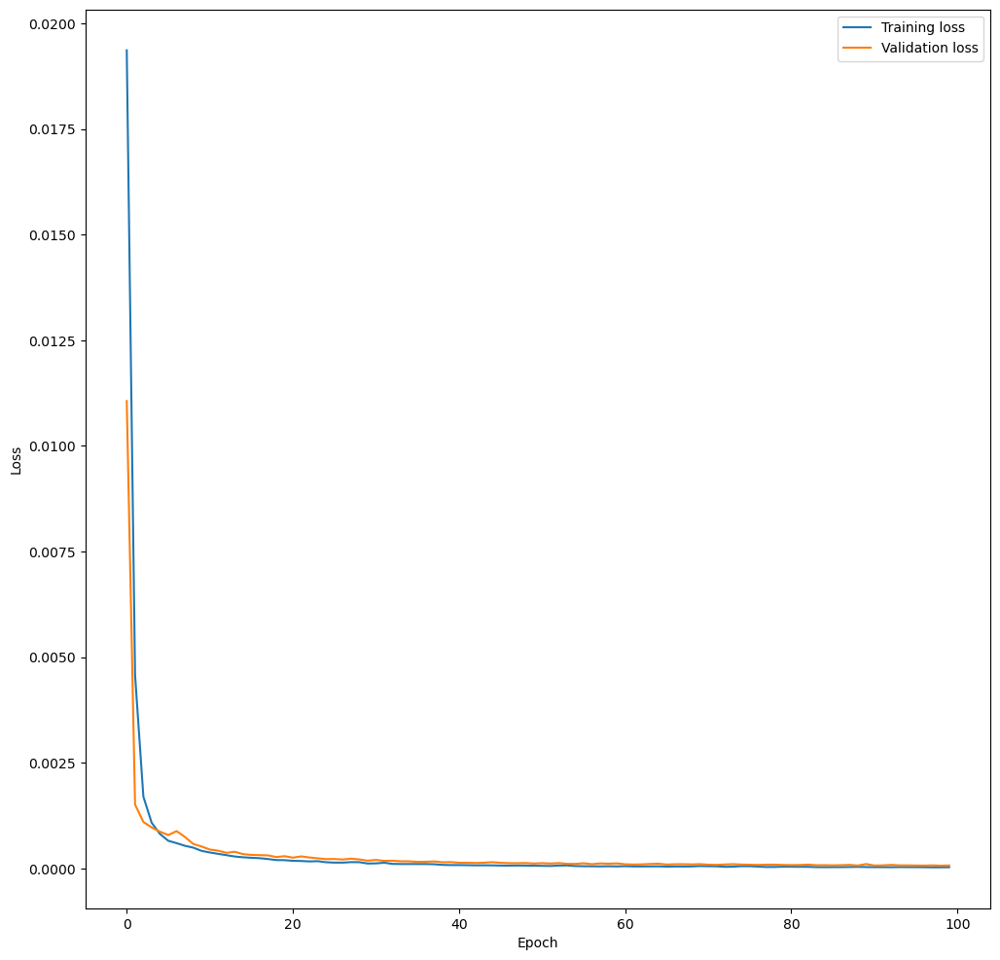

In [1767]:
train_loss = history.history['loss']
val_loss = history.history['val_loss']


plt.plot(train_loss, label='Training loss')
plt.plot(val_loss, label='Validation loss')
plt.xlabel('Epoch')
plt.ylabel('Loss')
plt.legend()
plt.show();

In [1768]:
y_pred = pd.DataFrame(new_data_predictions, columns=['inj_diff'])

In [1769]:
y_pred

,inj_diff
0,0.100752
1,0.099305
2,0.125069
3,0.153778
4,0.111666
...,...
196,0.009890
197,0.023728
198,-0.031068
199,-0.042420


# SAVING RESULT

In [1770]:
R = pd.DataFrame()
R['inj_diff'] = y_pred

In [1771]:
R.to_csv('predicted_data.csv', index=False)
R
R.describe()

,inj_diff
count,201.000000
mean,0.020770
std,0.057702
min,-0.112286
25%,-0.014073
50%,0.028427
75%,0.039984
max,0.161508
